In [18]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import os
import shutil
import re
import seaborn as sns
from itertools import combinations
import numpy as np
import xgboost
import lightgbm
#import tensorflow as tf
from pymatgen.core.structure import Structure
import ast
import time

In [19]:
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler

from sklearn.linear_model import LinearRegression, Ridge, Lasso, ElasticNet, HuberRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, ExtraTreesRegressor, HistGradientBoostingRegressor
from sklearn.svm import SVR
from sklearn.kernel_ridge import KernelRidge
from sklearn.neighbors import KNeighborsRegressor
from sklearn.neural_network import MLPRegressor

from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error


In [20]:
sns.set_style("white") 

In [21]:
working_dir = '/home/parastoo/Desktop/ML_project/analysis/ML_project/paper_files/'
surfaces_dir = '/home/parastoo/Desktop/ML_project/analysis/ML_project/transferred_files/'

In [22]:
Subhmoy_materials_str = 'Co3Ni  CoPt3  CuPt   Fe3Co   FeCo  FeNi3  FePt3  NiPt VPt   VPt3  Zn11Co2  Zn13Co  Zn22Ni3 Zn3Cu  Zn8Cu5  ZnCu  ZnPt Co3Pt  Cu3Pt  CuPt7  Fe9Co7  FeNi  FePt   Ni3Pt  NiPt3  V3Pt VPt2  VPt8  Zn11Ni2  Zn13Fe  Zn35Cu17  Zn3Pt  Zn9Fe4  ZnNi  ZnPt3'
Subhmoy_materials = Subhmoy_materials_str.split()

Satvik_materials_str = 'Al13Fe4  Al3Ni   Al3Pt5  Al5Co2  AlCu3  AlNi3  AlV   V3Ni   VFe3 Al21Pt8  Al3Ni2  Al3V    Al9Co2   AlFe   AlPt   AlV3  V3Ni2  VNi2 Al2Cu    Al3Ni5  Al4Cu9  AlCo    AlFe3  AlPt2  V3Co  V4Zn5  VNi3 Al2Pt    Al3Pt2  Al4Ni3  AlCu    AlNi   AlPt3  V3Fe  VCo3   VZn3'
Satvik_materials = Satvik_materials_str.split()

In [23]:
pd.set_option('display.max_rows', 2000)
pd.set_option('display.max_columns', 2000)
pd.set_option('display.width', 2000)
pd.set_option('display.max_colwidth', 2000)

In [24]:
df_raw_N2 = pd.read_csv(f'../dataframes/input_df_N2_bandcenter_v1.csv')
df_raw_H2 = pd.read_csv(f'../dataframes/input_df_H2_bandcenter_v1.csv')
df_raw_N2H = pd.read_csv(f'../dataframes/input_df_N2H_bandcenter_v1.csv')
df_raw_NH3 = pd.read_csv(f'../dataframes/input_df_NH3_bandcenter_v1.csv')

In [25]:
#tilted as a category in orientation in some cases is closed to horizontal and some case to vertical, I wanna
#divide them
df = df_raw_N2
import numpy as np

# mask only tilted rows
mask = df["orientation"] == "tilted"
angles = df.loc[mask, "angle"]

# conditions for tilted rows
condlist = [
    # Case 1: angle < 90 and angle > 45 → tilted_horizontal
    (angles < 90) & (angles > 45),

    # Case 2: angle < 90 and angle <= 45 → tilted_vertical
    (angles < 90) & (angles <= 45),

    # Case 3: angle > 90 and abs(angle-180) < 45 → tilted_vertical
    (angles > 90) & (np.abs(angles - 180) < 45),

    # Case 4: angle > 90 and abs(angle-180) >= 45 → tilted_horizontal
    (angles > 90) & (np.abs(angles - 180) >= 45),
]

choicelist = ["tilted_horizontal", "tilted_vertical", "tilted_vertical", "tilted_horizontal"]

# update orientation only for tilted rows
df.loc[mask, "orientation"] = np.select(condlist, choicelist, default="tilted")
df_raw_N2 = df


In [26]:
#tilted as a category in orientation in some cases is closed to horizontal and some case to vertical, I wanna
#divide them
df = df_raw_N2H
import numpy as np

# mask only tilted rows
mask = df["orientation"] == "tilted"
angles = df.loc[mask, "angle"]

# conditions for tilted rows
condlist = [
    # Case 1: angle < 90 and angle > 45 → tilted_horizontal
    (angles < 90) & (angles > 45),

    # Case 2: angle < 90 and angle <= 45 → tilted_vertical
    (angles < 90) & (angles <= 45),

    # Case 3: angle > 90 and abs(angle-180) < 45 → tilted_vertical
    (angles > 90) & (np.abs(angles - 180) < 45),

    # Case 4: angle > 90 and abs(angle-180) >= 45 → tilted_horizontal
    (angles > 90) & (np.abs(angles - 180) >= 45),
]

choicelist = ["tilted_horizontal", "tilted_vertical", "tilted_vertical", "tilted_horizontal"]

# update orientation only for tilted rows
df.loc[mask, "orientation"] = np.select(condlist, choicelist, default="tilted")
df_raw_N2H = df


In [27]:
df_N2 = df_raw_N2.copy()
df_H2 = df_raw_H2.copy()
df_N2H = df_raw_N2H.copy()
df_NH3 = df_raw_NH3.copy()

In [28]:
# ---- set filtering range 
low, high = -5, 5   # adsorption energy window in eV

# ---- filter each dataset without modifying originals ----
df_N2_f   = df_N2[(df_N2["ads_e"] >= low) & (df_N2["ads_e"] <= high)]
df_N2H_f  = df_N2H[(df_N2H["ads_e"] >= low) & (df_N2H["ads_e"] <= high)]
df_NH3_f  = df_NH3[(df_NH3["ads_e"] >= low) & (df_NH3["ads_e"] <= high)]
df_H2_f   = df_H2[(df_H2["ads_e"] >= low) & (df_H2["ads_e"] <= high)]

print(df_N2_f.shape)
print(df_N2H_f.shape)
print(df_NH3_f.shape)
print(df_H2_f.shape)

(425, 566)
(394, 566)
(493, 564)
(502, 564)


In [29]:
# Convert each 'material' column to a set
set_N2   = set(df_N2_f["material"])
set_N2H  = set(df_N2H_f["material"])
set_NH3  = set(df_NH3_f["material"])
set_H2   = set(df_H2_f["material"])

# Find intersection across all four sets
mutual_materials = set_N2 & set_N2H & set_NH3 & set_H2

# If you want it as a list
mutual_materials_list = list(mutual_materials)

print("Number of mutual materials:", len(mutual_materials_list))
print(mutual_materials_list)


Number of mutual materials: 47
['10_Zn11Co2', '23_Ni3Pt', '19_CuPt7', '18_Cu3Pt', '27_Al2Pt', '34_ZnPt3', '6_FePt3', '10_Al3Ni2', '16_V3Ni2', '24_NiPt3', '6_AlV', '15_ZnCu', '4_FeCo', '15_AlV3', '33_V3Fe', '22_AlFe3', '26_VNi3', '7_NiPt', '11_Al3V', '18_Al2Cu', '35_VZn3', '31_Zn3Pt', '8_VFe3', '24_V3Co', '3_Fe3Co', '5_FeNi3', '5_AlNi3', '31_AlNi', '28_Al3Pt2', '20_Fe9Co7', '20_Al4Cu9', '13_AlFe', '7_V3Ni', '25_V3Pt', '33_ZnNi', '1_Al3Ni', '32_AlPt3', '14_Zn8Cu5', '0_Co3Ni', '32_Zn9Fe4', '21_AlCo', '13_Zn3Cu', '21_FeNi', '8_VPt', '1_CoPt3', '34_VCo3', '17_Co3Pt']


In [30]:
# Filter each dataframe to only keep mutual materials
df_N2_f  = df_N2_f[df_N2_f["material"].isin(mutual_materials_list)]
df_N2H_f = df_N2H_f[df_N2H_f["material"].isin(mutual_materials_list)]
df_NH3_f = df_NH3_f[df_NH3_f["material"].isin(mutual_materials_list)]
df_H2_f  = df_H2_f[df_H2_f["material"].isin(mutual_materials_list)]


In [31]:
df_H2_f.shape

(447, 564)

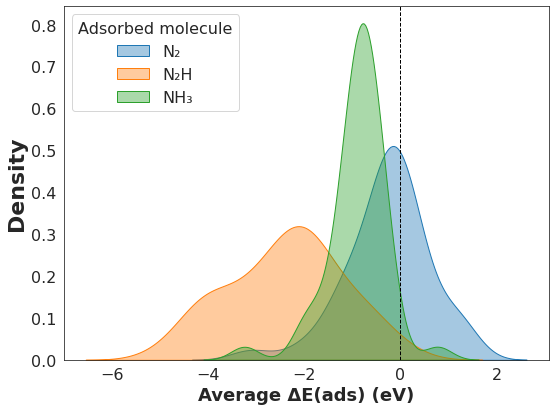

In [32]:
#distribution of adsorbtion energies (all materials together)

df_N2_mol = df_N2_f[df_N2_f["Mol_is_adsorbed"] == 1]
df_N2H_mol = df_N2H_f[df_N2H_f["Mol_is_adsorbed"] == 1]
df_NH3_mol = df_NH3_f[df_NH3_f["Mol_is_adsorbed"] == 1]
df_H2_mol = df_H2_f[df_H2_f["Mol_is_adsorbed"] == 1]

df_N2_dis = df_N2_f[df_N2_f["atomic_is_adsorbed"] == 1]
df_H2_dis = df_H2_f[df_H2_f["atomic_is_adsorbed"] == 1]

# --- 1) Per-material averages from filtered datasets ---
N2_avg  = df_N2_mol.groupby("material", as_index=False)["ads_e"].mean().rename(columns={"ads_e": "E"})
N2H_avg = df_N2H_mol.groupby("material", as_index=False)["ads_e"].mean().rename(columns={"ads_e": "E"})
NH3_avg = df_NH3_mol.groupby("material", as_index=False)["ads_e"].mean().rename(columns={"ads_e": "E"})
H2_avg  = df_H2_mol.groupby("material", as_index=False)["ads_e"].mean().rename(columns={"ads_e": "E"})
# --- 2) Plot ---
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams["font.size"] = 16  # base font size

fig, ax = plt.subplots(figsize=(8, 6))

sns.kdeplot(N2_avg["E"],  fill=True, alpha=0.4, ax=ax, label="N₂")
sns.kdeplot(N2H_avg["E"], fill=True, alpha=0.4, ax=ax, label="N₂H")
sns.kdeplot(NH3_avg["E"], fill=True, alpha=0.4, ax=ax, label="NH₃")
#sns.kdeplot(H2_avg["E"],  fill=True, alpha=0.4, ax=ax, label="H₂")
# Axis labels with larger font size + bold
ax.set_xlabel("Average ΔE(ads) (eV)", fontsize=18, fontweight="bold")
ax.set_ylabel("Density", fontsize=22, fontweight="bold")

# Reference line
ax.axvline(0, color="k", linestyle="--", linewidth=1)

# Legend with bigger font
ax.legend(title="Adsorbed molecule", fontsize=16, title_fontsize=16)

plt.tight_layout()
plt.savefig("avg_adsorption_molecular_distributions_noH2.pdf", dpi=600, bbox_inches="tight")
plt.show()
#N2H is more dependent on the local environment

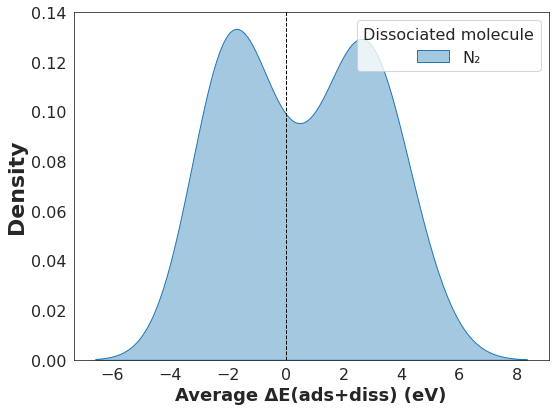

In [33]:
#distribution of adsorbtion energies (all materials together)-dissociated

df_N2_dis = df_N2_f[df_N2_f["atomic_is_adsorbed"] == 1]
df_H2_dis = df_H2_f[df_H2_f["atomic_is_adsorbed"] == 1]

# --- 1) Per-material averages from filtered datasets ---
N2_avg  = df_N2_dis.groupby("material", as_index=False)["ads_e"].mean().rename(columns={"ads_e": "E"})
H2_avg  = df_H2_dis.groupby("material", as_index=False)["ads_e"].mean().rename(columns={"ads_e": "E"})

# --- 2) Plot ---
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams["font.size"] = 16  # base font size

fig, ax = plt.subplots(figsize=(8, 6))

sns.kdeplot(N2_avg["E"],  fill=True, alpha=0.4, ax=ax, label="N₂")
#sns.kdeplot(H2_avg["E"], fill=True, alpha=0.4, ax=ax, label="H₂")

# Axis labels with larger font size + bold
ax.set_xlabel("Average ΔE(ads+diss) (eV)", fontsize=18, fontweight="bold")
ax.set_ylabel("Density", fontsize=22, fontweight="bold")

# Reference line
ax.axvline(0, color="k", linestyle="--", linewidth=1)

# Legend with bigger font
ax.legend(title="Dissociated molecule", fontsize=16, title_fontsize=16)

plt.tight_layout()
plt.savefig("avg_adsorption_atomic_distributions_noH2.pdf", dpi=600, bbox_inches="tight")
plt.show()
#N2H is more dependent on the local environment

In [34]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# ---------- SETTINGS ----------
row_filter = ("Mol_is_adsorbed", 1)  # set to None to disable
plt.rcParams["font.family"] = "Times New Roman"
plt.rcParams["font.size"] = 16

def plot_topN_by_mean(df, molecule_label, save_basename, top_n=10, row_filter=None):
    d = df.copy()
    if row_filter is not None:
        col, val = row_filter
        if col in d.columns:
            d = d[d[col] == val]
        else:
            print(f"[warn] Column '{col}' not found for {molecule_label}; skipping filter.")

    if d.empty:
        print(f"[warn] No rows to plot for {molecule_label} after filtering.")
        return

    # --- aggregate stats ---
    stats = (
        d.groupby("material")["ads_e"]
         .agg(["min", "mean", "median"])
         .reset_index()
    )

    # clean material labels (remove numeric prefixes like 33_V3Fe → V3Fe)
    stats["material_clean"] = stats["material"].str.replace(r'^\d+_', '', regex=True)

    # select top-N by mean
    topN = stats.nsmallest(top_n, "mean")

    # tidy format
    plot_df = pd.melt(
        topN,
        id_vars=["material_clean"],
        value_vars=["min", "mean", "median"],
        var_name="Metric",
        value_name="Energy (eV)"
    )

    material_order = topN.sort_values("mean")["material_clean"].tolist()
    hue_order = ["min", "mean", "median"]
    palette = {"min": "green", "mean": "purple", "median": "orange"}

    # --- plot ---
    fig, ax = plt.subplots(figsize=(max(8, 1.2*len(material_order)), 6))
    sns.barplot(
        data=plot_df,
        x="material_clean", y="Energy (eV)",
        hue="Metric", hue_order=hue_order,
        order=material_order,
        palette=palette, ax=ax,
        alpha=0.4, edgecolor="black", linewidth=1.5,
        width=0.5
    )

    #ax.set_xlabel(f"Top {len(material_order)} materials by lowest mean adsorption energy ({molecule_label})",
    #              fontsize=18, fontweight="bold")
    ax.set_xlabel(f"Materials",
                  fontsize=18, fontweight="bold")
    ax.set_ylabel(f"{molecule_label} Adsorption Energy (eV)", fontsize=18, fontweight="bold")

    # legend in lower right
    ax.legend(title="Metric", fontsize=16, title_fontsize=16, loc="lower right")

    ax.tick_params(axis='x', rotation=0)

    # y-axis limits: start at -4, end slightly above tallest bar
    _, ymax = ax.get_ylim()
    ax.set_ylim(-6, ymax * 1.15)

    plt.tight_layout()
    #plt.savefig(f"{save_basename}.pdf", dpi=600, bbox_inches="tight")
    plt.show()

    print(topN.sort_values("mean")[["material", "min", "mean", "median"]])


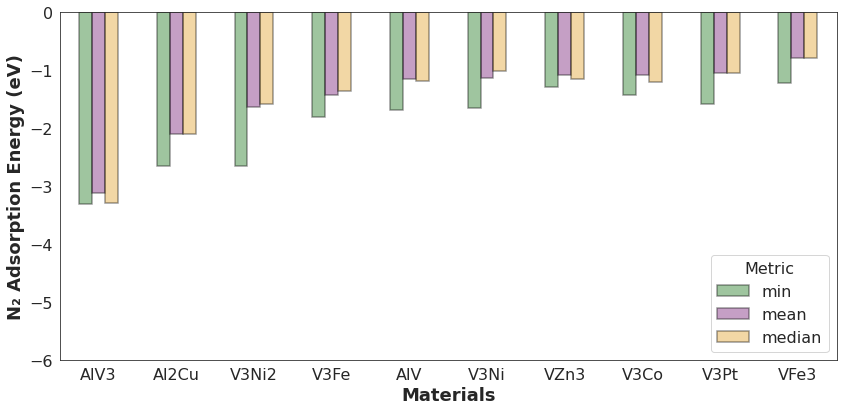

    material       min      mean    median
7    15_AlV3 -3.301158 -3.112225 -3.283974
10  18_Al2Cu -2.655914 -2.097096 -2.097096
8   16_V3Ni2 -2.645680 -1.630165 -1.580995
29   33_V3Fe -1.815506 -1.427918 -1.350649
38     6_AlV -1.692321 -1.145274 -1.189119
41    7_V3Ni -1.651110 -1.134401 -1.019707
33   35_VZn3 -1.293169 -1.086077 -1.142371
22   24_V3Co -1.432075 -1.085776 -1.196762
23   25_V3Pt -1.577938 -1.047174 -1.047174
42    8_VFe3 -1.213621 -0.784265 -0.779729


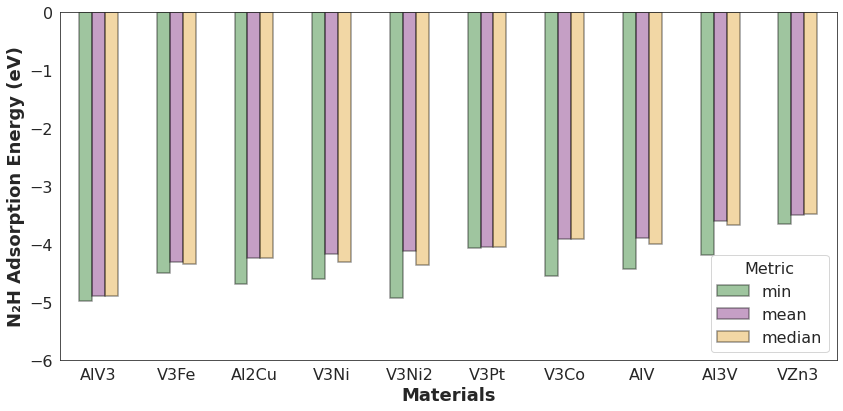

    material       min      mean    median
5    15_AlV3 -4.978393 -4.896403 -4.896403
30   33_V3Fe -4.505511 -4.309851 -4.339705
9   18_Al2Cu -4.691115 -4.248542 -4.248542
42    7_V3Ni -4.599905 -4.165470 -4.317400
7   16_V3Ni2 -4.940214 -4.129571 -4.363274
22   25_V3Pt -4.064138 -4.054294 -4.054294
21   24_V3Co -4.545415 -3.919012 -3.910749
39     6_AlV -4.432984 -3.893370 -4.003735
2    11_Al3V -4.183894 -3.599603 -3.680162
34   35_VZn3 -3.657057 -3.492439 -3.474759


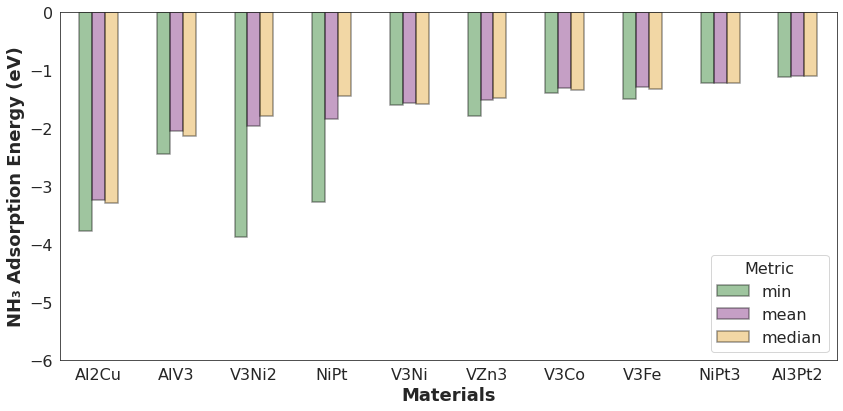

     material       min      mean    median
10   18_Al2Cu -3.781624 -3.244397 -3.288258
6     15_AlV3 -2.453665 -2.048891 -2.127219
8    16_V3Ni2 -3.881315 -1.954327 -1.795001
42     7_NiPt -3.275645 -1.847580 -1.444367
43     7_V3Ni -1.605001 -1.565842 -1.588743
35    35_VZn3 -1.781880 -1.518192 -1.478167
22    24_V3Co -1.396588 -1.300929 -1.334605
31    33_V3Fe -1.487739 -1.293235 -1.326785
21   24_NiPt3 -1.227110 -1.217334 -1.220785
26  28_Al3Pt2 -1.113851 -1.098505 -1.103611


In [35]:
plot_topN_by_mean(df_N2_f,  molecule_label="N₂",  save_basename="top_stats_N2",  top_n=10, row_filter=row_filter)
plot_topN_by_mean(df_N2H_f, molecule_label="N₂H", save_basename="top_stats_N2H", top_n=10, row_filter=row_filter)
plot_topN_by_mean(df_NH3_f, molecule_label="NH₃", save_basename="top_stats_NH3", top_n=10, row_filter=row_filter)

In [36]:
import pandas as pd
import numpy as np

# -------------------------
# CONFIG
# -------------------------
COL_MATERIAL = "material"
COL_ENERGY   = "ads_e"
COL_MOL_ADS  = "Mol_is_adsorbed"
COL_ATM_ADS  = "atomic_is_adsorbed"
COL_ORIENT   = "orientation"   # values now include "vertical","horizontal","tilted_vertical","tilted_horizontal"

# Update orientation levels
ORIENT_LEVELS = ["vertical", "tilted_vertical", "tilted_horizontal", "horizontal"]

# -------------------------
# Helper: summarize one dataframe per material
# -------------------------
def summarize_per_material(df, molecule_label, count_orient=False):
    d = df.copy()

    # Ensure required cols exist
    for col, default in [(COL_MOL_ADS, 0), (COL_ATM_ADS, 0)]:
        if col not in d.columns:
            d[col] = default

    groups = d.groupby(COL_MATERIAL, dropna=False)
    rows = []

    for material, g in groups:
        g_all   = g
        g_mol1  = g[g[COL_MOL_ADS] == 1]
        g_atm1  = g[g[COL_ATM_ADS] == 1]

        total_sites        = len(g_all)
        total_sites_mol1   = len(g_mol1)
        total_sites_atm1   = len(g_atm1)

        # Full dataset stats
        min_all = g_all[COL_ENERGY].min() if total_sites > 0 else np.nan
        max_all = g_all[COL_ENERGY].max() if total_sites > 0 else np.nan

        # Molecule_is_adsorbed==1
        min_mol1  = g_mol1[COL_ENERGY].min()    if total_sites_mol1 > 0 else np.nan
        med_mol1  = g_mol1[COL_ENERGY].median() if total_sites_mol1 > 0 else np.nan
        mean_mol1 = g_mol1[COL_ENERGY].mean()   if total_sites_mol1 > 0 else np.nan
        max_mol1  = g_mol1[COL_ENERGY].max()    if total_sites_mol1 > 0 else np.nan

        # atomic_is_adsorbed==1
        min_atm1  = g_atm1[COL_ENERGY].min()    if total_sites_atm1 > 0 else np.nan
        med_atm1  = g_atm1[COL_ENERGY].median() if total_sites_atm1 > 0 else np.nan
        mean_atm1 = g_atm1[COL_ENERGY].mean()   if total_sites_atm1 > 0 else np.nan
        max_atm1  = g_atm1[COL_ENERGY].max()    if total_sites_atm1 > 0 else np.nan

        row = {
            "molecule": molecule_label,
            "material": material,

            # All sites
            "min_all": min_all,
            "max_all": max_all,

            # Totals
            "total_sites": total_sites,
            "total_sites_molecule_is_adsorbed_1": total_sites_mol1,
            "total_sites_atomic_is_adsorbed_1": total_sites_atm1,

            # Molecule_is_adsorbed==1
            "min_molecule_is_adsorbed_1":    min_mol1,
            "median_molecule_is_adsorbed_1": med_mol1,
            "mean_molecule_is_adsorbed_1":   mean_mol1,
            "max_molecule_is_adsorbed_1":    max_mol1,

            # atomic_is_adsorbed==1
            "min_atomic_is_adsorbed_1":    min_atm1,
            "median_atomic_is_adsorbed_1": med_atm1,
            "mean_atomic_is_adsorbed_1":   mean_atm1,
            "max_atomic_is_adsorbed_1":    max_atm1,
        }

        # Orientation counts (N2/N2H only)
        if count_orient and (COL_ORIENT in g.columns):
            orient_series = g_mol1[COL_ORIENT].astype(str).str.lower()
            counts = orient_series.value_counts()
            for lab in ORIENT_LEVELS:
                row[f"count_{lab}_mol_is_adsorbed_1"] = int(counts.get(lab, 0))
        elif count_orient:
            for lab in ORIENT_LEVELS:
                row[f"count_{lab}_mol_is_adsorbed_1"] = 0

        rows.append(row)

    return pd.DataFrame(rows)


# -------------------------
# Build summaries per molecule
# -------------------------
sum_N2  = summarize_per_material(df_N2_f,  "N2",  count_orient=True)
sum_N2H = summarize_per_material(df_N2H_f, "N2H", count_orient=True)
sum_NH3 = summarize_per_material(df_NH3_f, "NH3", count_orient=False)
sum_H2  = summarize_per_material(df_H2_f,  "H2",  count_orient=False)

# Merge all
summary_all = pd.concat([sum_N2, sum_N2H, sum_NH3, sum_H2], ignore_index=True)

# Clean material labels
summary_all["material_clean"] = summary_all["material"].astype(str).str.replace(r'^\d+_', '', regex=True)


In [37]:
sum_N2.to_csv(working_dir + 'sumstats_N2.csv',index=False)
sum_N2H.to_csv(working_dir + 'sumstats_N2H.csv',index=False)
sum_NH3.to_csv(working_dir + 'sumstats_NH3.csv',index=False)
sum_H2.to_csv(working_dir + 'sumstats_H2.csv',index=False)


In [38]:
sum_N2=pd.read_csv(working_dir + 'sumstats_N2.csv',)
sum_N2H=pd.read_csv(working_dir + 'sumstats_N2H.csv',)
sum_NH3=pd.read_csv(working_dir + 'sumstats_NH3.csv',)
sum_H2=pd.read_csv(working_dir + 'sumstats_H2.csv',)

In [39]:
sum_N2

,molecule,material,min_all,max_all,total_sites,total_sites_molecule_is_adsorbed_1,total_sites_atomic_is_adsorbed_1,min_molecule_is_adsorbed_1,median_molecule_is_adsorbed_1,mean_molecule_is_adsorbed_1,max_molecule_is_adsorbed_1,min_atomic_is_adsorbed_1,median_atomic_is_adsorbed_1,mean_atomic_is_adsorbed_1,max_atomic_is_adsorbed_1,count_vertical_mol_is_adsorbed_1,count_tilted_vertical_mol_is_adsorbed_1,count_tilted_horizontal_mol_is_adsorbed_1,count_horizontal_mol_is_adsorbed_1
0,N2,0_Co3Ni,0.138791,0.405509,7,7,0,0.138791,0.210675,0.236989,0.405509,NaN,NaN,NaN,NaN,0,0,0,7
1,N2,10_Al3Ni2,-0.249384,0.287594,8,2,5,-0.249384,-0.226563,-0.226563,-0.203741,0.276684,0.283314,0.282786,0.287594,1,0,0,1
2,N2,10_Zn11Co2,0.011271,0.358846,10,2,0,0.049683,0.085418,0.085418,0.121152,NaN,NaN,NaN,NaN,0,0,0,2
3,N2,11_Al3V,-0.854152,-0.019944,7,3,2,-0.854152,-0.727457,-0.650190,-0.368963,-0.376444,-0.291411,-0.291411,-0.206378,0,0,2,1
4,N2,13_AlFe,-0.888140,0.424837,10,8,1,-0.888140,-0.385365,-0.361106,0.424837,-0.337401,-0.337401,-0.337401,-0.337401,3,0,0,5
5,N2,13_Zn3Cu,0.033846,2.417547,7,1,0,0.322138,0.322138,0.322138,0.322138,NaN,NaN,NaN,NaN,0,1,0,0
6,N2,14_Zn8Cu5,1.149113,3.912937,4,1,3,1.149113,1.149113,1.149113,1.149113,2.418634,3.158871,3.163481,3.912937,0,0,0,1
7,N2,15_AlV3,-3.360430,-1.837272,13,3,10,-3.301158,-3.283974,-3.112225,-2.751542,-3.360430,-2.721762,-2.637156,-1.837272,0,0,1,2
8,N2,15_ZnCu,0.061101,2.686515,5,0,1,NaN,NaN,NaN,NaN,2.686515,2.686515,2.686515,2.686515,0,0,0,0
9,N2,16_V3Ni2,-2.645680,-0.339106,19,15,3,-2.645680,-1.580995,-1.630165,-0.971048,-2.155112,-1.789480,-1.883269,-1.705214,2,2,3,8


findfont: Font family ['Times New Roman'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Times New Roman'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Times New Roman'] not found. Falling back to DejaVu Sans.


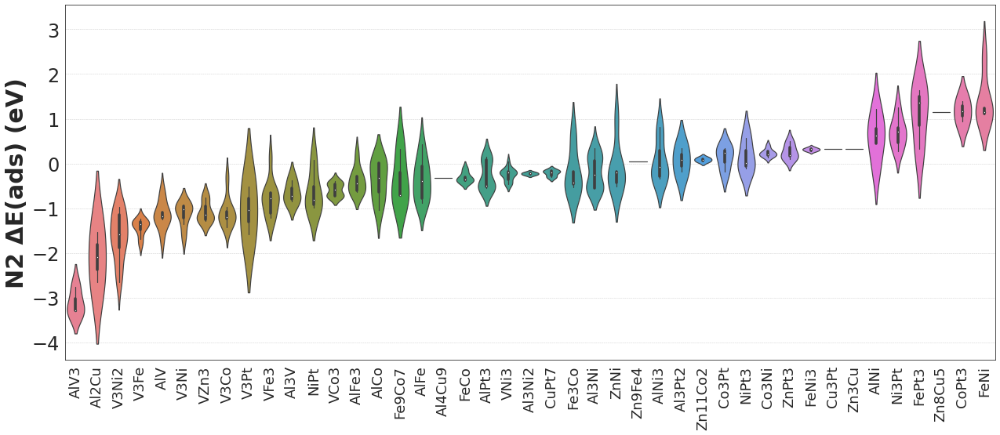

In [40]:
#Violin plots ads_e distribution
mol = 'N2'
df = df_N2_f[df_N2_f['Mol_is_adsorbed'] == 1].copy()

# Remove numeric prefixes from alloy names
df["material"] = df["material"].str.replace(r"^\d+_", "", regex=True)

# Now re-sort and plot as before
material_order = df.groupby("material")["ads_e"].mean().sort_values().index.tolist()

plt.figure(figsize=(18, 8))
ax = sns.violinplot(
    data=df,
    x="material",
    y="ads_e",
    order=material_order,
    inner="box",
    scale="width",
    linewidth=1.2,
    palette="husl"
)

plt.xticks(rotation=90, fontsize=18)
plt.yticks(fontsize=24)
plt.xlabel('')
plt.ylabel(f"{mol} ΔE(ads) (eV)", fontsize=30, weight="bold")
#plt.title("Distribution of N₂ Adsorption Energies Across Alloys", fontsize=18, weight="bold")

ax.grid(axis="y", linestyle="--", linewidth=0.5)
plt.tight_layout()
#plt.savefig(f"violin_plots_MoladsE_{mol}.pdf", dpi=600, bbox_inches="tight")
plt.show()


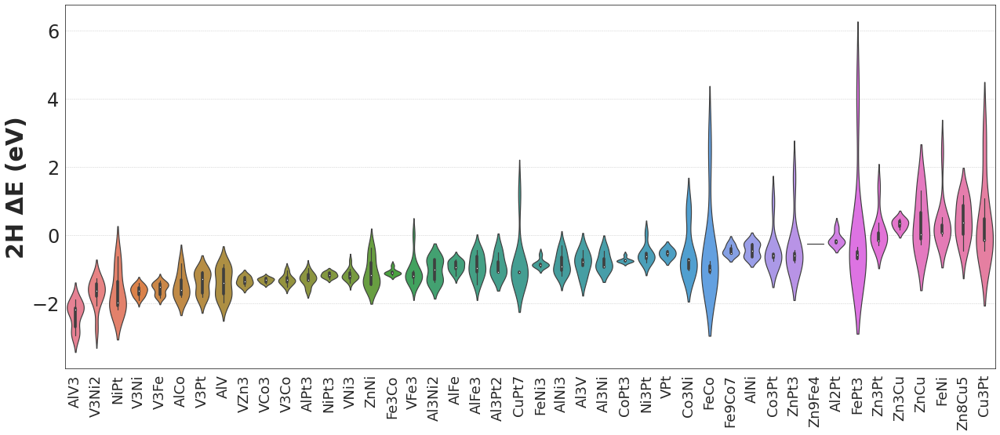

In [41]:
mol = 'H2'
df = df_H2_f[df_H2_f['atomic_is_adsorbed'] == 1].copy()

# Remove numeric prefixes from alloy names
df["material"] = df["material"].str.replace(r"^\d+_", "", regex=True)

# Now re-sort and plot as before
material_order = df.groupby("material")["ads_e"].mean().sort_values().index.tolist()

plt.figure(figsize=(18, 8))
ax = sns.violinplot(
    data=df,
    x="material",
    y="ads_e",
    order=material_order,
    inner="box",
    scale="width",
    linewidth=1.2,
    palette="husl"
)

plt.xticks(rotation=90, fontsize=18)
plt.yticks(fontsize=24)
plt.xlabel('')
plt.ylabel(f"2H ΔE (eV)", fontsize=30, weight="bold")
#plt.title("Distribution of N₂ Adsorption Energies Across Alloys", fontsize=18, weight="bold")

ax.grid(axis="y", linestyle="--", linewidth=0.5)
plt.tight_layout()
#plt.savefig(f"violin_plots_AtomadsE_{mol}.pdf", dpi=600, bbox_inches="tight")
plt.show()


findfont: Font family ['Times New Roman'] not found. Falling back to DejaVu Sans.


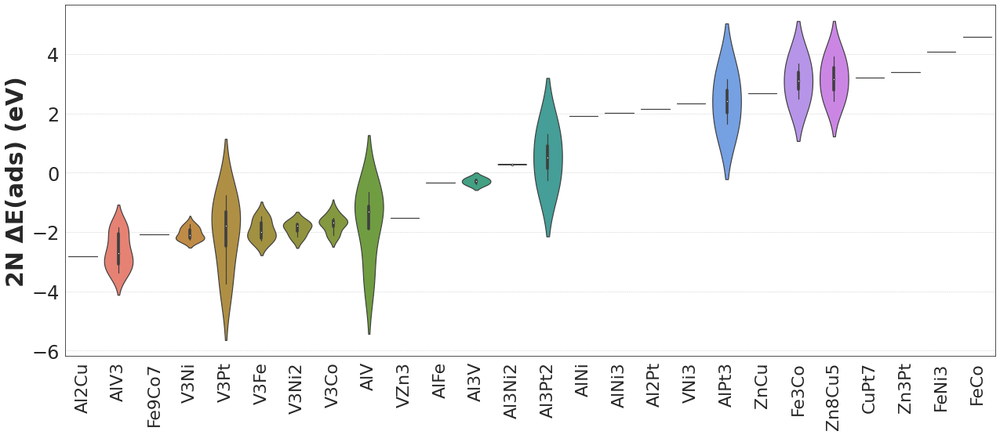

In [42]:
mol = 'N2'
df = df_N2_f[df_N2_f['atomic_is_adsorbed'] == 1].copy()

# Remove numeric prefixes from alloy names
df["material"] = df["material"].str.replace(r"^\d+_", "", regex=True)

# Now re-sort and plot as before
material_order = df.groupby("material")["ads_e"].mean().sort_values().index.tolist()

plt.figure(figsize=(18, 8))
ax = sns.violinplot(
    data=df,
    x="material",
    y="ads_e",
    order=material_order,
    inner="box",
    scale="width",
    linewidth=1.2,
    palette="husl"
)

plt.xticks(rotation=90, fontsize=22)
plt.yticks(fontsize=24)
plt.xlabel('')
plt.ylabel(f"2N ΔE(ads) (eV)", fontsize=30, weight="bold")
#plt.title("Distribution of N₂ Adsorption Energies Across Alloys", fontsize=18, weight="bold")

ax.grid(axis="y", linestyle="--", linewidth=0.5)
plt.tight_layout()
#plt.savefig(f"violin_plots_AtomadsE_{mol}.pdf", dpi=600, bbox_inches="tight")
plt.show()


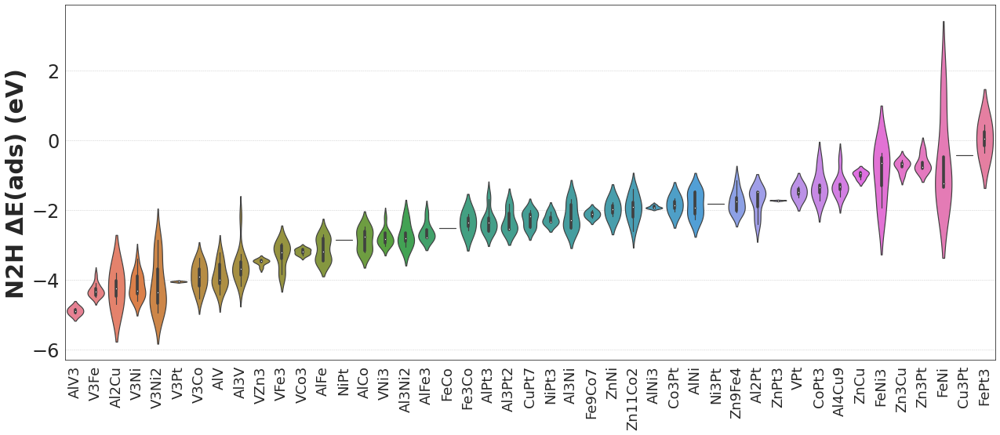

In [43]:
#Violin plots ads_e distribution
mol = 'N2H'
df = df_N2H_f[df_N2H_f['Mol_is_adsorbed'] == 1].copy()

# Remove numeric prefixes from alloy names
df["material"] = df["material"].str.replace(r"^\d+_", "", regex=True)

# Now re-sort and plot as before
material_order = df.groupby("material")["ads_e"].mean().sort_values().index.tolist()

plt.figure(figsize=(18, 8))
ax = sns.violinplot(
    data=df,
    x="material",
    y="ads_e",
    order=material_order,
    inner="box",
    scale="width",
    linewidth=1.2,
    palette="husl"
)

plt.xticks(rotation=90, fontsize=18)
plt.yticks(fontsize=24)
plt.xlabel('')
plt.ylabel(f"{mol} ΔE(ads) (eV)", fontsize=30, weight="bold")
#plt.title("Distribution of N₂ Adsorption Energies Across Alloys", fontsize=18, weight="bold")

ax.grid(axis="y", linestyle="--", linewidth=0.5)
plt.tight_layout()
#plt.savefig(f"violin_plots_MoladsE_{mol}.pdf", dpi=600, bbox_inches="tight")
plt.show()


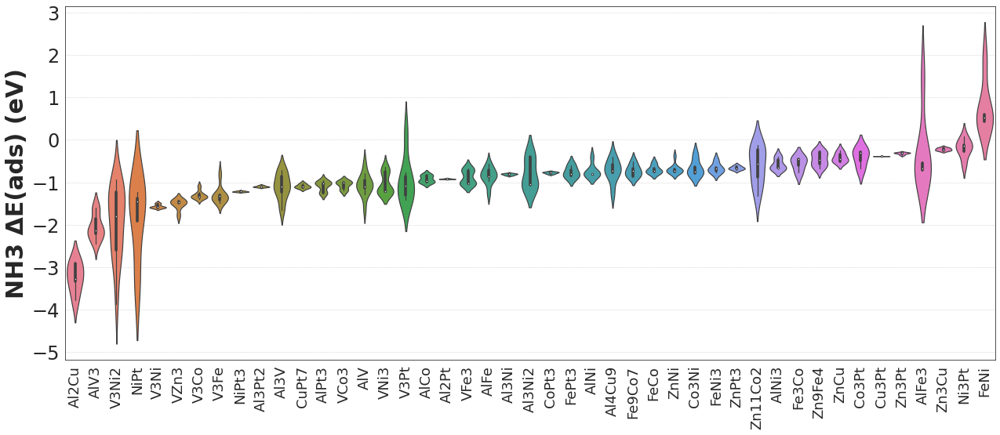

In [44]:
#Violin plots ads_e distribution
mol = 'NH3'
df = df_NH3_f[df_NH3_f['Mol_is_adsorbed'] == 1].copy()

# Remove numeric prefixes from alloy names
df["material"] = df["material"].str.replace(r"^\d+_", "", regex=True)

# Now re-sort and plot as before
material_order = df.groupby("material")["ads_e"].mean().sort_values().index.tolist()

plt.figure(figsize=(18, 8))
ax = sns.violinplot(
    data=df,
    x="material",
    y="ads_e",
    order=material_order,
    inner="box",
    scale="width",
    linewidth=1.2,
    palette="husl"
)

plt.xticks(rotation=90, fontsize=18)
plt.yticks(fontsize=24)
plt.xlabel('')
plt.ylabel(f"{mol} ΔE(ads) (eV)", fontsize=30, weight="bold")
#plt.title("Distribution of N₂ Adsorption Energies Across Alloys", fontsize=18, weight="bold")

ax.grid(axis="y", linestyle="--", linewidth=0.5)
plt.tight_layout()
#plt.savefig(working_dir + f"violin_plots_MoladsE_{mol}.pdf", dpi=600, bbox_inches="tight")
plt.show()


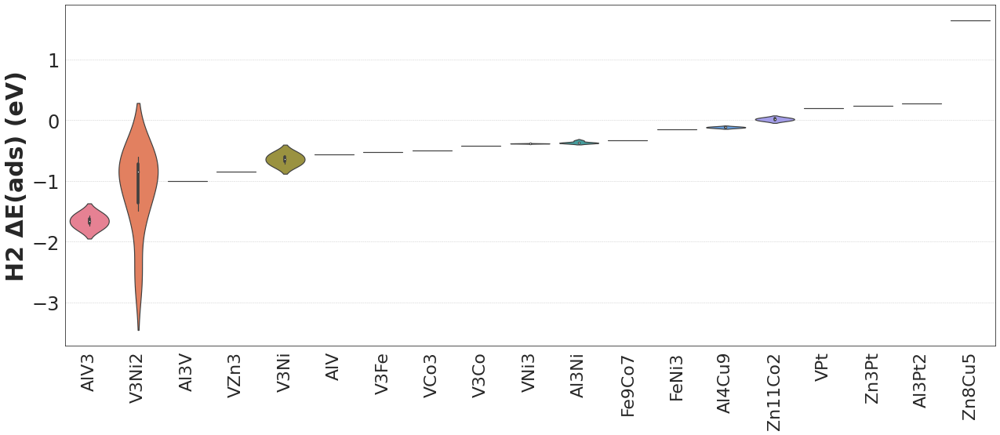

In [45]:
mol = 'H2'
df = df_H2_f[df_H2_f['Mol_is_adsorbed'] == 1].copy()

# Remove numeric prefixes from alloy names
df["material"] = df["material"].str.replace(r"^\d+_", "", regex=True)

# Now re-sort and plot as before
material_order = df.groupby("material")["ads_e"].mean().sort_values().index.tolist()

plt.figure(figsize=(18, 8))
ax = sns.violinplot(
    data=df,
    x="material",
    y="ads_e",
    order=material_order,
    inner="box",
    scale="width",
    linewidth=1.2,
    palette="husl"
)

plt.xticks(rotation=90, fontsize=22)
plt.yticks(fontsize=24)
plt.xlabel('')
plt.ylabel(f"{mol} ΔE(ads) (eV)", fontsize=30, weight="bold")
#plt.title("Distribution of N₂ Adsorption Energies Across Alloys", fontsize=18, weight="bold")

ax.grid(axis="y", linestyle="--", linewidth=0.5)
plt.tight_layout()
#plt.savefig(f"violin_plots_MoladsE_{mol}.pdf", dpi=600, bbox_inches="tight")
plt.show()


findfont: Font family ['Times New Roman'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Times New Roman'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Times New Roman'] not found. Falling back to DejaVu Sans.


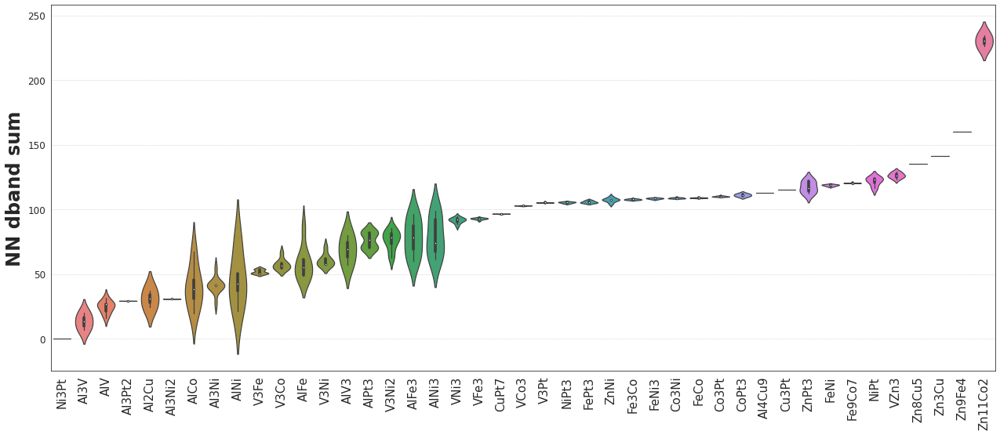

In [46]:
#Violin plots ads_e distribution
mol = 'N2'
df = df_N2_f
n_neighbor = 9
dos_sum_center = 'sum'
selection_type = 'selected'
orbital = 'd'

parameter = f"n0_n{n_neighbor-1}_dos_{selection_type}_{orbital}band_{dos_sum_center}"


df = df[df['Mol_is_adsorbed'] == 1].copy()

# Remove numeric prefixes from alloy names
df["material"] = df["material"].str.replace(r"^\d+_", "", regex=True)

# Now re-sort and plot as before
material_order = df.groupby("material")[parameter].mean().sort_values().index.tolist()

plt.figure(figsize=(18, 8))
ax = sns.violinplot(
    data=df,
    x="material",
    y=parameter,
    order=material_order,
    inner="box",
    scale="width",
    linewidth=1.2,
    palette="husl"
)

plt.xticks(rotation=90, fontsize=15)
plt.yticks(fontsize=12)
plt.xlabel('')
plt.ylabel(f"NN {orbital}band {dos_sum_center}", fontsize=24, weight="bold")
#plt.title("Distribution of N₂ Adsorption Energies Across Alloys", fontsize=18, weight="bold")

ax.grid(axis="y", linestyle="--", linewidth=0.5)
plt.tight_layout()
#plt.savefig(working_dir + f"violin_plots_n0n{n_neighbor}_{orbital}band_{dos_sum_center}.pdf", dpi=600, bbox_inches="tight")
plt.show()


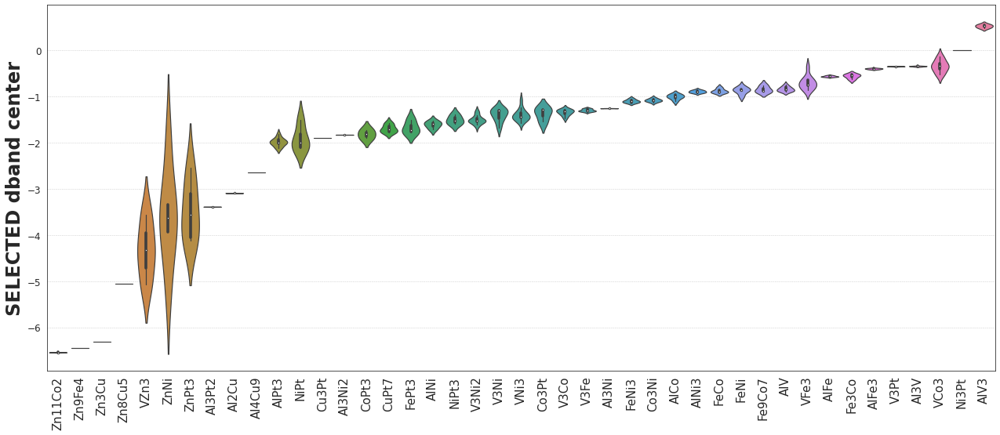

In [47]:
#Violin plots ads_e distribution
mol = 'N2'
df = df_N2_f
n_neighbor = 9
dos_sum_center = 'center'
selection_type = 'selected'
orbital = 'd'

parameter = f"n0_n{n_neighbor-1}_dos_{selection_type}_{orbital}band_{dos_sum_center}"


df = df[df['Mol_is_adsorbed'] == 1].copy()

# Remove numeric prefixes from alloy names
df["material"] = df["material"].str.replace(r"^\d+_", "", regex=True)

# Now re-sort and plot as before
material_order = df.groupby("material")[parameter].mean().sort_values().index.tolist()

plt.figure(figsize=(18, 8))
ax = sns.violinplot(
    data=df,
    x="material",
    y=parameter,
    order=material_order,
    inner="box",
    scale="width",
    linewidth=1.2,
    palette="husl"
)

plt.xticks(rotation=90, fontsize=15)
plt.yticks(fontsize=12)
plt.xlabel('')
plt.ylabel(f"{selection_type.upper()} {orbital}band {dos_sum_center}", fontsize=24, weight="bold")
#plt.title("Distribution of N₂ Adsorption Energies Across Alloys", fontsize=18, weight="bold")

ax.grid(axis="y", linestyle="--", linewidth=0.5)
plt.tight_layout()
#plt.savefig(working_dir + f"violin_plots_n0n{n_neighbor}_{orbital}band_{dos_sum_center}.pdf", dpi=600, bbox_inches="tight")
plt.show()


In [48]:
import re
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_absolute_error

# ---------- helpers ----------
def _strip_prefix(s: str) -> str:
    """Remove leading numeric prefix like '23_Al2Cu' -> 'Al2Cu'."""
    return re.sub(r"^\d+_", "", str(s))

def _collect_neighbor_values(row, param="charge", max_i=20, sort_by_distance=True):
    """
    Collect neighbor values from columns n{i}_{param}, i=0..max_i.
    If sort_by_distance, order by increasing n{i}_distance.
    Returns np.array of values (possibly empty).
    """
    vals, dists = [], []
    for i in range(max_i + 1):
        vcol = f"n{i}_{param}"
        if vcol in row and pd.notnull(row[vcol]):
            vals.append(float(row[vcol]))
            if sort_by_distance:
                dcol = f"n{i}_distance"
                dists.append(float(row[dcol]) if (dcol in row and pd.notnull(row[dcol])) else np.inf)
    if not vals:
        return np.array([])
    vals = np.asarray(vals, float)
    if sort_by_distance:
        order = np.argsort(np.asarray(dists, float))
        vals = vals[order]
    return vals

def _asymmetry_from_row(row, top_k=3, mode="spread", param="charge", max_i=20):
    """
    Asymmetry index from neighbor param values (e.g., 'charge', 'electroneg').
    mode: 'spread' (max-min), 'std', 'mad', 'iqr', 'gini'
    """
    x = _collect_neighbor_values(row, param=param, max_i=max_i, sort_by_distance=True)
    if x.size == 0:
        return np.nan
    x = x[:min(top_k, x.size)]
    if mode == "std":
        return float(np.std(x))
    if mode == "mad":
        mu = float(np.mean(x)); return float(np.mean(np.abs(x - mu)))
    if mode == "iqr":
        q75, q25 = np.percentile(x, [75, 25]); return float(q75 - q25)
    if mode == "gini":
        # Shift to nonnegative, then compute Gini coefficient
        xx = x - np.min(x) + 1e-12
        xx = np.sort(xx)
        n = xx.size
        i = np.arange(1, n+1)
        return float((2*np.sum(i*xx))/(n*np.sum(xx)) - (n+1)/n)
    # default: spread
    return float(np.max(x) - np.min(x))

from sklearn.metrics import r2_score, mean_absolute_error

def _linear_fit_and_residuals(x, y):
    X = np.asarray(x).reshape(-1, 1); y = np.asarray(y)
    reg = LinearRegression().fit(X, y)
    yhat = reg.predict(X)
    return reg.coef_[0], reg.intercept_, yhat



In [49]:
def plot_scaling_one(
    df_x, df_y,
    x_name="N2", y_name="N2H",
    energy_col="ads_e",
    material_col="material", site_col="ad_site_number",

    # per-side filtering & name cleaning
    filter_adsorbed_x=True, ads_flag_col_x="Mol_is_adsorbed", ads_value_x=1, clean_names_x=True,
    filter_adsorbed_y=True, ads_flag_col_y="Mol_is_adsorbed", ads_value_y=1, clean_names_y=True,
    filter_fn_x=None, filter_fn_y=None,   # optional callables f(df)->df

    # asymmetry settings (Y-side ONLY, for coloring)
    asym_param="charge", asym_mode="spread", use_top_k_nn=3, neighbor_max_i=20,

    # plot
    figsize=(10, 8), palette="Spectral",
    dpi=600, save_path=None,
    title_prefix=None
):
    """
    Scaling: ΔE(y) vs ΔE(x), color by asymmetry index computed on Y only.
    Supports different filters/flags for df_x and df_y.
    """

    # ----- copies & per-side filters -----
    gX, gY = df_x.copy(), df_y.copy()

    if filter_adsorbed_x and ads_flag_col_x in gX.columns:
        gX = gX[gX[ads_flag_col_x] == ads_value_x]
    if filter_adsorbed_y and ads_flag_col_y in gY.columns:
        gY = gY[gY[ads_flag_col_y] == ads_value_y]

    if callable(filter_fn_x): gX = filter_fn_x(gX)
    if callable(filter_fn_y): gY = filter_fn_y(gY)

    if clean_names_x and material_col in gX.columns:
        gX[material_col] = gX[material_col].astype(str).apply(_strip_prefix)
    if clean_names_y and material_col in gY.columns:
        gY[material_col] = gY[material_col].astype(str).apply(_strip_prefix)

    # ----- asymmetry index on Y (for coloring) -----
    gY = gY.copy()
    gY["asym_idx"] = gY.apply(
        lambda r: _asymmetry_from_row(
            r, top_k=use_top_k_nn, mode=asym_mode,
            param=asym_param, max_i=neighbor_max_i
        ),
        axis=1
    )

    # ----- merge aligned sites -----
    keys = [material_col, site_col]
    scaling_df = pd.merge(
        gY[keys + [energy_col, "asym_idx"]],
        gX[keys + [energy_col]],
        on=keys, how="inner",
        suffixes=(f"_{y_name}", f"_{x_name}")
    ).dropna(subset=[f"{energy_col}_{y_name}", f"{energy_col}_{x_name}", "asym_idx"])

    if scaling_df.empty:
        raise ValueError("No overlapping rows after merge with current filters.")

    # ----- fit & metrics -----
    x = scaling_df[f"{energy_col}_{x_name}"].values
    y = scaling_df[f"{energy_col}_{y_name}"].values
    slope, intercept, yhat = _linear_fit_and_residuals(x, y)
    r2, mae = r2_score(y, yhat), mean_absolute_error(y, yhat)

    # ----- plot -----
    sns.set(style="whitegrid", context="talk", font_scale=1.2)
    plt.figure(figsize=figsize)

    sc = plt.scatter(
        scaling_df[f"{energy_col}_{x_name}"],
        scaling_df[f"{energy_col}_{y_name}"],
        c=scaling_df["asym_idx"], cmap=palette,
        s=100, edgecolor="black", linewidth=0.6, alpha=0.9
    )

    xs = np.linspace(np.nanmin(x), np.nanmax(x), 200)
    line, = plt.plot(xs, slope*xs + intercept, color="crimson", lw=3)

    plt.xlabel(f"{x_name} ΔE(ads) (eV)", fontsize=25, fontweight="bold")
    plt.ylabel(f"{y_name} ΔE(ads) (eV)", fontsize=25, fontweight="bold")

    # concise per-side flags in the title
    x_flags = []
    if filter_adsorbed_x: x_flags.append(f"{ads_flag_col_x}={ads_value_x}")
    if clean_names_x:     x_flags.append("clean_names")
    y_flags = []
    if filter_adsorbed_y: y_flags.append(f"{ads_flag_col_y}={ads_value_y}")
    if clean_names_y:     y_flags.append("clean_names")

    if title_prefix is None:
        title_prefix = f"Scaling: ΔE({y_name}) vs ΔE({x_name})"

    plt.title(
        f"{title_prefix}\n"
        f"X[{', '.join(x_flags) if x_flags else 'no filters'}] | "
        f"Y[{', '.join(y_flags) if y_flags else 'no filters'}]\n"
        f"(asym on Y: mode={asym_mode}, param='{asym_param}', topK={use_top_k_nn})",
        fontsize=18, fontweight="bold", pad=25
    )

    cbar = plt.colorbar(sc, pad=0.01)
    cbar.set_label("Asymmetry index", fontsize=14, fontweight="bold")

    plt.legend(
        [line],
        [f"fit: y = {slope:.2f}x + {intercept:.2f}\nR²={r2:.3f}, MAE={mae:.3f}"],
        loc="best", frameon=True
    )

    plt.grid(ls="--", alpha=0.35)
    plt.tight_layout()
    if save_path:
        pass
        #plt.savefig(save_path, dpi=dpi, bbox_inches="tight")
    plt.show()

    return {"scaling_df": scaling_df, "slope": slope, "intercept": intercept, "r2": r2, "mae": mae}


/home/parastoo/anaconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:105: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.


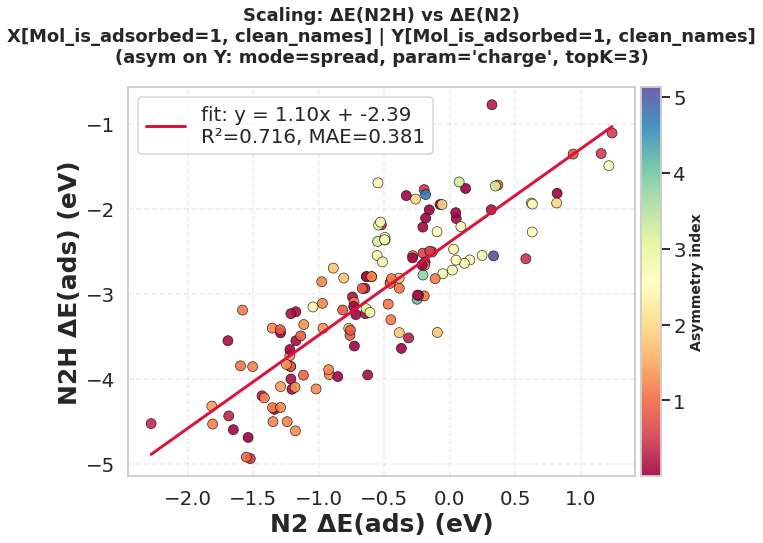

/home/parastoo/anaconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:105: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.


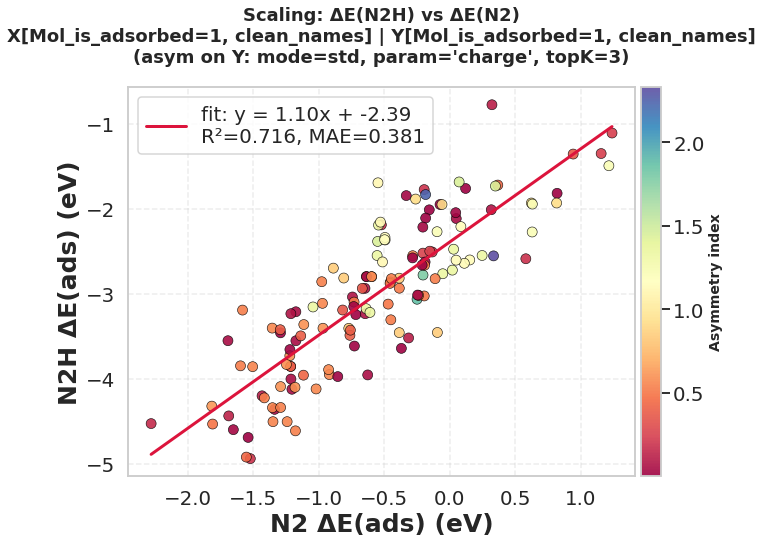

/home/parastoo/anaconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:105: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.


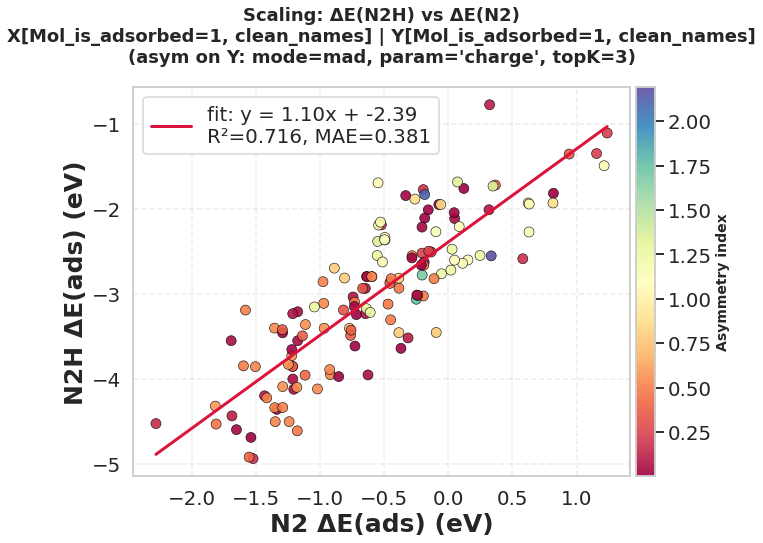

/home/parastoo/anaconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:105: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.


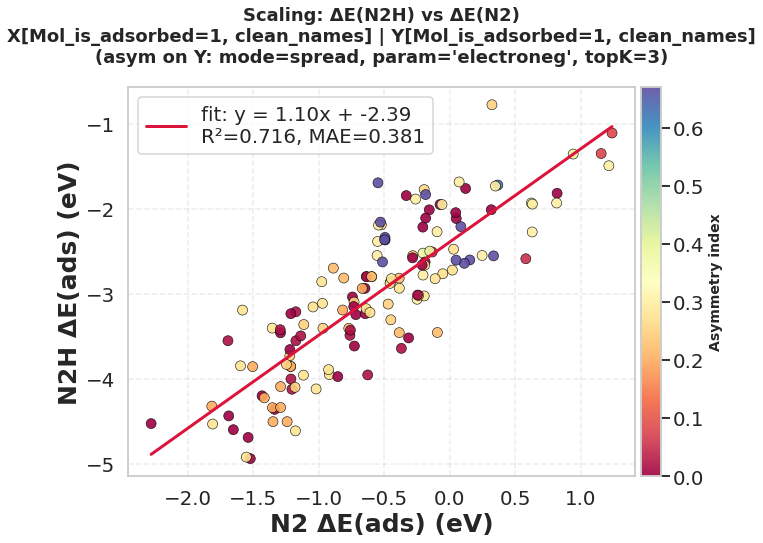

/home/parastoo/anaconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:105: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.


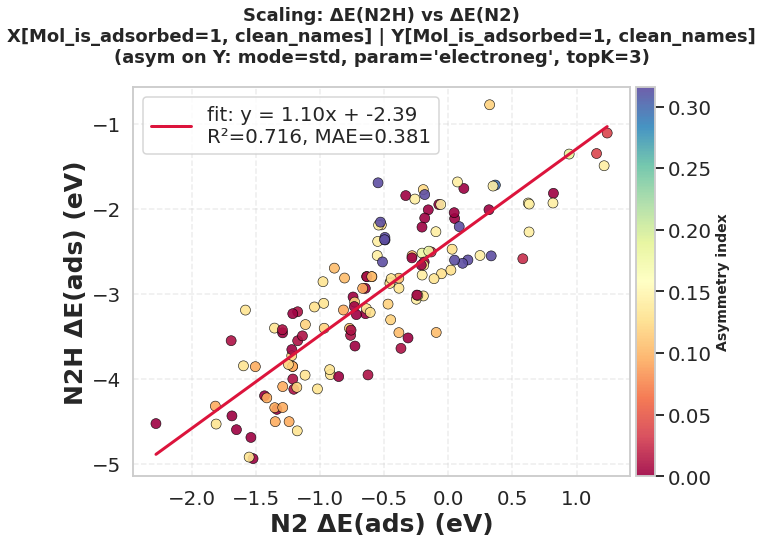

/home/parastoo/anaconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:105: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.


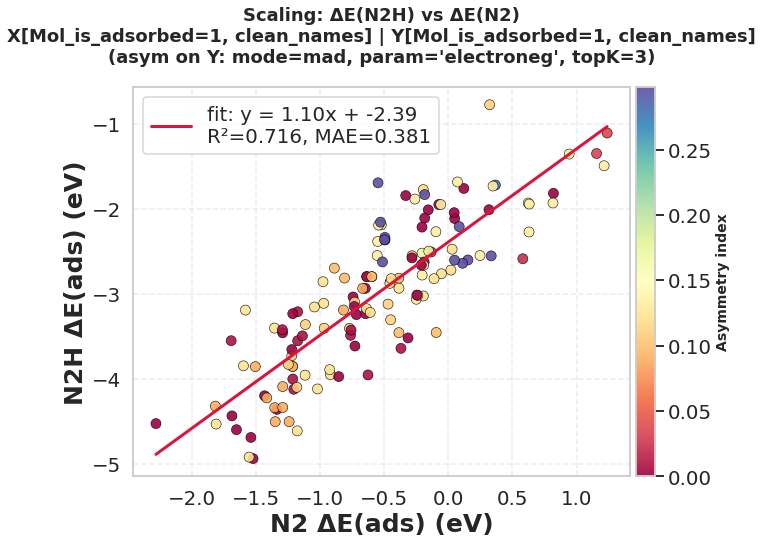

In [50]:
# 1) Your original case: y = N2H, x = N2 ; asymmetry from neighbor CHARGE (spread), top-6 nearest
df_1, mol1_name = df_N2_f, 'N2'
df_2, mol2_name = df_N2H_f,'N2H'
save_ = f'{mol1_name}_{mol1_name}_asymInd_'
out = plot_scaling_one(
    df_x=df_1, df_y=df_2,
    x_name=mol1_name, y_name=mol2_name,
    asym_param="charge", asym_mode="spread", use_top_k_nn=3,
    save_path =working_dir + f'{mol1_name}_{mol2_name}_asymmod_spread_charge.pdf'
)

# 2) Try a different asymmetry definition (STD) on CHARGE
out = plot_scaling_one(
    df_x=df_1, df_y=df_2,
    x_name=mol1_name, y_name=mol2_name,
    asym_param="charge", asym_mode="std", use_top_k_nn=3,
)

# 3) Use ELECTRONEGATIVITY instead of charge (if you have n{i}_electroneg columns)
out = plot_scaling_one(
    df_x=df_1, df_y=df_2,
    x_name=mol1_name, y_name=mol2_name,
    asym_param="charge", asym_mode="mad", use_top_k_nn=3,
)


#---------------------------------------#electroneg N2 N2H
# 1) Your original case: y = N2H, x = N2 ; asymmetry from neighbor CHARGE (spread), top-6 nearest

out = plot_scaling_one(
    df_x=df_1, df_y=df_2,
    x_name=mol1_name, y_name=mol2_name,
    asym_param="electroneg", asym_mode="spread", use_top_k_nn=3,
    save_path =working_dir + f'{mol1_name}_{mol2_name}_asymmod_spread_electroneg.pdf',
)

# 2) Try a different asymmetry definition (STD) on CHARGE
out = plot_scaling_one(
    df_x=df_1, df_y=df_2,
    x_name=mol1_name, y_name=mol2_name,
    asym_param="electroneg", asym_mode="std", use_top_k_nn=3,
)

# 3) Use ELECTRONEGATIVITY instead of charge (if you have n{i}_electroneg columns)
out = plot_scaling_one(
    df_x=df_1, df_y=df_2,
    x_name=mol1_name, y_name=mol2_name,
    asym_param="electroneg", asym_mode="mad", use_top_k_nn=3,
)








/home/parastoo/anaconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:105: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.


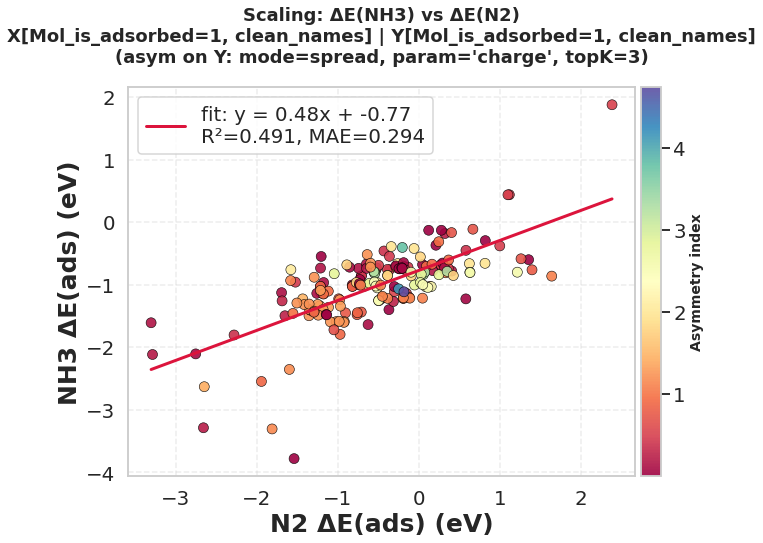

/home/parastoo/anaconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:105: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.


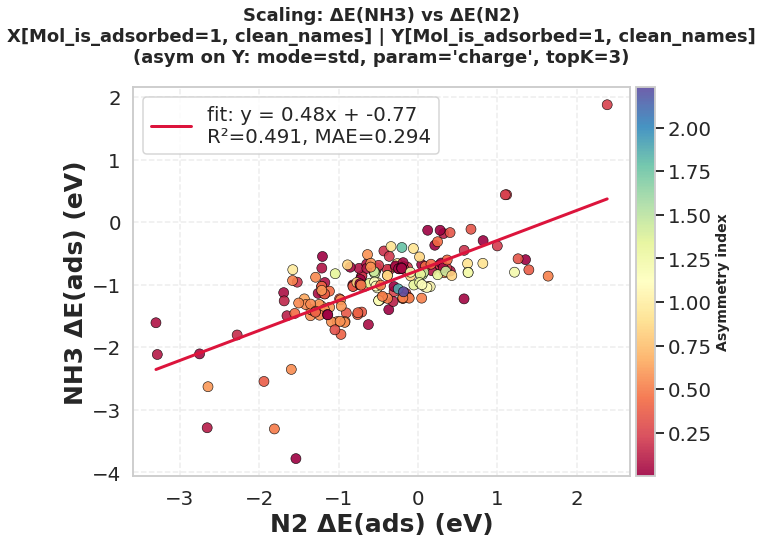

/home/parastoo/anaconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:105: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.


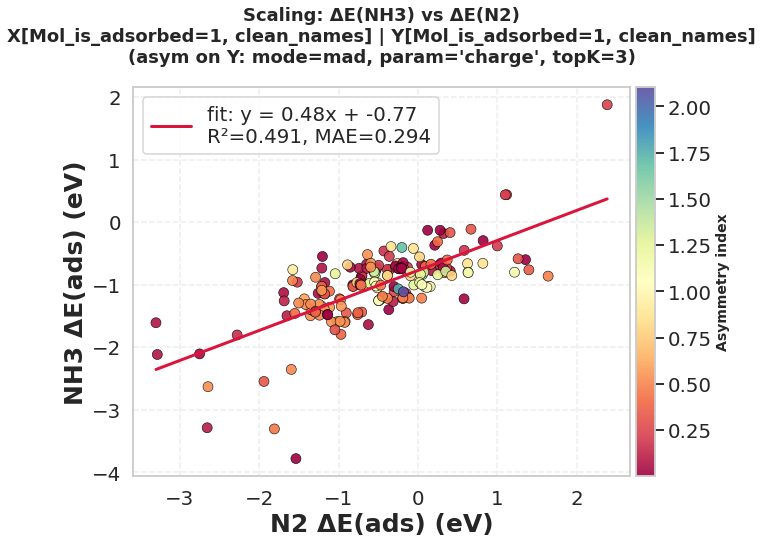

/home/parastoo/anaconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:105: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.


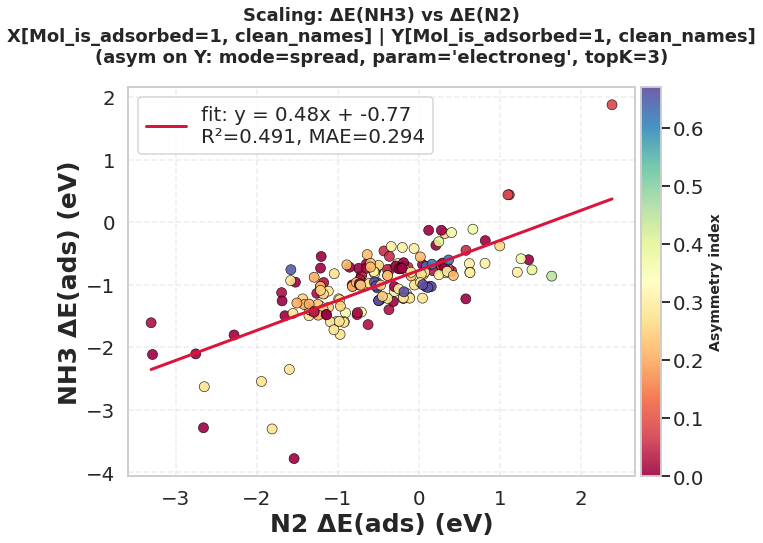

/home/parastoo/anaconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:105: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.


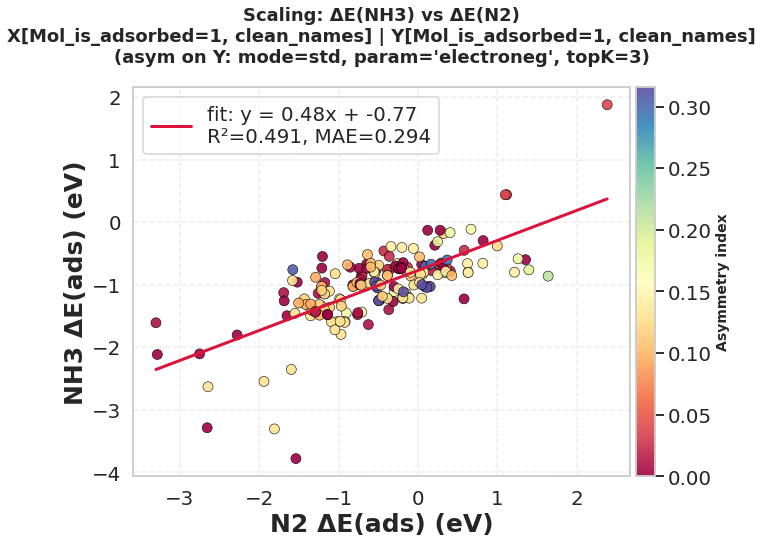

/home/parastoo/anaconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:105: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.


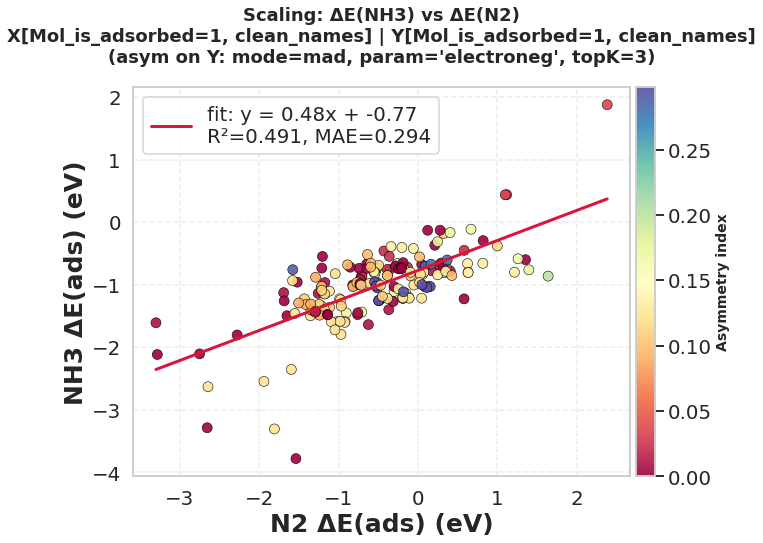

In [51]:
# 1) Your original case: y = N2H, x = N2 ; asymmetry from neighbor CHARGE (spread), top-6 nearest
df_1, mol1_name = df_N2_f, 'N2'
df_2, mol2_name = df_NH3_f,'NH3'
out = plot_scaling_one(
    df_x=df_1, df_y=df_2,
    x_name=mol1_name, y_name=mol2_name,
    asym_param="charge", asym_mode="spread", use_top_k_nn=3,
    save_path =working_dir + f'{mol1_name}_{mol2_name}_asymmod_spread_charge.pdf',
)

# 2) Try a different asymmetry definition (STD) on CHARGE
out = plot_scaling_one(
    df_x=df_1, df_y=df_2,
    x_name=mol1_name, y_name=mol2_name,
    asym_param="charge", asym_mode="std", use_top_k_nn=3,
)

# 3) Use ELECTRONEGATIVITY instead of charge (if you have n{i}_electroneg columns)
out = plot_scaling_one(
    df_x=df_1, df_y=df_2,
    x_name=mol1_name, y_name=mol2_name,
    asym_param="charge", asym_mode="mad", use_top_k_nn=3,
)


#---------------------------------------#electroneg N2 N2H
# 1) Your original case: y = N2H, x = N2 ; asymmetry from neighbor CHARGE (spread), top-6 nearest

out = plot_scaling_one(
    df_x=df_1, df_y=df_2,
    x_name=mol1_name, y_name=mol2_name,
    asym_param="electroneg", asym_mode="spread", use_top_k_nn=3,
    save_path =working_dir + f'{mol1_name}_{mol2_name}_asymmod_spread_electroneg.pdf',
)

# 2) Try a different asymmetry definition (STD) on CHARGE
out = plot_scaling_one(
    df_x=df_1, df_y=df_2,
    x_name=mol1_name, y_name=mol2_name,
    asym_param="electroneg", asym_mode="std", use_top_k_nn=3
)

# 3) Use ELECTRONEGATIVITY instead of charge (if you have n{i}_electroneg columns)
out = plot_scaling_one(
    df_x=df_1, df_y=df_2,
    x_name=mol1_name, y_name=mol2_name,
    asym_param="electroneg", asym_mode="mad", use_top_k_nn=3
)








/home/parastoo/anaconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:105: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.


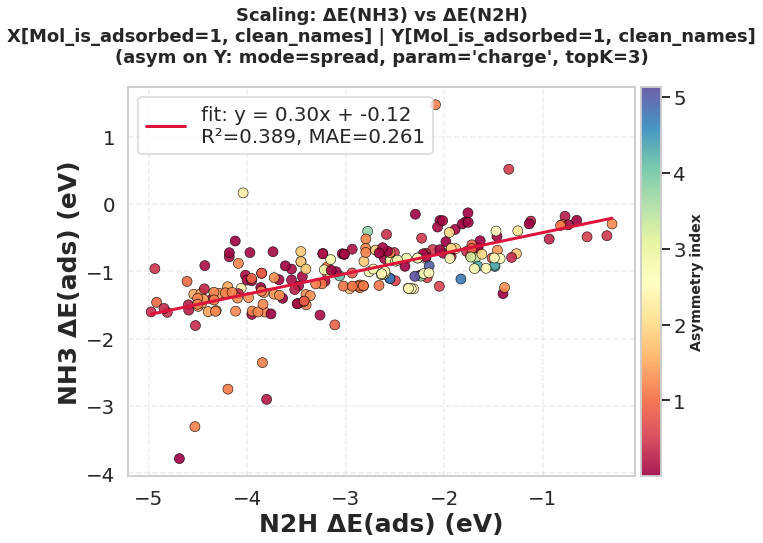

/home/parastoo/anaconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:105: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.


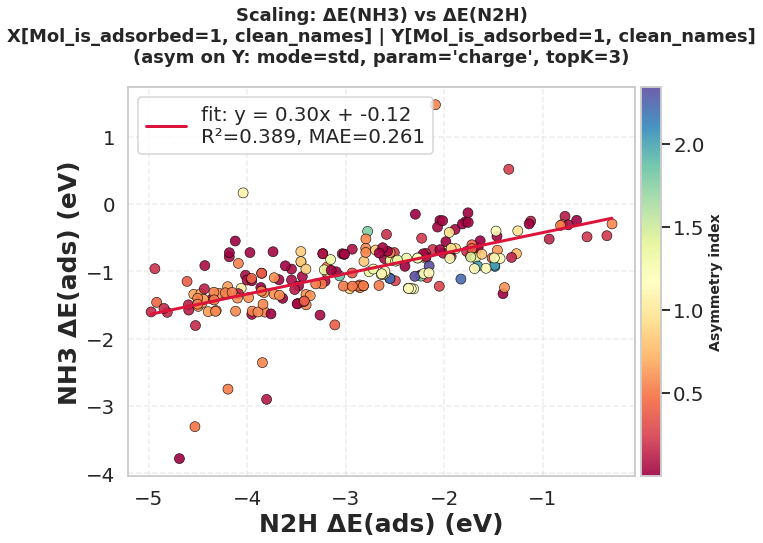

/home/parastoo/anaconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:105: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.


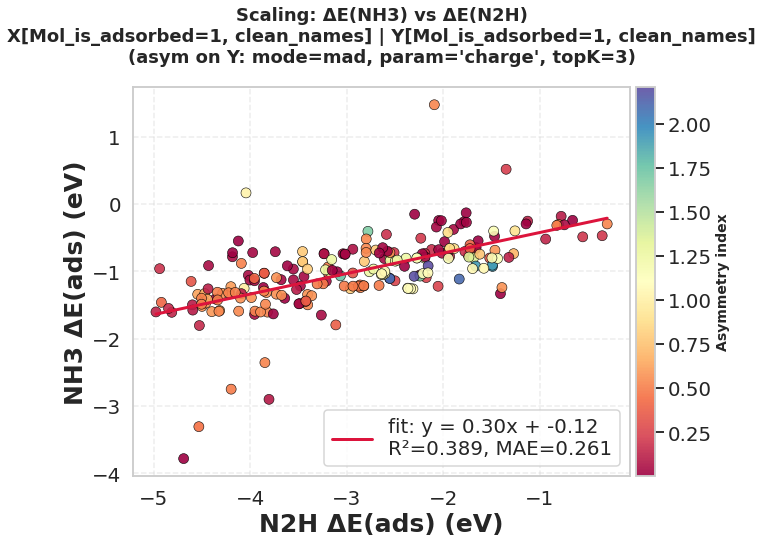

/home/parastoo/anaconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:105: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.


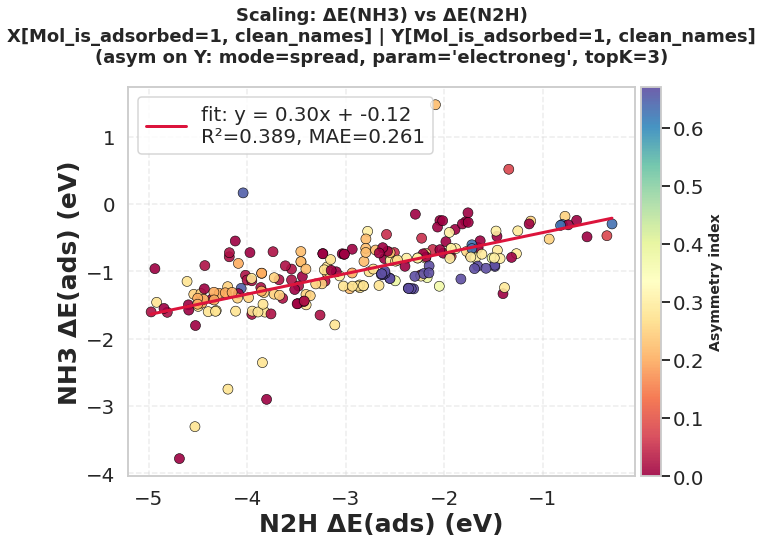

/home/parastoo/anaconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:105: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.


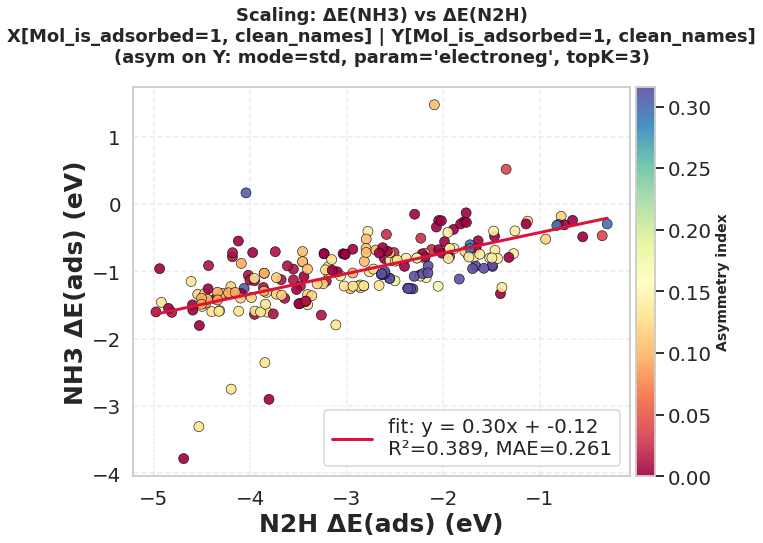

/home/parastoo/anaconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:105: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.


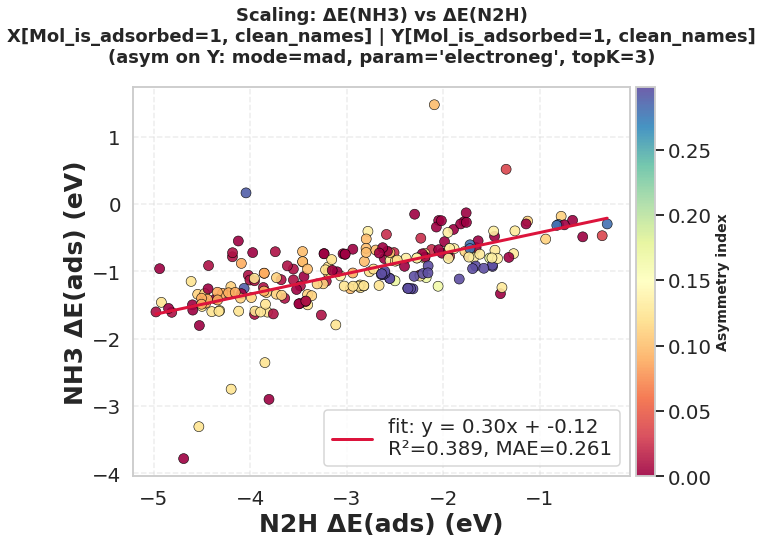

In [52]:
# 1) Your original case: y = N2H, x = N2 ; asymmetry from neighbor CHARGE (spread), top-6 nearest
df_1, mol1_name = df_N2H_f, 'N2H'
df_2, mol2_name = df_NH3_f,'NH3'
out = plot_scaling_one(
    df_x=df_1, df_y=df_2,
    x_name=mol1_name, y_name=mol2_name,
    asym_param="charge", asym_mode="spread", use_top_k_nn=3,
    save_path =working_dir + f'{mol1_name}_{mol2_name}_asymmod_spread_charge.pdf',
)

# 2) Try a different asymmetry definition (STD) on CHARGE
out = plot_scaling_one(
    df_x=df_1, df_y=df_2,
    x_name=mol1_name, y_name=mol2_name,
    asym_param="charge", asym_mode="std", use_top_k_nn=3
)

# 3) Use ELECTRONEGATIVITY instead of charge (if you have n{i}_electroneg columns)
out = plot_scaling_one(
    df_x=df_1, df_y=df_2,
    x_name=mol1_name, y_name=mol2_name,
    asym_param="charge", asym_mode="mad", use_top_k_nn=3
)


#---------------------------------------#electroneg N2 N2H
# 1) Your original case: y = N2H, x = N2 ; asymmetry from neighbor CHARGE (spread), top-6 nearest

out = plot_scaling_one(
    df_x=df_1, df_y=df_2,
    x_name=mol1_name, y_name=mol2_name,
    asym_param="electroneg", asym_mode="spread", use_top_k_nn=3,
    save_path =working_dir + f'{mol1_name}_{mol2_name}_asymmod_spread_electroneg.pdf'
)

# 2) Try a different asymmetry definition (STD) on CHARGE
out = plot_scaling_one(
    df_x=df_1, df_y=df_2,
    x_name=mol1_name, y_name=mol2_name,
    asym_param="electroneg", asym_mode="std", use_top_k_nn=3
)

# 3) Use ELECTRONEGATIVITY instead of charge (if you have n{i}_electroneg columns)
out = plot_scaling_one(
    df_x=df_1, df_y=df_2,
    x_name=mol1_name, y_name=mol2_name,
    asym_param="electroneg", asym_mode="mad", use_top_k_nn=3
)








/home/parastoo/anaconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:105: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.


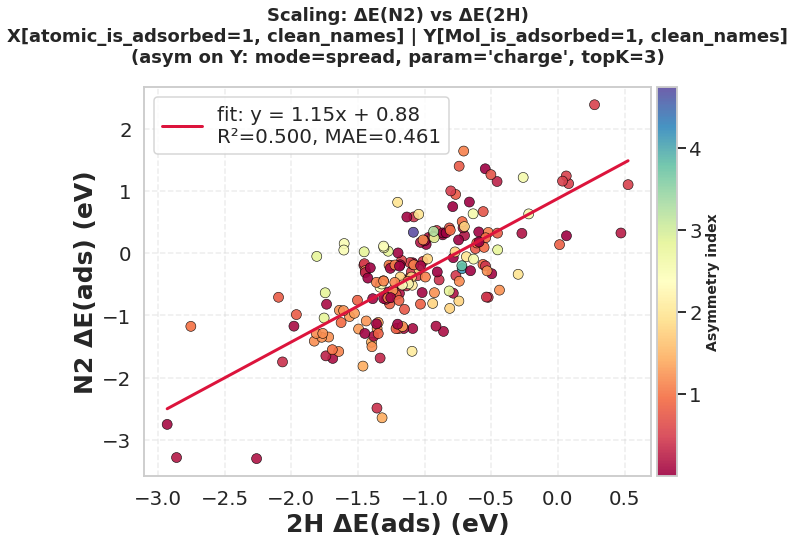

/home/parastoo/anaconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:105: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.


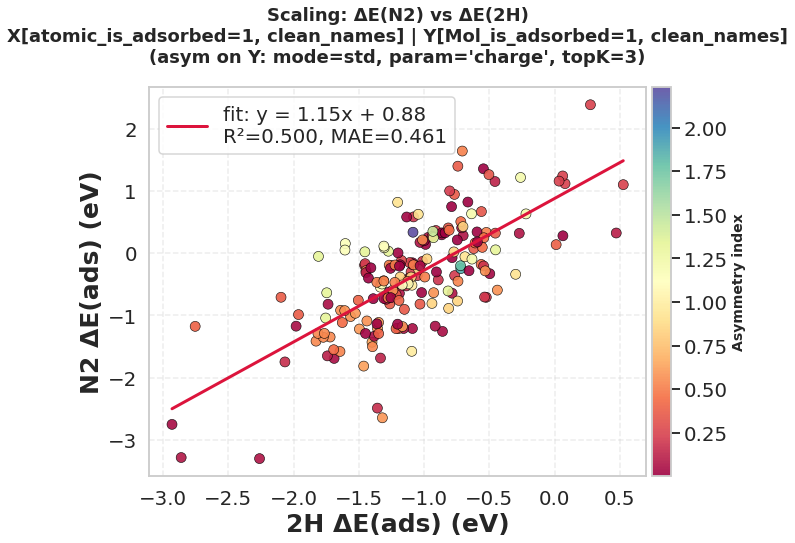

/home/parastoo/anaconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:105: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.


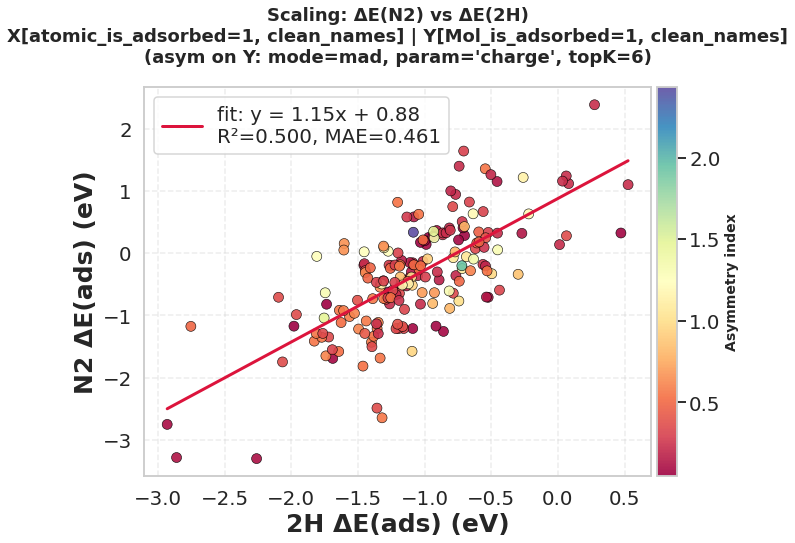

/home/parastoo/anaconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:105: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.


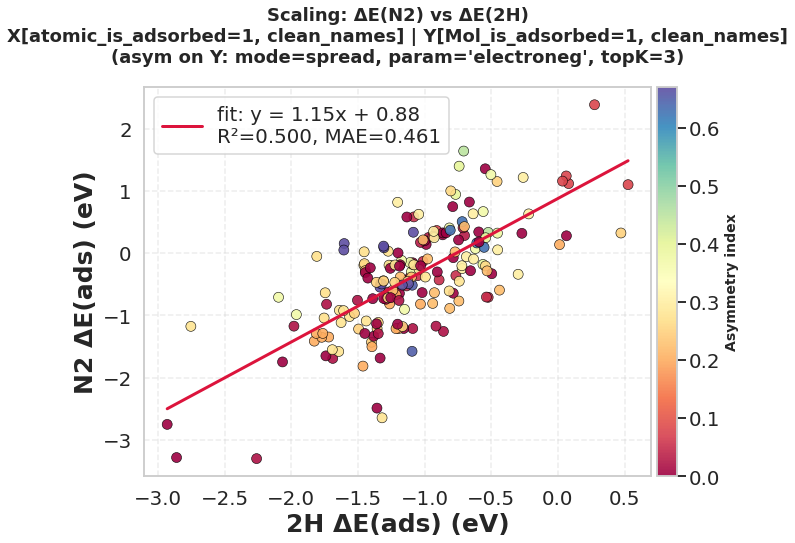

/home/parastoo/anaconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:105: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.


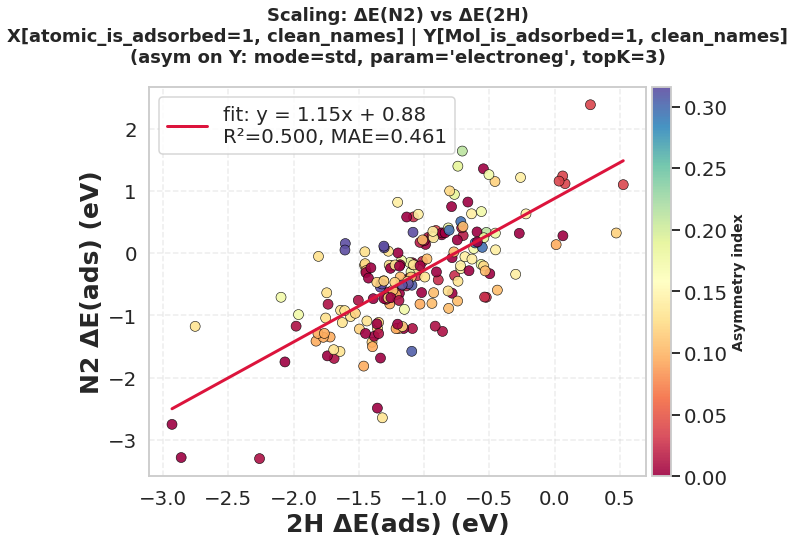

/home/parastoo/anaconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:105: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.


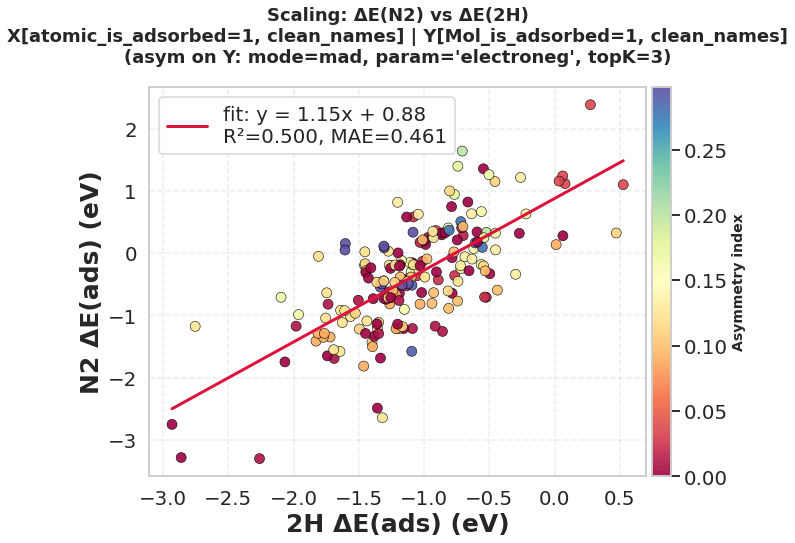

In [53]:

# 1) Your original case: y = N2H, x = N2 ; asymmetry from neighbor CHARGE (spread), top-6 nearest
df_1, mol1_name = df_H2_f, '2H'
df_2, mol2_name = df_N2_f,'N2'
out = plot_scaling_one(
    df_x=df_1, df_y=df_2,
    x_name=mol1_name, y_name=mol2_name,
    filter_adsorbed_x=True, ads_flag_col_x="atomic_is_adsorbed", ads_value_x=1, clean_names_x=True,
    asym_param="charge", asym_mode="spread", use_top_k_nn=3,
    save_path =working_dir + f'{mol1_name}_{mol2_name}_asymmod_spread_charge.pdf',
)

# 2) Try a different asymmetry definition (STD) on CHARGE
out = plot_scaling_one(
    df_x=df_1, df_y=df_2,
    x_name=mol1_name, y_name=mol2_name,
    filter_adsorbed_x=True, ads_flag_col_x="atomic_is_adsorbed", ads_value_x=1, clean_names_x=True,
    asym_param="charge", asym_mode="std", use_top_k_nn=3,
)

# 3) Use ELECTRONEGATIVITY instead of charge (if you have n{i}_electroneg columns)
out = plot_scaling_one(
    df_x=df_1, df_y=df_2,
    x_name=mol1_name, y_name=mol2_name,
    filter_adsorbed_x=True, ads_flag_col_x="atomic_is_adsorbed", ads_value_x=1, clean_names_x=True,
    asym_param="charge", asym_mode="mad", use_top_k_nn=6
)


#---------------------------------------#electroneg N2 N2H
# 1) Your original case: y = N2H, x = N2 ; asymmetry from neighbor CHARGE (spread), top-6 nearest

out = plot_scaling_one(
    df_x=df_1, df_y=df_2,
    x_name=mol1_name, y_name=mol2_name,
    filter_adsorbed_x=True, ads_flag_col_x="atomic_is_adsorbed", ads_value_x=1, clean_names_x=True,
    asym_param="electroneg", asym_mode="spread", use_top_k_nn=3,
    save_path =working_dir + f'{mol1_name}_{mol2_name}_asymmod_spread_electroneg.pdf'
)

# 2) Try a different asymmetry definition (STD) on CHARGE
out = plot_scaling_one(
    df_x=df_1, df_y=df_2,
    x_name=mol1_name, y_name=mol2_name,
    filter_adsorbed_x=True, ads_flag_col_x="atomic_is_adsorbed", ads_value_x=1, clean_names_x=True,
    asym_param="electroneg", asym_mode="std", use_top_k_nn=3,
)

# 3) Use ELECTRONEGATIVITY instead of charge (if you have n{i}_electroneg columns)
out = plot_scaling_one(
    df_x=df_1, df_y=df_2,
    x_name=mol1_name, y_name=mol2_name,
    filter_adsorbed_x=True, ads_flag_col_x="atomic_is_adsorbed", ads_value_x=1, clean_names_x=True,
    asym_param="electroneg", asym_mode="mad", use_top_k_nn=3,
)








/home/parastoo/anaconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:105: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.


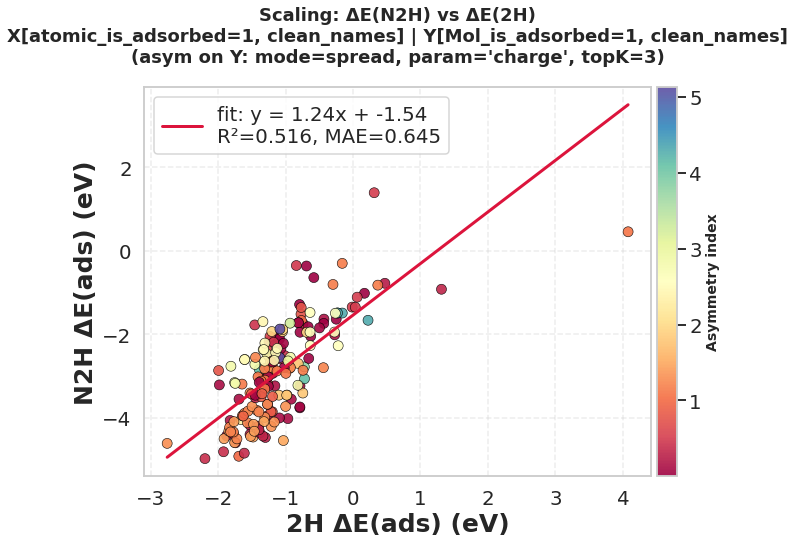

/home/parastoo/anaconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:105: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.


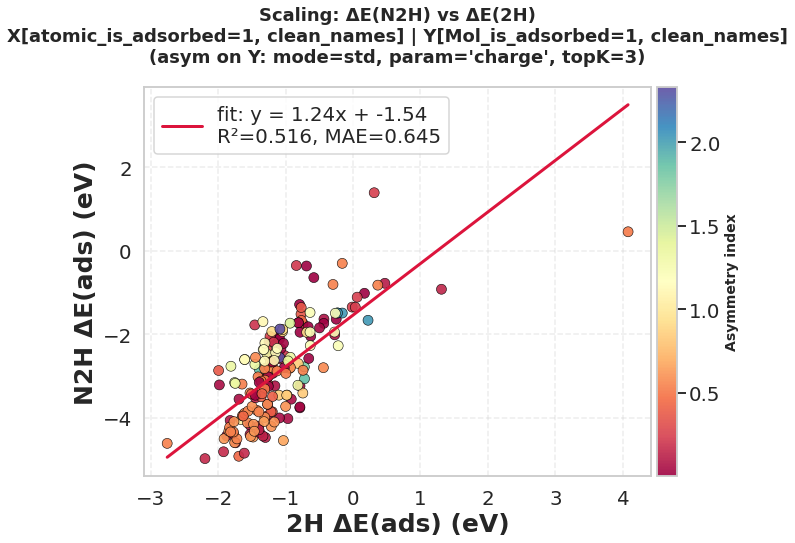

/home/parastoo/anaconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:105: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.


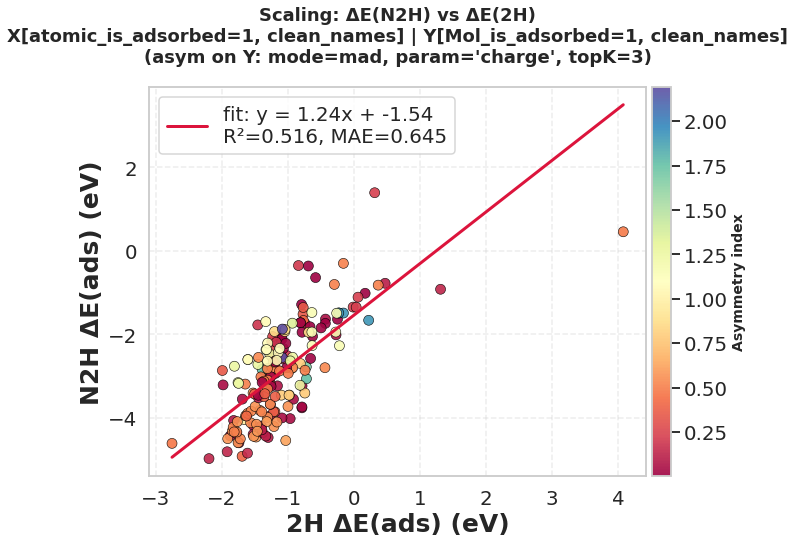

/home/parastoo/anaconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:105: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.


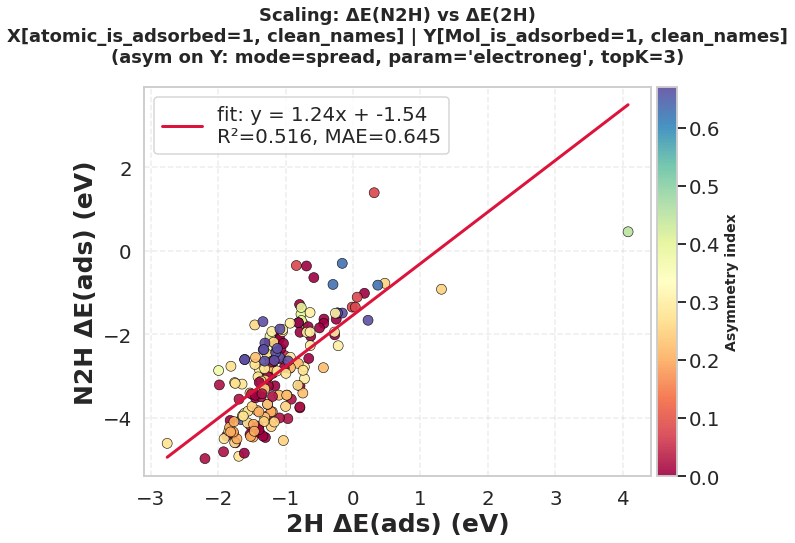

/home/parastoo/anaconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:105: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.


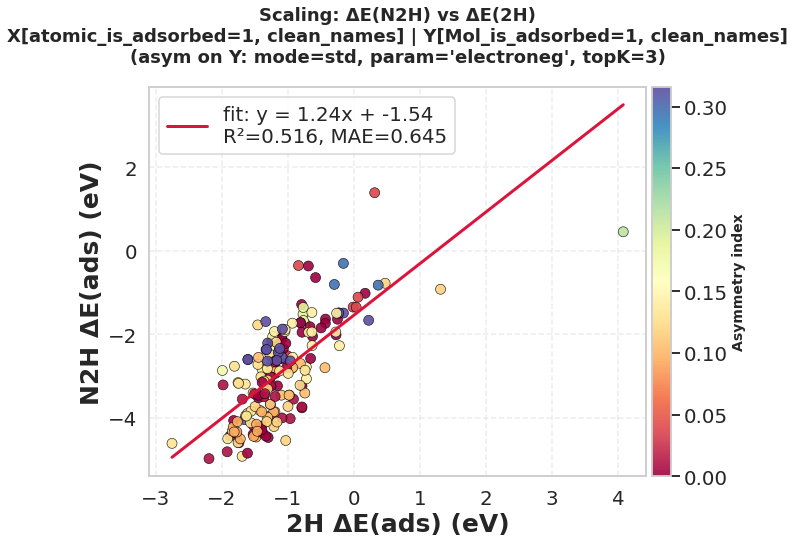

/home/parastoo/anaconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:105: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.


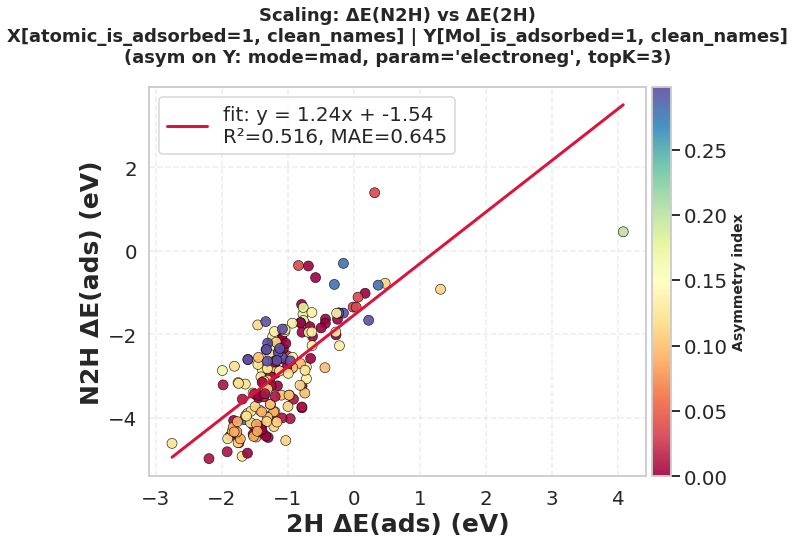

In [54]:

# 1) Your original case: y = N2H, x = N2 ; asymmetry from neighbor CHARGE (spread), top-6 nearest
df_1, mol1_name = df_H2_f, '2H'
df_2, mol2_name = df_N2H_f,'N2H'
out = plot_scaling_one(
    df_x=df_1, df_y=df_2,
    x_name=mol1_name, y_name=mol2_name,
    filter_adsorbed_x=True, ads_flag_col_x="atomic_is_adsorbed", ads_value_x=1, clean_names_x=True,
    asym_param="charge", asym_mode="spread", use_top_k_nn=3,
    save_path =working_dir + f'{mol1_name}_{mol2_name}_asymmod_spread_charge.pdf'
)

# 2) Try a different asymmetry definition (STD) on CHARGE
out = plot_scaling_one(
    df_x=df_1, df_y=df_2,
    x_name=mol1_name, y_name=mol2_name,
    filter_adsorbed_x=True, ads_flag_col_x="atomic_is_adsorbed", ads_value_x=1, clean_names_x=True,
    asym_param="charge", asym_mode="std", use_top_k_nn=3
)

# 3) Use ELECTRONEGATIVITY instead of charge (if you have n{i}_electroneg columns)
out = plot_scaling_one(
    df_x=df_1, df_y=df_2,
    x_name=mol1_name, y_name=mol2_name,
    filter_adsorbed_x=True, ads_flag_col_x="atomic_is_adsorbed", ads_value_x=1, clean_names_x=True,
    asym_param="charge", asym_mode="mad", use_top_k_nn=3
)


#---------------------------------------#electroneg N2 N2H
# 1) Your original case: y = N2H, x = N2 ; asymmetry from neighbor CHARGE (spread), top-6 nearest

out = plot_scaling_one(
    df_x=df_1, df_y=df_2,
    x_name=mol1_name, y_name=mol2_name,
    filter_adsorbed_x=True, ads_flag_col_x="atomic_is_adsorbed", ads_value_x=1, clean_names_x=True,
    asym_param="electroneg", asym_mode="spread", use_top_k_nn=3,
    save_path =working_dir + f'{mol1_name}_{mol2_name}_asymmod_spread_electroneg.pdf'
)

# 2) Try a different asymmetry definition (STD) on CHARGE
out = plot_scaling_one(
    df_x=df_1, df_y=df_2,
    x_name=mol1_name, y_name=mol2_name,
    filter_adsorbed_x=True, ads_flag_col_x="atomic_is_adsorbed", ads_value_x=1, clean_names_x=True,
    asym_param="electroneg", asym_mode="std", use_top_k_nn=3
)

# 3) Use ELECTRONEGATIVITY instead of charge (if you have n{i}_electroneg columns)
out = plot_scaling_one(
    df_x=df_1, df_y=df_2,
    x_name=mol1_name, y_name=mol2_name,
    filter_adsorbed_x=True, ads_flag_col_x="atomic_is_adsorbed", ads_value_x=1, clean_names_x=True,
    asym_param="electroneg", asym_mode="mad", use_top_k_nn=3
)








/home/parastoo/anaconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:105: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.


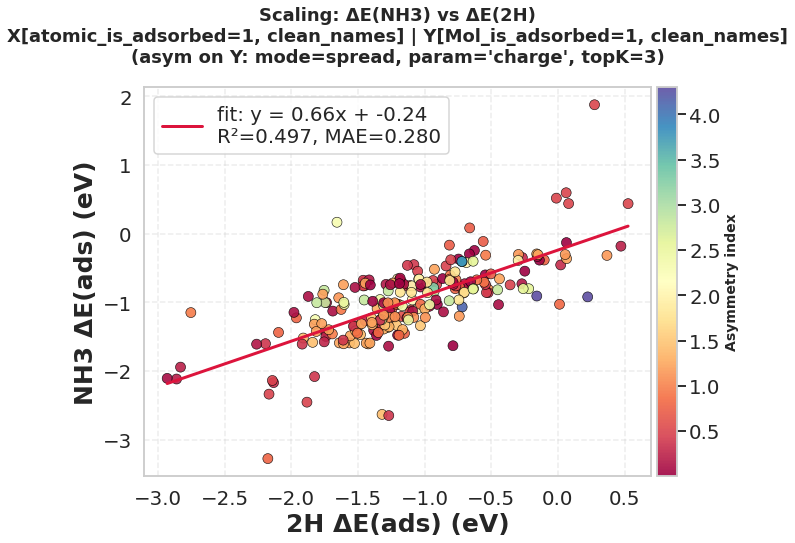

/home/parastoo/anaconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:105: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.


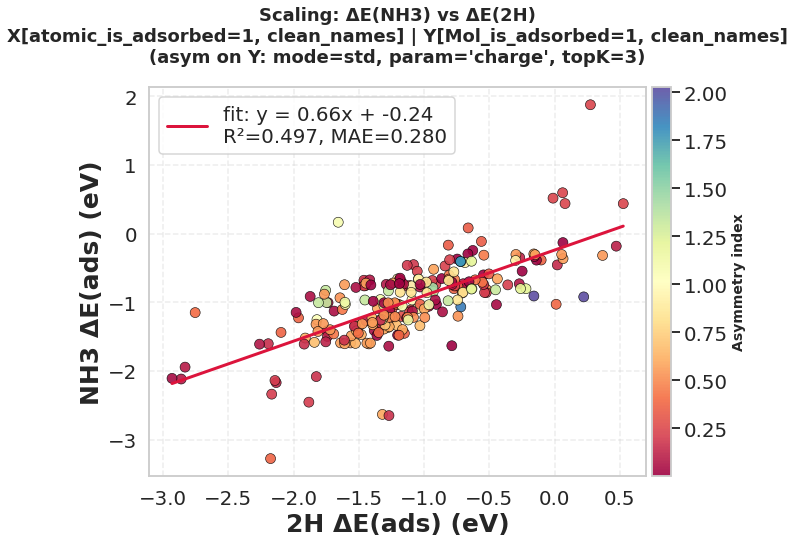

/home/parastoo/anaconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:105: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.


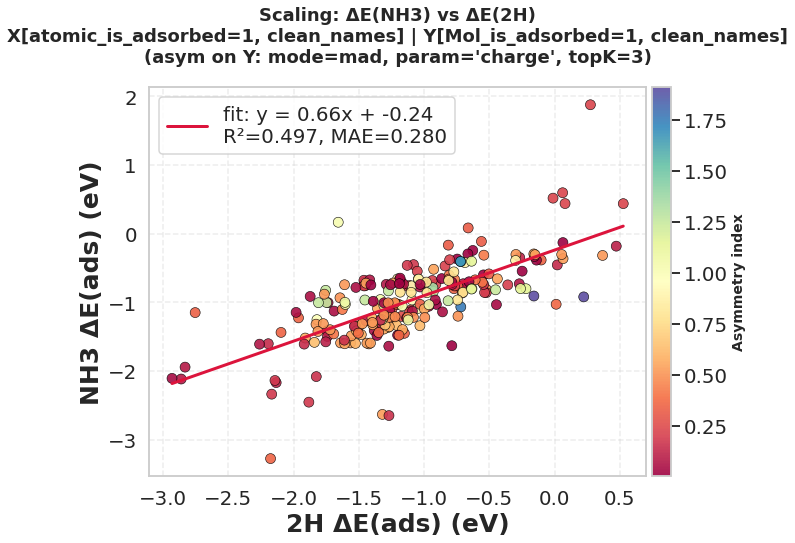

/home/parastoo/anaconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:105: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.


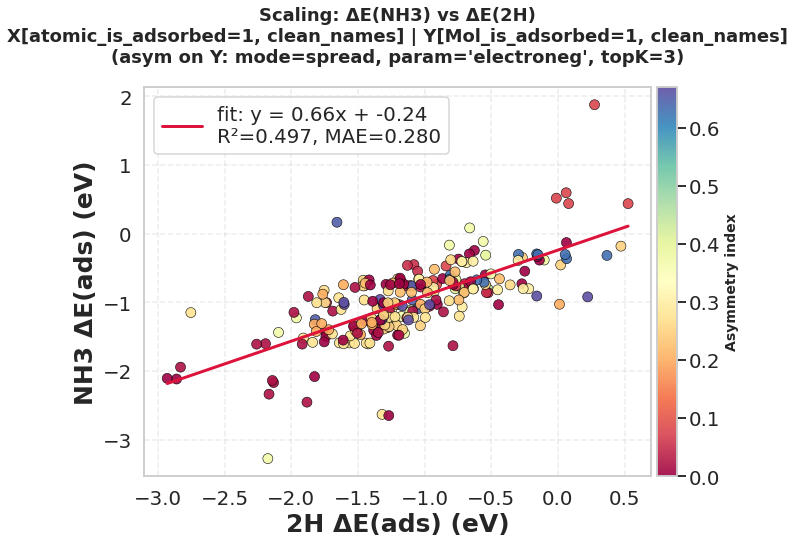

/home/parastoo/anaconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:105: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.


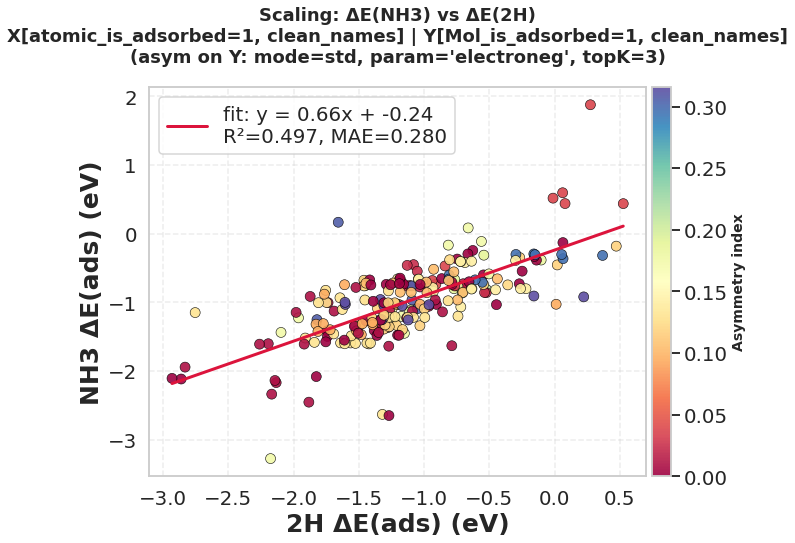

/home/parastoo/anaconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:105: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.


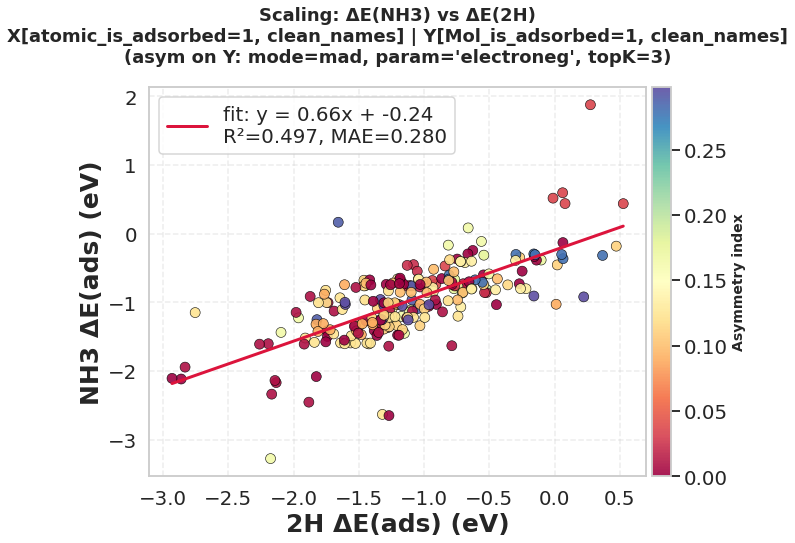

In [55]:

# 1) Your original case: y = N2H, x = N2 ; asymmetry from neighbor CHARGE (spread), top-6 nearest
df_1, mol1_name = df_H2_f, '2H'
df_2, mol2_name = df_NH3_f,'NH3'
out = plot_scaling_one(
    df_x=df_1, df_y=df_2,
    x_name=mol1_name, y_name=mol2_name,
    filter_adsorbed_x=True, ads_flag_col_x="atomic_is_adsorbed", ads_value_x=1, clean_names_x=True,
    asym_param="charge", asym_mode="spread", use_top_k_nn=3,
    save_path =working_dir + f'{mol1_name}_{mol2_name}_asymmod_spread_charge.pdf'
)

# 2) Try a different asymmetry definition (STD) on CHARGE
out = plot_scaling_one(
    df_x=df_1, df_y=df_2,
    x_name=mol1_name, y_name=mol2_name,
    filter_adsorbed_x=True, ads_flag_col_x="atomic_is_adsorbed", ads_value_x=1, clean_names_x=True,
    asym_param="charge", asym_mode="std", use_top_k_nn=3
)

# 3) Use ELECTRONEGATIVITY instead of charge (if you have n{i}_electroneg columns)
out = plot_scaling_one(
    df_x=df_1, df_y=df_2,
    x_name=mol1_name, y_name=mol2_name,
    filter_adsorbed_x=True, ads_flag_col_x="atomic_is_adsorbed", ads_value_x=1, clean_names_x=True,
    asym_param="charge", asym_mode="mad", use_top_k_nn=3
)


#---------------------------------------#electroneg N2 N2H
# 1) Your original case: y = N2H, x = N2 ; asymmetry from neighbor CHARGE (spread), top-6 nearest

out = plot_scaling_one(
    df_x=df_1, df_y=df_2,
    x_name=mol1_name, y_name=mol2_name,
    filter_adsorbed_x=True, ads_flag_col_x="atomic_is_adsorbed", ads_value_x=1, clean_names_x=True,
    asym_param="electroneg", asym_mode="spread", use_top_k_nn=3,
    save_path =working_dir + f'{mol1_name}_{mol2_name}_asymmod_spread_electroneg.pdf'
)

# 2) Try a different asymmetry definition (STD) on CHARGE
out = plot_scaling_one(
    df_x=df_1, df_y=df_2,
    x_name=mol1_name, y_name=mol2_name,
    filter_adsorbed_x=True, ads_flag_col_x="atomic_is_adsorbed", ads_value_x=1, clean_names_x=True,
    asym_param="electroneg", asym_mode="std", use_top_k_nn=3
)

# 3) Use ELECTRONEGATIVITY instead of charge (if you have n{i}_electroneg columns)
out = plot_scaling_one(
    df_x=df_1, df_y=df_2,
    x_name=mol1_name, y_name=mol2_name,
    filter_adsorbed_x=True, ads_flag_col_x="atomic_is_adsorbed", ads_value_x=1, clean_names_x=True,
    asym_param="electroneg", asym_mode="mad", use_top_k_nn=3
)








In [56]:
# --- Filtering rules ---
# N2: ads_e between -1 and -0.1, with Mol_is_adsorbed == 1
filt_N2 = df_N2_f[
    (df_N2_f["Mol_is_adsorbed"] == 1) &
    (df_N2_f["ads_e"] >= -1.0) & (df_N2_f["ads_e"] <= -0.1)
]

# N2H: ads_e < -0.5, with Mol_is_adsorbed == 1
filt_N2H = df_N2H_f[
    (df_N2H_f["Mol_is_adsorbed"] == 1) &
    (df_N2H_f["ads_e"] < -0.5)
]

# H2: ads_e between 0 and 2, with atomic_is_adsorbed == 1
filt_H2 = df_H2_f[
    (df_H2_f["atomic_is_adsorbed"] == 1) &
    (df_H2_f["ads_e"] >= 0.0) & (df_H2_f["ads_e"] <= 2.0)
]

# --- Print counts to confirm ---
print("Filtered N2 entries:", len(filt_N2))
print("Filtered N2H entries:", len(filt_N2H))
print("Filtered H2 entries:", len(filt_H2))


Filtered N2 entries: 99
Filtered N2H entries: 258
Filtered H2 entries: 31


In [57]:
# Get unique materials from each filtered set
materials_N2  = set(filt_N2["material"].unique())
materials_N2H = set(filt_N2H["material"].unique())
materials_H2  = set(filt_H2["material"].unique())

# Find common materials
common_materials = materials_N2  & materials_H2 #& materials_N2H

print("Number of common materials:", len(common_materials))
print("Common materials:", common_materials)


Number of common materials: 3
Common materials: {'8_VFe3', '19_CuPt7', '17_Co3Pt'}


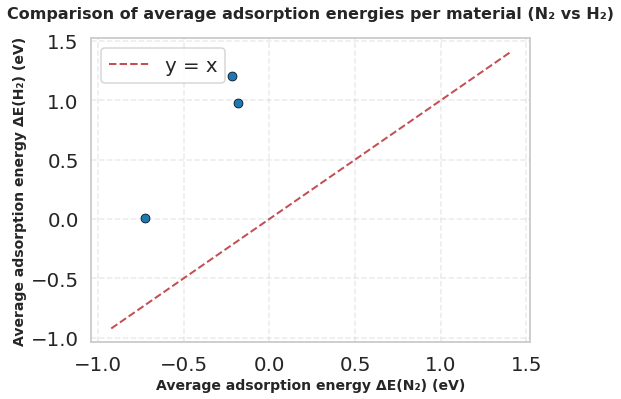

In [58]:
import seaborn as sns
import matplotlib.pyplot as plt

# --- Compute per-material average adsorption energies ---
avg_N2 = filt_N2.groupby("material")["ads_e"].mean().reset_index()
avg_H2 = filt_H2.groupby("material")["ads_e"].mean().reset_index()

# Merge so we only keep materials present in both
avg_merge = pd.merge(avg_N2, avg_H2, on="material", suffixes=("_N2", "_H2"))

# --- Scatter plot ---
plt.figure(figsize=(8, 6))
sns.scatterplot(
    data=avg_merge,
    x="ads_e_N2", y="ads_e_H2",
    s=80, edgecolor="black", color="tab:blue"
)

# Add reference line y=x
lims = [
    min(avg_merge["ads_e_N2"].min(), avg_merge["ads_e_H2"].min()) - 0.2,
    max(avg_merge["ads_e_N2"].max(), avg_merge["ads_e_H2"].max()) + 0.2
]
plt.plot(lims, lims, 'r--', lw=2, label="y = x")

plt.xlabel("Average adsorption energy ΔE(N₂) (eV)", fontsize=14, fontweight="bold")
plt.ylabel("Average adsorption energy ΔE(H₂) (eV)", fontsize=14, fontweight="bold")
plt.title("Comparison of average adsorption energies per material (N₂ vs H₂)",
          fontsize=16, fontweight="bold", pad=20)
plt.legend()
plt.grid(ls="--", alpha=0.4)
plt.tight_layout()
plt.show()


In [59]:
filt_H2["material"].unique()

array(['0_Co3Ni', '13_Zn3Cu', '14_Zn8Cu5', '15_ZnCu', '17_Co3Pt',
       '18_Cu3Pt', '19_CuPt7', '21_FeNi', '23_Ni3Pt', '31_Zn3Pt',
       '34_ZnPt3', '8_VFe3', '27_Al2Pt'], dtype=object)

In [60]:
import seaborn as sns
import matplotlib.pyplot as plt

def plot_orientation_heatmap(df, mol):
    # Updated orientation columns
    orient_cols = [
        "count_vertical_mol_is_adsorbed_1",
        "count_horizontal_mol_is_adsorbed_1",
        "count_tilted_vertical_mol_is_adsorbed_1",
        "count_tilted_horizontal_mol_is_adsorbed_1"
    ]
    
    # Copy relevant columns
    df_orient = df[["material", "total_sites"] + orient_cols].copy()
    for col in orient_cols:
        df_orient[col] = df_orient[col] / df_orient["total_sites"]
    
    # Melt for heatmap
    df_heat = df_orient.melt(
        id_vars="material",
        value_vars=orient_cols, 
        var_name="orientation", value_name="fraction"
    )
    
    # Clean orientation names
    df_heat["orientation"] = (
        df_heat["orientation"]
        .str.replace("count_", "")
        .str.replace("_mol_is_adsorbed_1", "")
        .replace({
            "vertical": "end-on",
            "horizontal": "side-on",
            "tilted_vertical": "tilted end-on",
            "tilted_horizontal": "tilted side-on"
        })
    )
    
    # Remove numeric prefixes from material names
    df_heat["material"] = df_heat["material"].str.replace(r"^\d+_", "", regex=True)
    
    # Pivot table for heatmap
    heatmap_data = df_heat.pivot(
        index="orientation", columns="material", values="fraction"
    )
    
    # Scale figure size
    n_alloys = heatmap_data.shape[1]
    fig_w = max(16, 0.5 * n_alloys)
    fig_h = 8
    
    fig, ax = plt.subplots(figsize=(fig_w, fig_h))
    sns_heat = sns.heatmap(
        heatmap_data,
        cmap="YlGnBu",
        cbar=False,
        annot=False,
        square=False,
        linecolor="black",
        linewidths=0.7,
        ax=ax
    )
    
    # Add custom colorbar
    cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])
    cbar = fig.colorbar(sns_heat.collections[0], cax=cbar_ax)
    cbar.set_label("Fraction of sites", fontsize=24, fontweight="bold", labelpad=20)
    cbar.ax.tick_params(labelsize=22, width=1.5)
    
    # Frame
    for spine in ax.spines.values():
        spine.set_edgecolor("black")
        spine.set_linewidth(1.5)
    
    ax.set_title(f"Orientation preference heatmap for {mol}",
                 fontsize=18, fontweight="bold", pad=20)
    ax.set_ylabel(f"{mol} Orientation", fontsize=28, fontweight="bold", labelpad=22)
    ax.set_xlabel('')
    ax.set_xticklabels(ax.get_xticklabels(), rotation=90, fontsize=22)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=24)
    
    plt.tight_layout(rect=[0, 0, 0.9, 1])
    #plt.savefig(f"orientation_preference_{mol}_heatmap.pdf", dpi=600)
    plt.show()


/home/parastoo/anaconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:65: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
/home/parastoo/anaconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:81: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


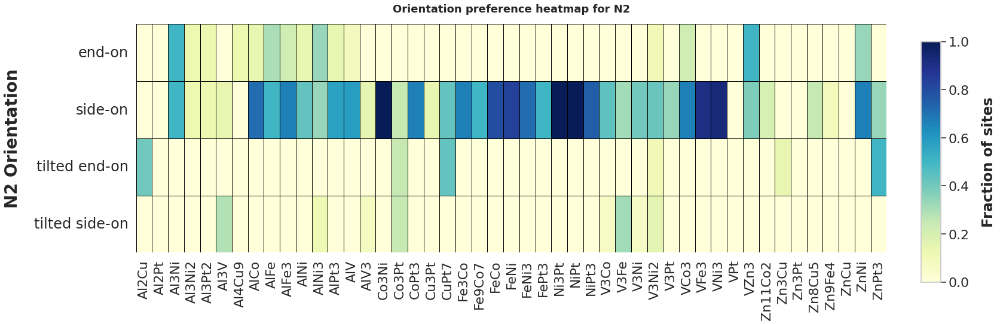

In [61]:
df = sum_N2
mol = 'N2'

plot_orientation_heatmap(df,mol)

/home/parastoo/anaconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:65: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
/home/parastoo/anaconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:81: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


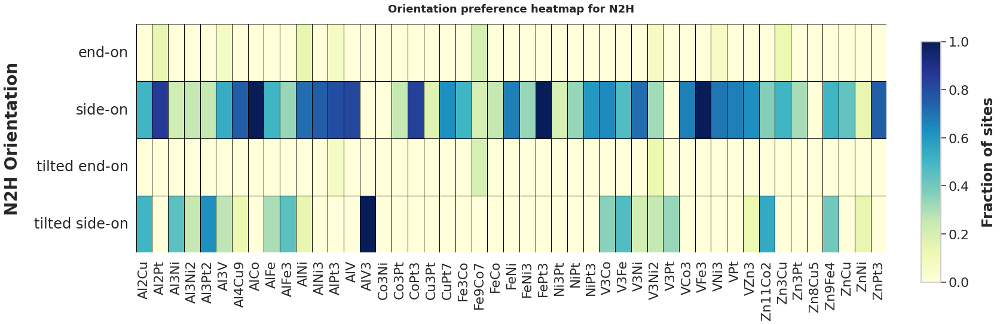

In [62]:
df = sum_N2H
mol = 'N2H'

plot_orientation_heatmap(df,mol)

In [63]:
def extract_orientation_fractions(sum_N2, sum_N2H):
    # orientation columns and mapping to clean names
    orient_cols = {
        "vertical": "end_on",
        "horizontal": "side_on",
        "tilted_vertical": "tilted_end_on",
        "tilted_horizontal": "tilted_side_on"
    }
    
    def normalize(df, prefix):
        df_copy = df[["material", "total_sites"] +
                     [f"count_{col}_mol_is_adsorbed_1" for col in orient_cols.keys()]
                    ].copy()
        
        # Fractions
        for col, new_name in orient_cols.items():
            df_copy[f"{prefix}_{new_name}"] = (
                df_copy[f"count_{col}_mol_is_adsorbed_1"] / df_copy["total_sites"]
            )
        
        return df_copy[["material"] + [f"{prefix}_{v}" for v in orient_cols.values()]]
    
    # Process N2 and N2H separately
    df_N2_frac = normalize(sum_N2, "N2")
    df_N2H_frac = normalize(sum_N2H, "N2H")
    
    # Merge on material
    df_combined = pd.merge(df_N2_frac, df_N2H_frac, on="material", how="inner")
    
    return df_combined

df_orientation = extract_orientation_fractions(sum_N2, sum_N2H)
# display(df_orientation.head())


In [64]:
df_orientation

,material,N2_end_on,N2_side_on,N2_tilted_end_on,N2_tilted_side_on,N2H_end_on,N2H_side_on,N2H_tilted_end_on,N2H_tilted_side_on
0,0_Co3Ni,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,10_Al3Ni2,0.125000,0.125000,0.000000,0.000000,0.000000,0.250000,0.000000,0.250000
2,10_Zn11Co2,0.000000,0.200000,0.000000,0.000000,0.000000,0.363636,0.000000,0.545455
3,11_Al3V,0.000000,0.142857,0.000000,0.285714,0.066667,0.533333,0.000000,0.266667
4,13_AlFe,0.300000,0.500000,0.000000,0.000000,0.000000,0.500000,0.000000,0.300000
5,13_Zn3Cu,0.000000,0.000000,0.142857,0.000000,0.125000,0.500000,0.000000,0.000000
6,14_Zn8Cu5,0.000000,0.250000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,15_AlV3,0.000000,0.153846,0.000000,0.076923,0.000000,0.000000,0.000000,1.000000
8,15_ZnCu,0.000000,0.000000,0.000000,0.000000,0.000000,0.428571,0.000000,0.000000
9,16_V3Ni2,0.105263,0.421053,0.105263,0.157895,0.062500,0.312500,0.125000,0.250000


In [65]:
import seaborn as sns
import matplotlib.pyplot as plt

def plot_orientation_heatmap(df, mol):
    # Orientation count columns in your dataframe
    orient_cols = [
        "count_vertical_mol_is_adsorbed_1",
        "count_tilted_vertical_mol_is_adsorbed_1",
        "count_tilted_horizontal_mol_is_adsorbed_1",
        "count_horizontal_mol_is_adsorbed_1"
    ]
    
    # Copy relevant columns
    df_orient = df[["material", "total_sites"] + orient_cols].copy()
    
    # Group into two categories
    df_orient["count_end_on"] = (
        df_orient["count_vertical_mol_is_adsorbed_1"] +
        df_orient["count_tilted_vertical_mol_is_adsorbed_1"]
    )
    df_orient["count_side_on"] = (
        df_orient["count_horizontal_mol_is_adsorbed_1"] +
        df_orient["count_tilted_horizontal_mol_is_adsorbed_1"]
    )
    
    # Normalize by total sites
    df_orient["end-on"] = df_orient["count_end_on"] / df_orient["total_sites"]
    df_orient["side-on"] = df_orient["count_side_on"] / df_orient["total_sites"]
    
    # Keep only relevant columns
    df_orient = df_orient[["material", "end-on", "side-on"]]
    
    # Melt for heatmap
    df_heat = df_orient.melt(
        id_vars="material",
        value_vars=["end-on", "side-on"],
        var_name="orientation", value_name="fraction"
    )
    
    # Clean material names (remove numeric prefixes)
    df_heat["material"] = df_heat["material"].str.replace(r"^\d+_", "", regex=True)
    
    # Pivot table for heatmap
    heatmap_data = df_heat.pivot(
        index="orientation", columns="material", values="fraction"
    )
    
    # Scale figure size
    n_alloys = heatmap_data.shape[1]
    fig_w = max(16, 0.5 * n_alloys)
    fig_h = 6
    
    fig, ax = plt.subplots(figsize=(fig_w, fig_h))
    sns_heat = sns.heatmap(
        heatmap_data,
        cmap="YlGnBu",
        cbar=False,
        annot=False,
        square=False,
        linecolor="black",
        linewidths=0.7,
        ax=ax
    )
    
    # Add custom colorbar
    cbar_ax = fig.add_axes([0.92, 0.15, 0.02, 0.7])
    cbar = fig.colorbar(sns_heat.collections[0], cax=cbar_ax)
    cbar.set_label("Fraction of sites", fontsize=24, fontweight="bold", labelpad=20)
    cbar.ax.tick_params(labelsize=22, width=1.5)
    
    # Frame
    for spine in ax.spines.values():
        spine.set_edgecolor("black")
        spine.set_linewidth(1.5)
    
    ax.set_title(f"Orientation preference heatmap for {mol}",
                 fontsize=18, fontweight="bold", pad=20)
    ax.set_ylabel(f"{mol} Orientation", fontsize=26, fontweight="bold", labelpad=22)
    ax.set_xlabel('')
    ax.set_xticklabels(ax.get_xticklabels(), rotation=90, fontsize=20)
    ax.set_yticklabels(ax.get_yticklabels(), fontsize=22)
    
    plt.tight_layout(rect=[0, 0, 0.9, 1])
    #plt.savefig(f"orientation_preference_{mol}_heatmap_side_end.pdf", dpi=600)
    plt.show()


/home/parastoo/anaconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:67: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
/home/parastoo/anaconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:83: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


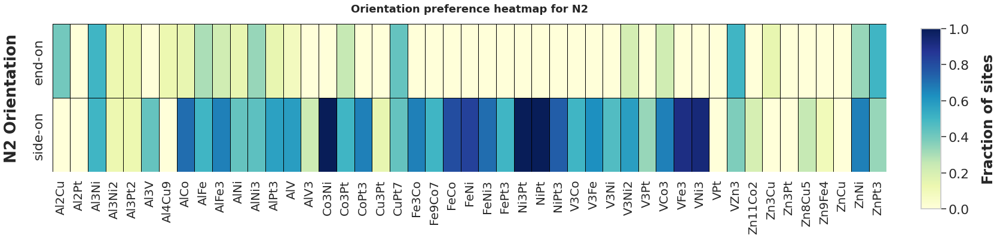

In [66]:
df = sum_N2
mol = 'N2'

plot_orientation_heatmap(df,mol)

/home/parastoo/anaconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:67: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.
/home/parastoo/anaconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:83: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


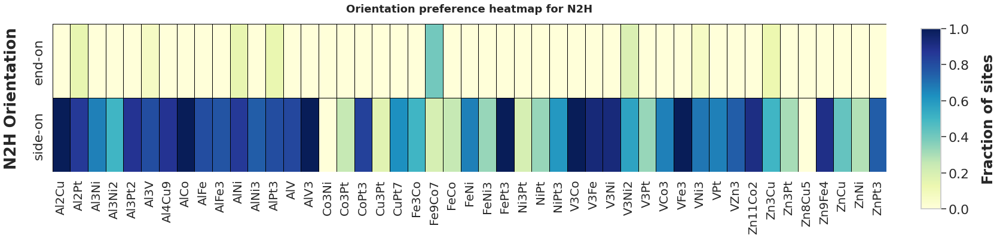

In [67]:
df = sum_N2H
mol = 'N2H'

plot_orientation_heatmap(df,mol)

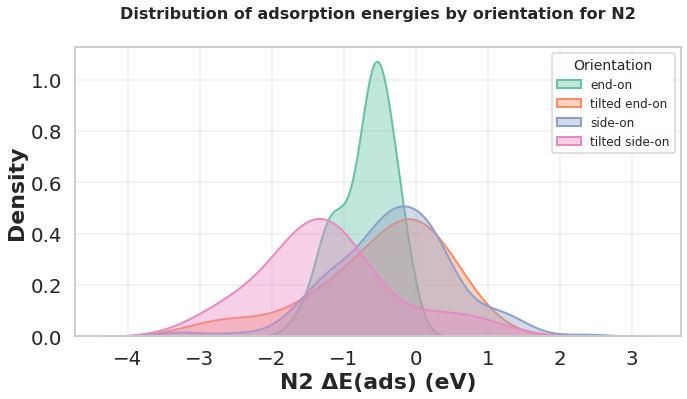

In [68]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

df = df_N2_f
mol = 'N2'

# 1) Keep only adsorbed cases
df_plot = df[df["Mol_is_adsorbed"] == 1].copy()

# 2) Map raw orientations to display labels
label_map = {
    "vertical": "end-on",
    "tilted_vertical": "tilted end-on",
    "horizontal": "side-on",
    "tilted_horizontal": "tilted side-on"
}
df_plot["orientation"] = (
    df_plot["orientation"].astype(str).str.strip().str.lower().map(label_map)
)

# 3) Drop rows with missing mapping / missing energy
df_plot = df_plot.dropna(subset=["orientation", "ads_e"])

# 4) Fix order for legend & consistent colors
order = ["end-on", "tilted end-on", "side-on", "tilted side-on"]
df_plot["orientation"] = pd.Categorical(df_plot["orientation"], categories=order, ordered=True)

# 5) Plot distributions
plt.figure(figsize=(10, 6))
palette = dict(zip(order, sns.color_palette("Set2", n_colors=len(order))))

for ori in order:
    sub = df_plot[df_plot["orientation"] == ori]
    if sub.empty:
        continue
    sns.kdeplot(
        data=sub,
        x="ads_e",
        fill=True,
        common_norm=False,
        alpha=0.4,
        linewidth=2,
        label=ori,
        color=palette[ori],
    )

plt.title("Distribution of adsorption energies by orientation for N2",
          fontsize=16, fontweight="bold", pad=29)
plt.xlabel(f"{mol} ΔE(ads) (eV)", fontsize=22, fontweight='bold')
plt.ylabel("Density", fontsize=22, fontweight='bold')
plt.grid(alpha=0.3)

# ✅ Make background white
plt.gcf().set_facecolor('white')  # Figure
plt.gca().set_facecolor('white')  # Axes

plt.legend(title="Orientation", frameon=True, fontsize=12, title_fontsize=14)
plt.tight_layout()
#plt.savefig(f"adsorption_distribution_{mol}_four_curves.pdf", dpi=600)
plt.show()


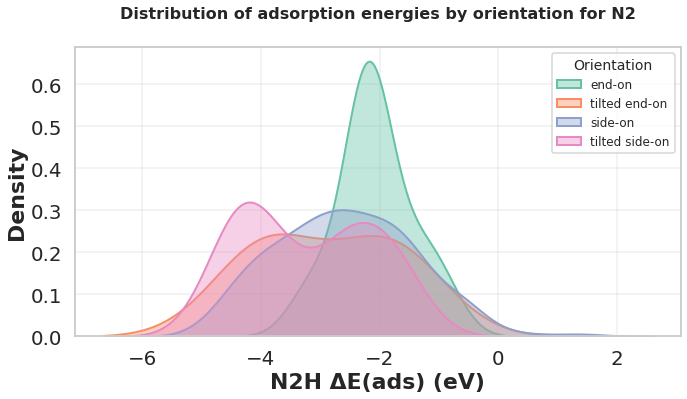

In [69]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

df = df_N2H_f
mol = 'N2H'

# 1) Keep only adsorbed cases
df_plot = df[df["Mol_is_adsorbed"] == 1].copy()

# 2) Map raw orientations to display labels
label_map = {
    "vertical": "end-on",
    "tilted_vertical": "tilted end-on",
    "horizontal": "side-on",
    "tilted_horizontal": "tilted side-on"
}
df_plot["orientation"] = (
    df_plot["orientation"].astype(str).str.strip().str.lower().map(label_map)
)

# 3) Drop rows with missing mapping / missing energy
df_plot = df_plot.dropna(subset=["orientation", "ads_e"])

# 4) Fix order for legend & consistent colors
order = ["end-on", "tilted end-on", "side-on", "tilted side-on"]
df_plot["orientation"] = pd.Categorical(df_plot["orientation"], categories=order, ordered=True)

# 5) Plot distributions
plt.figure(figsize=(10, 6))
palette = dict(zip(order, sns.color_palette("Set2", n_colors=len(order))))

for ori in order:
    sub = df_plot[df_plot["orientation"] == ori]
    if sub.empty:
        continue
    sns.kdeplot(
        data=sub,
        x="ads_e",
        fill=True,
        common_norm=False,
        alpha=0.4,
        linewidth=2,
        label=ori,
        color=palette[ori],
    )

plt.title("Distribution of adsorption energies by orientation for N2",
          fontsize=16, fontweight="bold", pad=29)
plt.xlabel(f"{mol} ΔE(ads) (eV)", fontsize=22, fontweight='bold')
plt.ylabel("Density", fontsize=22, fontweight='bold')
plt.grid(alpha=0.3)

# ✅ Make background white
plt.gcf().set_facecolor('white')  # Figure
plt.gca().set_facecolor('white')  # Axes

plt.legend(title="Orientation", frameon=True, fontsize=12, title_fontsize=14)
plt.tight_layout()
#plt.savefig(f"adsorption_distribution_{mol}_four_curves.pdf", dpi=600)
plt.show()


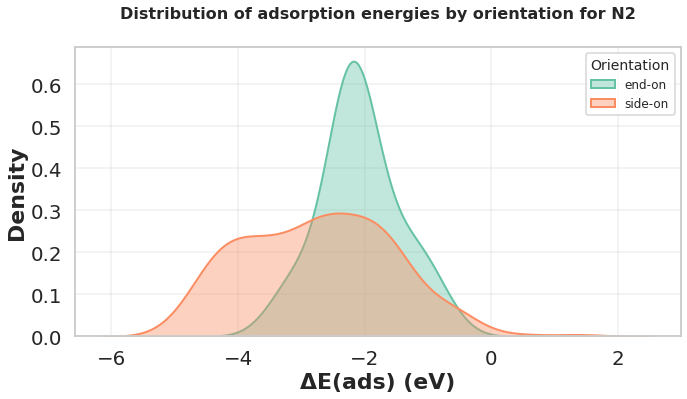

In [70]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

df = df_N2H_f
mol = 'N2H'

# 1) Keep only adsorbed cases
df_plot = df[df["Mol_is_adsorbed"] == 1].copy()

# 2) Map raw orientations to 2 display categories
label_map = {
    "vertical": "end-on",
    "tilted_vertical": "side-on",
    "horizontal": "side-on",
    "tilted_horizontal": "side-on"
}
df_plot["orientation"] = (
    df_plot["orientation"].astype(str).str.strip().str.lower().map(label_map)
)

# 3) Drop rows with missing mapping / missing energy
df_plot = df_plot.dropna(subset=["orientation", "ads_e"])

# 4) Fix order for legend & consistent colors
order = ["end-on", "side-on"]
df_plot["orientation"] = pd.Categorical(df_plot["orientation"], categories=order, ordered=True)

# 5) Plot distributions
plt.figure(figsize=(10, 6))
palette = dict(zip(order, sns.color_palette("Set2", n_colors=len(order))))

for ori in order:
    sub = df_plot[df_plot["orientation"] == ori]
    if sub.empty:
        continue
    sns.kdeplot(
        data=sub,
        x="ads_e",
        fill=True,
        common_norm=False,
        alpha=0.4,
        linewidth=2,
        label=ori,
        color=palette[ori],
    )

plt.title("Distribution of adsorption energies by orientation for N2",
          fontsize=16, fontweight="bold", pad=29)
plt.xlabel("ΔE(ads) (eV)", fontsize=22, fontweight='bold')
plt.ylabel("Density", fontsize=22, fontweight='bold')
plt.grid(alpha=0.3)
plt.legend(title="Orientation", frameon=True, fontsize=12, title_fontsize=14)
plt.tight_layout()
#plt.savefig("adsorption_distribution_N2_two_curves.pdf", dpi=600)
plt.show()


In [71]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

def _strip_prefix(name):
    return name.split("_", 1)[-1] if "_" in name else name

# ranges for guide lines
ADS_RANGE = {
    "2H": (-1.0, 0),
    "N2": (-1.0, 0.0),
    "N2H": (-2.5, -1.5),
    "NH3": (-1.0, 0),
}

def plot_scaling_material(
    df_x, df_y,
    x_name="N2", y_name="N2H",
    energy_col="ads_e",
    material_col="material", site_col="ad_site_number",
    filter_adsorbed_x=True, ads_flag_col_x="Mol_is_adsorbed", ads_value_x=1,
    filter_adsorbed_y=True, ads_flag_col_y="Mol_is_adsorbed", ads_value_y=1,
    clean_names_x=True, clean_names_y=True,
    figsize=(10, 8), palette=sns.color_palette("Set1", n_colors=9),
    point_size=100, point_edgecolor="black", point_alpha=0.9,
    dpi=600, save_prefix=None,
    show_legend=True   # 👈 NEW toggle for legend
):
    """
    Scaling plot: ΔE(y) vs ΔE(x), hue by material.
    Adds dashed lines for molecule-specific adsorption energy ranges.
    Only shows materials in legend that fall inside both range windows.
    Legend markers match scatter styling.
    """

    # ----- copies & filters -----
    gX, gY = df_x.copy(), df_y.copy()
    if filter_adsorbed_x and ads_flag_col_x in gX.columns:
        gX = gX[gX[ads_flag_col_x] == ads_value_x]
    if filter_adsorbed_y and ads_flag_col_y in gY.columns:
        gY = gY[gY[ads_flag_col_y] == ads_value_y]
    if clean_names_x and material_col in gX.columns:
        gX[material_col] = gX[material_col].astype(str).apply(_strip_prefix)
    if clean_names_y and material_col in gY.columns:
        gY[material_col] = gY[material_col].astype(str).apply(_strip_prefix)

    # ----- merge by material+site -----
    keys = [material_col, site_col]
    scaling_df = pd.merge(
        gY[keys + [energy_col]],
        gX[keys + [energy_col]],
        on=keys, how="inner",
        suffixes=(f"_{y_name}", f"_{x_name}")
    ).dropna()

    if scaling_df.empty:
        raise ValueError("No overlapping rows after merge.")

    # ----- find which materials fall inside valid window -----
    valid_materials = set()
    if x_name in ADS_RANGE and y_name in ADS_RANGE:
        xlow, xhigh = ADS_RANGE[x_name]
        ylow, yhigh = ADS_RANGE[y_name]
        mask = (
            (scaling_df[f"{energy_col}_{x_name}"].between(xlow, xhigh)) &
            (scaling_df[f"{energy_col}_{y_name}"].between(ylow, yhigh))
        )
        valid_materials = set(scaling_df.loc[mask, material_col])

    # ----- plot -----
    sns.set(style="whitegrid", context="talk", font_scale=1.2)
    fig, ax = plt.subplots(figsize=figsize)

    sns.scatterplot(
        data=scaling_df,
        x=f"{energy_col}_{x_name}",
        y=f"{energy_col}_{y_name}",
        hue=material_col,
        palette=palette,
        s=point_size,
        edgecolor=point_edgecolor, linewidth=0.6, alpha=point_alpha,
        ax=ax
    )

    ax.set_xlabel(f"{x_name} ΔE(ads) (eV)", fontsize=30, fontweight="bold")
    ax.set_ylabel(f"{y_name} ΔE(ads) (eV)", fontsize=30, fontweight="bold")
    ax.set_title(f"Scaling: ΔE({y_name}) vs ΔE({x_name})\nHue: Material",
                 fontsize=18, fontweight="bold", pad=25)

    # ----- add guide lines -----
    if x_name in ADS_RANGE:
        xmin, xmax = ADS_RANGE[x_name]
        ax.axvline(x=xmin, color="red", ls="--", lw=2)
        ax.axvline(x=xmax, color="red", ls="--", lw=2)
    if y_name in ADS_RANGE:
        ymin, ymax = ADS_RANGE[y_name]
        ax.axhline(y=ymin, color="red", ls="--", lw=2)
        ax.axhline(y=ymax, color="red", ls="--", lw=2)

    # ----- legend handling -----
    if show_legend:
        handles, labels = ax.get_legend_handles_labels()
        new_handles, new_labels = [], []
        for h, l in zip(handles, labels):
            if l in valid_materials:  # only keep valid materials
                new_handles.append(h)
                new_labels.append(l)

        if new_handles:
            leg = ax.legend(
                new_handles, new_labels,
                title="Material\n(inside window)",
                bbox_to_anchor=(1.25, 1),  # outside
                loc="upper left",
                borderaxespad=0,
                frameon=True
            )
            leg.get_frame().set_edgecolor("black")
            leg.get_frame().set_linewidth(1.2)
            leg.get_frame().set_facecolor("white")
            for lh in leg.legendHandles:
                lh.set_edgecolor(point_edgecolor)
                lh.set_linewidth(0.6)
                lh.set_alpha(point_alpha)
                lh.set_sizes([point_size])
    else:
        ax.get_legend().remove()  # 👈 hide legend completely

    ax.grid(ls="--", alpha=0.35)

    # leave more space on right for legend if shown
    if show_legend:
        plt.tight_layout(rect=[0, 0, 0.75, 1])
    else:
        plt.tight_layout()

    if save_prefix:
        pass
        #plt.savefig(f"{save_prefix}_scaling.pdf", dpi=dpi, bbox_inches="tight")

    plt.show()

    return {
        "valid_materials": valid_materials,
        "scaling_df": scaling_df.copy()
    }


/home/parastoo/anaconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:83: UserWarning: 
The palette list has fewer values (9) than needed (32) and will cycle, which may produce an uninterpretable plot.


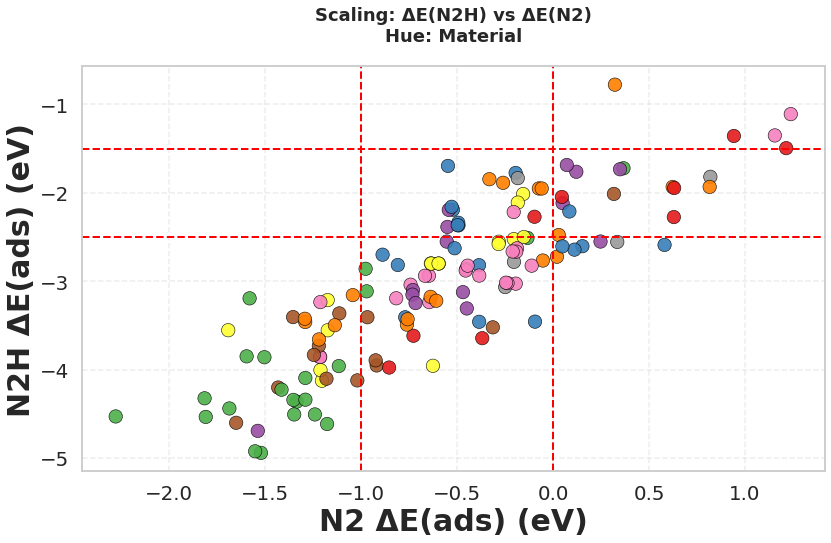

/home/parastoo/anaconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:83: UserWarning: 
The palette list has fewer values (9) than needed (32) and will cycle, which may produce an uninterpretable plot.


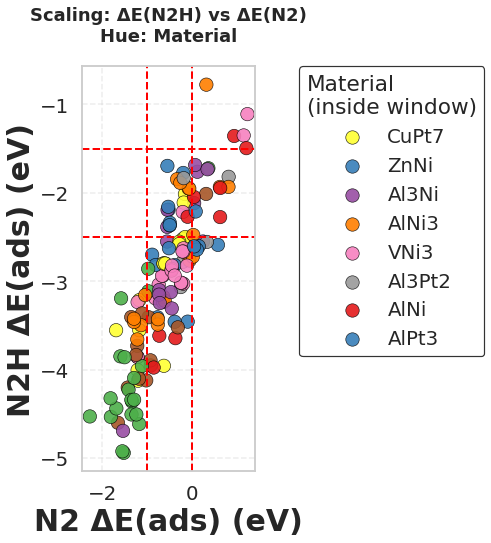

{'valid_materials': {'Al3Ni',
  'Al3Pt2',
  'AlNi',
  'AlNi3',
  'AlPt3',
  'CuPt7',
  'VNi3',
  'ZnNi'},
 'scaling_df':     material ad_site_number  ads_e_N2H  ads_e_N2
 0      CoPt3      6_ad_site  -1.356408  0.941930
 1      Fe3Co      3_ad_site  -2.588386  0.580736
 2       FeCo      4_ad_site  -2.508945 -0.133562
 3    Zn11Co2      3_ad_site  -2.115353  0.049683
 4    Zn11Co2      6_ad_site  -1.761316  0.121152
 5      Zn3Cu      8_ad_site  -0.776142  0.322138
 6      CuPt7      7_ad_site  -2.012685 -0.156127
 7      CuPt7      9_ad_site  -2.109680 -0.183757
 8      CuPt7      8_ad_site  -2.522392 -0.204494
 9      CuPt7      6_ad_site  -2.499294 -0.152241
 10    Fe9Co7      4_ad_site  -2.011761  0.316910
 11      FeNi      8_ad_site  -1.109021  1.238402
 12      FeNi     10_ad_site  -1.350199  1.155409
 13     Ni3Pt      5_ad_site  -1.818144  0.819344
 14    Zn9Fe4      4_ad_site  -2.046167  0.045897
 15      ZnNi      3_ad_site  -1.774454 -0.194989
 16      ZnNi      7_ad_site  

In [72]:
df_1, df1_name =df_N2_f, 'N2'
df_2, df2_name =df_N2H_f,'N2H'

plot_scaling_material(
    df_1, df_2,
    x_name=df1_name, y_name=df2_name,
    filter_adsorbed_x=True, ads_flag_col_x="Mol_is_adsorbed", ads_value_x=1,
    filter_adsorbed_y=True, ads_flag_col_y="Mol_is_adsorbed", ads_value_y=1,
    figsize=(12, 8), 
    #palette="tab20",
    point_size=180, 
    point_edgecolor="black", 
    point_alpha=0.9,
    show_legend=False,
    save_prefix=working_dir + f'hue_material_range_{df1_name}_{df2_name}_nolegend'
)

plot_scaling_material(
    df_1, df_2,
    x_name=df1_name, y_name=df2_name,
    filter_adsorbed_x=True, ads_flag_col_x="Mol_is_adsorbed", ads_value_x=1,
    filter_adsorbed_y=True, ads_flag_col_y="Mol_is_adsorbed", ads_value_y=1,
    figsize=(12, 8), 
    #palette="tab20",
    point_size=180, 
    point_edgecolor="black", 
    point_alpha=0.9,
    show_legend=True,
    save_prefix=working_dir + f'hue_material_range_{df1_name}_{df2_name}_withlegend'
)

/home/parastoo/anaconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:83: UserWarning: 
The palette list has fewer values (9) than needed (40) and will cycle, which may produce an uninterpretable plot.


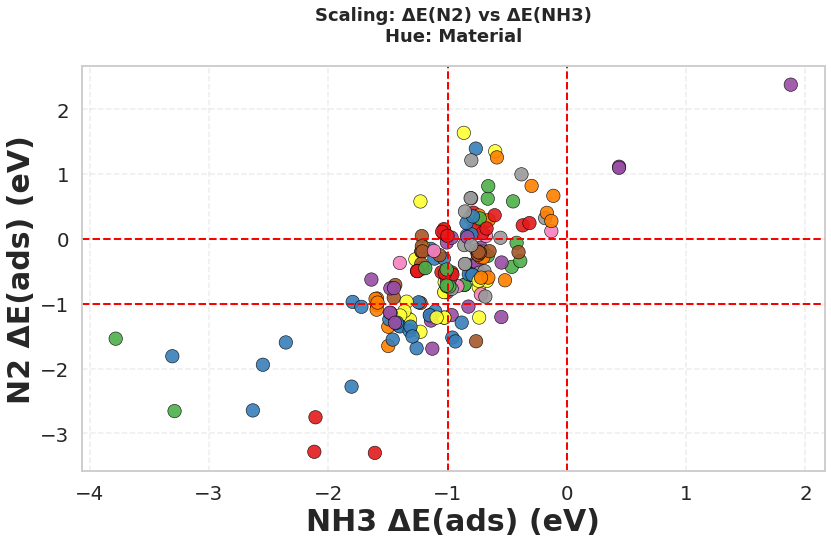

/home/parastoo/anaconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:83: UserWarning: 
The palette list has fewer values (9) than needed (40) and will cycle, which may produce an uninterpretable plot.


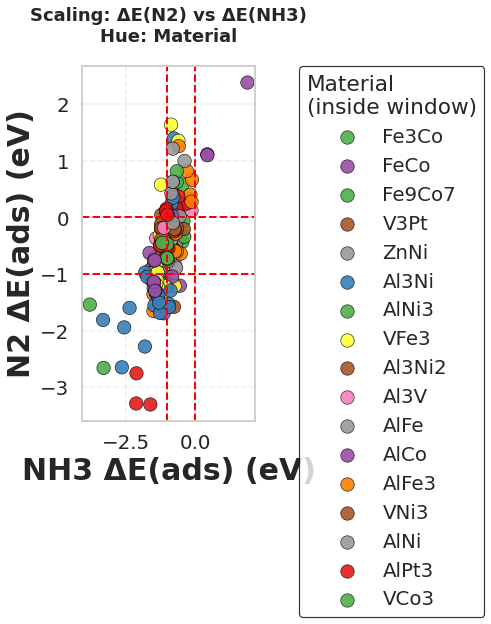

{'valid_materials': {'Al3Ni',
  'Al3Ni2',
  'Al3V',
  'AlCo',
  'AlFe',
  'AlFe3',
  'AlNi',
  'AlNi3',
  'AlPt3',
  'Fe3Co',
  'Fe9Co7',
  'FeCo',
  'V3Pt',
  'VCo3',
  'VFe3',
  'VNi3',
  'ZnNi'},
 'scaling_df':     material ad_site_number  ads_e_N2  ads_e_NH3
 0      Co3Ni      3_ad_site  0.281467  -0.729222
 1      Co3Ni      4_ad_site  0.405509  -0.782529
 2      Co3Ni      5_ad_site  0.210675  -0.369471
 3      Co3Ni      8_ad_site  0.171964  -0.776316
 4      CoPt3      8_ad_site  1.395318  -0.762742
 5      Fe3Co      3_ad_site  0.580736  -0.450712
 6      Fe3Co      7_ad_site -0.430330  -0.461198
 7      Fe3Co      4_ad_site -0.527983  -0.760718
 8       FeCo      3_ad_site -0.361763  -0.761186
 9       FeCo      4_ad_site -0.133562  -0.720856
 10      FeCo      5_ad_site -0.387970  -0.755759
 11      FeCo      6_ad_site -0.362830  -0.547013
 12     FeNi3      7_ad_site  0.362714  -0.736588
 13     FeNi3      9_ad_site  0.270066  -0.682158
 14     FeNi3      5_ad_site  0.29290

In [73]:
df_1, df1_name =df_NH3_f, 'NH3'
df_2, df2_name =df_N2_f,'N2'

plot_scaling_material(
    df_1, df_2,
    x_name=df1_name, y_name=df2_name,
    filter_adsorbed_x=True, ads_flag_col_x="Mol_is_adsorbed", ads_value_x=1,
    filter_adsorbed_y=True, ads_flag_col_y="Mol_is_adsorbed", ads_value_y=1,
    figsize=(12, 8), 
    #palette="tab20",
    point_size=180, 
    point_edgecolor="black", 
    point_alpha=0.9,
    show_legend=False,
    save_prefix=working_dir + f'hue_material_range_{df1_name}_{df2_name}_nolegend'
)

plot_scaling_material(
    df_1, df_2,
    x_name=df1_name, y_name=df2_name,
    filter_adsorbed_x=True, ads_flag_col_x="Mol_is_adsorbed", ads_value_x=1,
    filter_adsorbed_y=True, ads_flag_col_y="Mol_is_adsorbed", ads_value_y=1,
    figsize=(12, 8), 
    #palette="tab20",
    point_size=180, 
    point_edgecolor="black", 
    point_alpha=0.9,
    show_legend=True,
    save_prefix=working_dir + f'hue_material_range_{df1_name}_{df2_name}_withlegend'
)

/home/parastoo/anaconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:83: UserWarning: 
The palette list has fewer values (9) than needed (38) and will cycle, which may produce an uninterpretable plot.


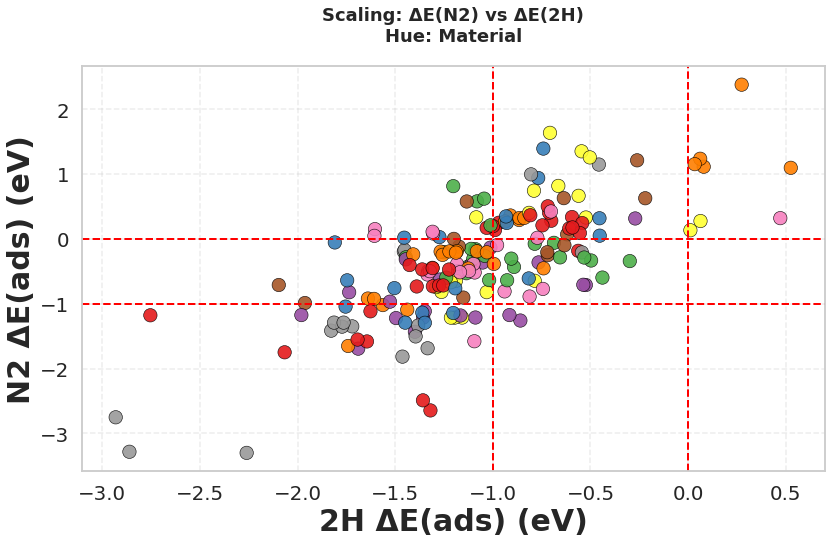

/home/parastoo/anaconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:83: UserWarning: The palette list has more values (9) than needed (7), which may not be intended.


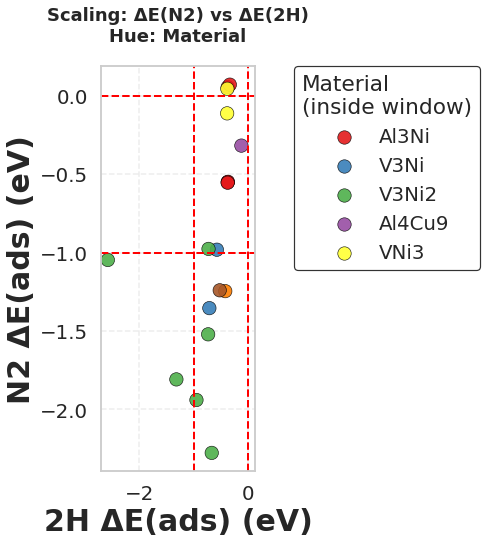

{'valid_materials': {'Al3Ni', 'Al4Cu9', 'V3Ni', 'V3Ni2', 'VNi3'},
 'scaling_df':    material ad_site_number  ads_e_N2  ads_e_2H
 0     Al3Ni      7_ad_site -0.550404 -0.377439
 1     Al3Ni      9_ad_site  0.055777 -0.376583
 2     Al3Ni      2_ad_site -0.548259 -0.372987
 3     Al3Ni      5_ad_site  0.071766 -0.338264
 4     Al3Ni      8_ad_site -0.554091 -0.377908
 5      V3Ni      3_ad_site -1.354501 -0.713716
 6      V3Ni      6_ad_site -0.981662 -0.575560
 7     V3Ni2      3_ad_site -1.521686 -0.735882
 8     V3Ni2     20_ad_site -1.809405 -1.318227
 9     V3Ni2     19_ad_site -0.976562 -0.729060
 10    V3Ni2      4_ad_site -2.278492 -0.670040
 11    V3Ni2     12_ad_site -1.940945 -0.950119
 12    V3Ni2     10_ad_site -1.047214 -2.574839
 13   Al4Cu9      2_ad_site -0.317187 -0.126562
 14     V3Co      2_ad_site -1.245990 -0.422290
 15     VNi3      3_ad_site  0.045462 -0.384174
 16     VNi3      4_ad_site -0.111385 -0.387558
 17     V3Fe      2_ad_site -1.240661 -0.523601}

In [74]:
df_1, df1_name =df_H2_f, '2H'
df_2, df2_name =df_N2_f,'N2'

plot_scaling_material(
    df_1, df_2,
    x_name=df1_name, y_name=df2_name,
    filter_adsorbed_x=True, ads_flag_col_x="atomic_is_adsorbed", ads_value_x=1,
    filter_adsorbed_y=True, ads_flag_col_y="Mol_is_adsorbed", ads_value_y=1,
    figsize=(12, 8), 
    #palette="tab20",
    point_size=180, 
    point_edgecolor="black", 
    point_alpha=0.9,
    show_legend=False,
    save_prefix=working_dir + f'hue_material_range_{df1_name}_{df2_name}_nolegend'
)

plot_scaling_material(
    df_1, df_2,
    x_name=df1_name, y_name=df2_name,
    filter_adsorbed_x=True, ads_flag_col_x="Mol_is_adsorbed", ads_value_x=1,
    filter_adsorbed_y=True, ads_flag_col_y="Mol_is_adsorbed", ads_value_y=1,
    figsize=(12, 8), 
    #palette="tab20",
    point_size=180, 
    point_edgecolor="black", 
    point_alpha=0.9,
    show_legend=True,
    save_prefix=working_dir + f'hue_material_range_{df1_name}_{df2_name}_withlegend'
)

/home/parastoo/anaconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:83: UserWarning: 
The palette list has fewer values (9) than needed (41) and will cycle, which may produce an uninterpretable plot.


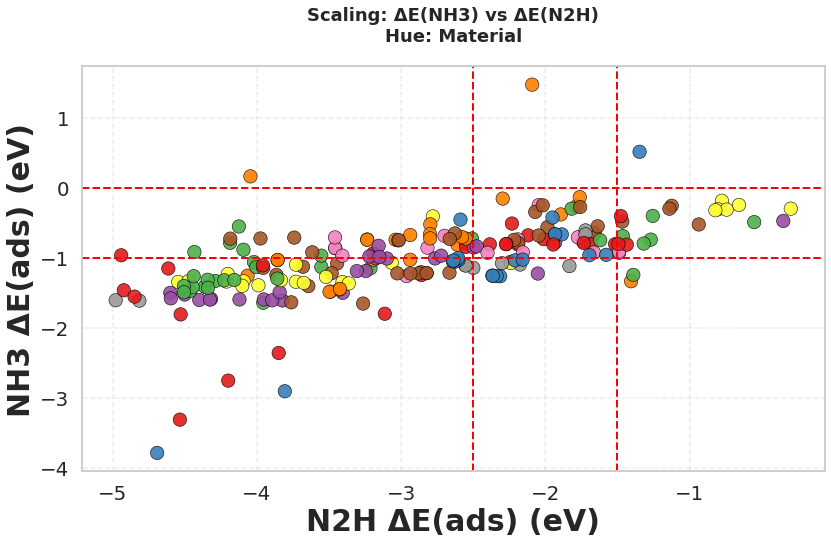

/home/parastoo/anaconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:83: UserWarning: 
The palette list has fewer values (9) than needed (41) and will cycle, which may produce an uninterpretable plot.


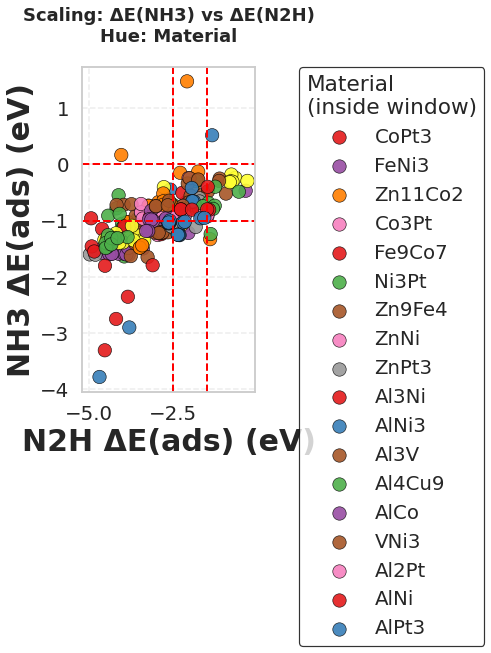

{'valid_materials': {'Al2Pt',
  'Al3Ni',
  'Al3V',
  'Al4Cu9',
  'AlCo',
  'AlNi',
  'AlNi3',
  'AlPt3',
  'Co3Pt',
  'CoPt3',
  'Fe9Co7',
  'FeNi3',
  'Ni3Pt',
  'VNi3',
  'Zn11Co2',
  'Zn9Fe4',
  'ZnNi',
  'ZnPt3'},
 'scaling_df':     material ad_site_number  ads_e_NH3  ads_e_N2H
 0      CoPt3      3_ad_site  -0.800898  -1.516612
 1      CoPt3      5_ad_site  -0.761764  -1.738949
 2      Fe3Co      3_ad_site  -0.450712  -2.588386
 3       FeCo      4_ad_site  -0.720856  -2.508945
 4      FeNi3      3_ad_site  -0.470030  -0.350612
 5      FeNi3      4_ad_site  -0.777312  -1.932099
 6    Zn11Co2      7_ad_site  -0.809543  -2.609197
 7    Zn11Co2      9_ad_site  -1.330984  -1.405679
 8    Zn11Co2      4_ad_site  -0.261751  -1.783904
 9    Zn11Co2      5_ad_site  -0.747235  -1.950612
 10   Zn11Co2     11_ad_site  -0.150688  -2.295608
 11   Zn11Co2      8_ad_site  -0.376876  -1.892435
 12   Zn11Co2      6_ad_site  -0.129912  -1.761316
 13   Zn11Co2     10_ad_site  -1.053828  -2.241044
 14

In [75]:
df_1, df1_name =df_N2H_f, 'N2H'
df_2, df2_name =df_NH3_f,'NH3'

plot_scaling_material(
    df_1, df_2,
    x_name=df1_name, y_name=df2_name,
    filter_adsorbed_x=True, ads_flag_col_x="Mol_is_adsorbed", ads_value_x=1,
    filter_adsorbed_y=True, ads_flag_col_y="Mol_is_adsorbed", ads_value_y=1,
    figsize=(12, 8), 
    #palette="tab20",
    point_size=180, 
    point_edgecolor="black", 
    point_alpha=0.9,
    show_legend=False,
    save_prefix=working_dir + f'hue_material_range_{df1_name}_{df2_name}_nolegend'
)

plot_scaling_material(
    df_1, df_2,
    x_name=df1_name, y_name=df2_name,
    filter_adsorbed_x=True, ads_flag_col_x="Mol_is_adsorbed", ads_value_x=1,
    filter_adsorbed_y=True, ads_flag_col_y="Mol_is_adsorbed", ads_value_y=1,
    figsize=(12, 8), 
    #palette="tab20",
    point_size=180, 
    point_edgecolor="black", 
    point_alpha=0.9,
    show_legend=True,
    save_prefix=working_dir + f'hue_material_range_{df1_name}_{df2_name}_withlegend'
)

/home/parastoo/anaconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:83: UserWarning: 
The palette list has fewer values (9) than needed (41) and will cycle, which may produce an uninterpretable plot.


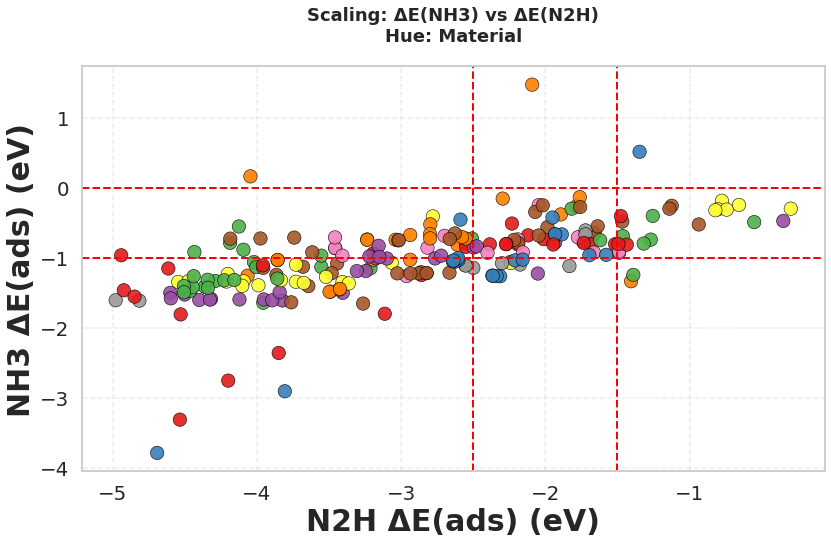

/home/parastoo/anaconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:83: UserWarning: 
The palette list has fewer values (9) than needed (41) and will cycle, which may produce an uninterpretable plot.


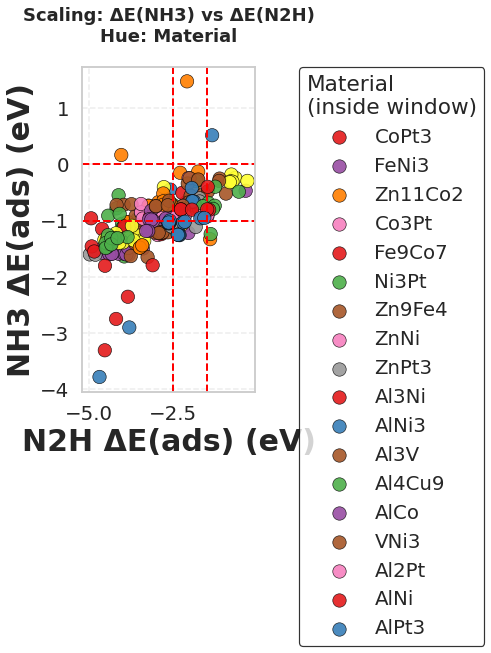

{'valid_materials': {'Al2Pt',
  'Al3Ni',
  'Al3V',
  'Al4Cu9',
  'AlCo',
  'AlNi',
  'AlNi3',
  'AlPt3',
  'Co3Pt',
  'CoPt3',
  'Fe9Co7',
  'FeNi3',
  'Ni3Pt',
  'VNi3',
  'Zn11Co2',
  'Zn9Fe4',
  'ZnNi',
  'ZnPt3'},
 'scaling_df':     material ad_site_number  ads_e_NH3  ads_e_N2H
 0      CoPt3      3_ad_site  -0.800898  -1.516612
 1      CoPt3      5_ad_site  -0.761764  -1.738949
 2      Fe3Co      3_ad_site  -0.450712  -2.588386
 3       FeCo      4_ad_site  -0.720856  -2.508945
 4      FeNi3      3_ad_site  -0.470030  -0.350612
 5      FeNi3      4_ad_site  -0.777312  -1.932099
 6    Zn11Co2      7_ad_site  -0.809543  -2.609197
 7    Zn11Co2      9_ad_site  -1.330984  -1.405679
 8    Zn11Co2      4_ad_site  -0.261751  -1.783904
 9    Zn11Co2      5_ad_site  -0.747235  -1.950612
 10   Zn11Co2     11_ad_site  -0.150688  -2.295608
 11   Zn11Co2      8_ad_site  -0.376876  -1.892435
 12   Zn11Co2      6_ad_site  -0.129912  -1.761316
 13   Zn11Co2     10_ad_site  -1.053828  -2.241044
 14

In [76]:
df_1, df1_name =df_N2H_f, 'N2H'
df_2, df2_name =df_NH3_f,'NH3'

plot_scaling_material(
    df_1, df_2,
    x_name=df1_name, y_name=df2_name,
    filter_adsorbed_x=True, ads_flag_col_x="Mol_is_adsorbed", ads_value_x=1,
    filter_adsorbed_y=True, ads_flag_col_y="Mol_is_adsorbed", ads_value_y=1,
    figsize=(12, 8), 
    #palette="tab20",
    point_size=180, 
    point_edgecolor="black", 
    point_alpha=0.9,
    show_legend=False,
    save_prefix=working_dir + f'hue_material_range_{df1_name}_{df2_name}_nolegend'
)

plot_scaling_material(
    df_1, df_2,
    x_name=df1_name, y_name=df2_name,
    filter_adsorbed_x=True, ads_flag_col_x="Mol_is_adsorbed", ads_value_x=1,
    filter_adsorbed_y=True, ads_flag_col_y="Mol_is_adsorbed", ads_value_y=1,
    figsize=(12, 8), 
    #palette="tab20",
    point_size=180, 
    point_edgecolor="black", 
    point_alpha=0.9,
    show_legend=True,
    save_prefix=working_dir + f'hue_material_range_{df1_name}_{df2_name}_withlegend'
)

In [77]:
# Assuming df_N2 and df_N2H are your dataframes
df_1 = df_N2
df_2 = df_N2H

df_1 = df_1[df_1['Mol_is_adsorbed']==1]
df_2 = df_2[df_2['Mol_is_adsorbed']==1]

common_sites = pd.merge(
    df_1[['material', 'ad_site_number']],
    df_2[['material', 'ad_site_number']],
    on=['material', 'ad_site_number'],
    how='inner'
).drop_duplicates()

print("Number of common sites:", common_sites.shape[0])
print(common_sites.head())


Number of common sites: 148
  material ad_site_number
0  1_CoPt3      6_ad_site
1   2_CuPt      3_ad_site
2   2_CuPt      4_ad_site
3   2_CuPt      2_ad_site
4  3_Fe3Co      3_ad_site


In [78]:
import pandas as pd

ADS_RANGE = {
    "2H": (-1.5, 0),
    "N2": (-1.0, 0.0),
    "N2H": (-2.5, -1.5),
    "NH3": (-1.0, 0),
}
def materials_in_all_ranges(df1, df2, df3, df4,
                            names=["2H", "N2", "N2H", "NH3"],
                            energy_col="ads_e", material_col="material"):
    """
    Find materials that have at least one site within the defined ADS_RANGE
    for each of the four molecules. Also count how many sites per material
    fall in range for each molecule.
    """
    dfs = [df1, df2, df3, df4]
    counts = {}

    for df, mol in zip(dfs, names):
        low, high = ADS_RANGE[mol]
        mask = df[energy_col].between(low, high)

        # count sites in range per material
        cnt = (df.loc[mask]
                 .groupby(material_col)
                 .size()
                 .reset_index(name=f"{mol}_count"))
        counts[mol] = cnt

    # merge all counts together
    merged = counts[names[0]]
    for mol in names[1:]:
        merged = pd.merge(merged, counts[mol], on=material_col, how="inner")

    # only keep materials that appear in all four (inner join ensures that)
    return merged


In [79]:
df1 = df_H2_f[df_H2_f['atomic_is_adsorbed']==1]
df2 = df_N2_f[df_N2_f['Mol_is_adsorbed']==1]
df3 = df_N2H_f[df_N2H_f['Mol_is_adsorbed']==1]
df4 = df_NH3_f[df_NH3_f['Mol_is_adsorbed']==1]


names = ["2H", "N2", "N2H", "NH3"]

df_ranges = materials_in_all_ranges(df1, df2, df3, df4,
                            names=names,
                            energy_col="ads_e", material_col="material")


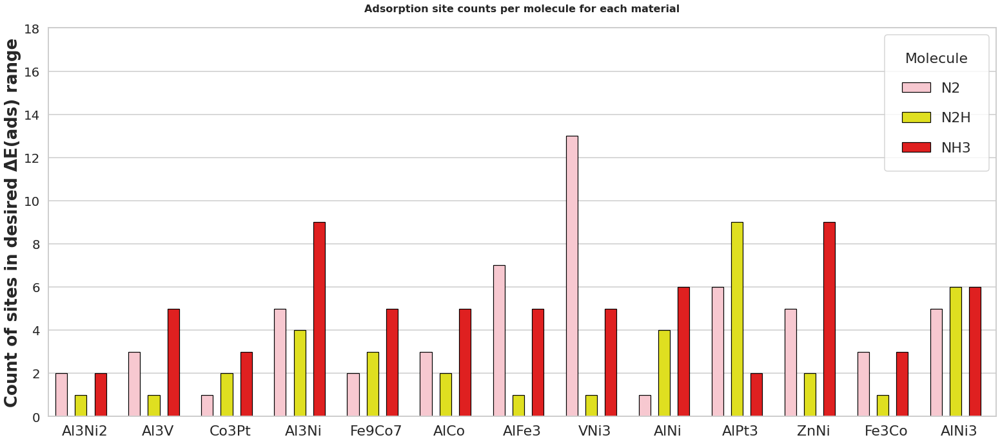

In [117]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator

# Example dataframe
df = df_ranges.copy()

# ---- Clean material names (remove numeric prefix before "_") ----
df["material"] = df["material"].str.split("_").str[1]

# ---- Melt into long format ----
df_long = df.melt(id_vars="material",
                  value_vars=[
                     # "2H_count",
                      "N2_count","N2H_count","NH3_count"],
                  var_name="Molecule", value_name="Count")

# Clean molecule names
df_long["Molecule"] = df_long["Molecule"].str.replace("_count","")

# ---- Custom vibrant color palette ----
custom_palette = [
    #"green",   # 2H
                  "pink",    # N2
                  "yellow",  # N2H
                  "red"]     # NH3

plt.figure(figsize=(22,10))
ax = sns.barplot(
    data=df_long,
    x="material", y="Count", hue="Molecule",
    palette=custom_palette,
    edgecolor="black", linewidth=1.2,
    dodge=True   # <-- keep dodging so groups are separate
)

# ---- Format ----
plt.xticks(rotation=0, fontsize=26)
plt.xlabel("")
plt.ylabel("Count of sites in desired ΔE(ads) range", fontsize=26, fontweight="bold")

plt.title("Adsorption site counts per molecule for each material",
          fontsize=16, fontweight="bold",pad=25)

# Force y-axis ticks to be integers
ax.yaxis.set_major_locator(MaxNLocator(integer=True))
plt.ylim(0, 18)

# ---- Center xticks under group ----
ax.set_xticks(ax.get_xticks())
ax.set_xticklabels(df["material"].unique(), ha="center", fontsize=22,)

# ---- Stick bars in each group (remove gaps) ----
for c in ax.containers:
    for bar in c:
        bar.set_width(0.16)   # adjust bar width so bars touch each other

# ---- Legend formatting ----
plt.legend(
    title="Molecule",
    fontsize=22,
    title_fontsize=22,
    markerscale=1.5,
    borderpad=1.2,
    labelspacing=1.2,
    loc="upper right"
)

plt.tight_layout()
plt.savefig(working_dir + "adsorption_site_counts_noH2.pdf", dpi=600, bbox_inches="tight")
plt.show()


In [81]:
#Now lets see how many of these are end-on adsorption

In [82]:
ADS_RANGE = {
    "2H": (-1.5, 0),
    "N2": (-1.0, 0.0),
    "N2H": (-2.5, -1.5),
    "NH3": (-1.0, 0),
}

def materials_in_all_ranges_with_orientation(
    df1, df2, df3, df4,
    names=["2H", "N2", "N2H", "NH3"],
    energy_col="ads_e", material_col="material",
    orientation_col="orientation"
):
    """
    Find materials that have at least one site within the defined ADS_RANGE
    for each of the four molecules. Also count how many sites per material
    fall in range for each molecule. For N2 and N2H, also count the number
    of 'vertical' and 'tilted_vertical' orientations among the in-range sites.
    """
    dfs = [df1, df2, df3, df4]
    counts = {}

    for df, mol in zip(dfs, names):
        low, high = ADS_RANGE[mol]
        mask = df[energy_col].between(low, high)

        # count sites in range per material
        cnt = (df.loc[mask]
                 .groupby(material_col)
                 .size()
                 .reset_index(name=f"{mol}_count"))

        # extra: count "vertical" and "tilted_vertical" for N2 and N2H
        if mol in ["N2", "N2H"]:
            vert_cnt = (df.loc[mask & (df[orientation_col].str.lower() == "vertical")]
                          .groupby(material_col)
                          .size()
                          .reset_index(name=f"{mol}_vertical_count"))
            tilted_vert_cnt = (df.loc[mask & (df[orientation_col].str.lower() == "tilted_vertical")]
                                 .groupby(material_col)
                                 .size()
                                 .reset_index(name=f"{mol}_tilted_vertical_count"))

            # merge both into main table
            cnt = pd.merge(cnt, vert_cnt, on=material_col, how="left").fillna(0)
            cnt = pd.merge(cnt, tilted_vert_cnt, on=material_col, how="left").fillna(0)

        counts[mol] = cnt

    # merge all counts together
    merged = counts[names[0]]
    for mol in names[1:]:
        merged = pd.merge(merged, counts[mol], on=material_col, how="inner")

    # only keep materials that appear in all four (inner join ensures that)
    return merged


In [83]:
df1 = df_H2_f[df_H2_f['atomic_is_adsorbed']==1]
df2 = df_N2_f[df_N2_f['Mol_is_adsorbed']==1]
df3 = df_N2H_f[df_N2H_f['Mol_is_adsorbed']==1]
df4 = df_NH3_f[df_NH3_f['Mol_is_adsorbed']==1]


names = ["2H", "N2", "N2H", "NH3"]

df_ranges_orientation = materials_in_all_ranges_with_orientation(df1, df2, df3, df4,
                            names=names,
                            energy_col="ads_e", material_col="material")


In [84]:
df_ranges_orientation

,material,2H_count,N2_count,N2_vertical_count,N2_tilted_vertical_count,N2H_count,N2H_vertical_count,N2H_tilted_vertical_count,NH3_count
0,10_Al3Ni2,6,2,1.0,0.0,1,0.0,0.0,2
1,11_Al3V,4,3,0.0,0.0,1,1.0,0.0,5
2,17_Co3Pt,7,1,0.0,1.0,2,0.0,0.0,3
3,1_Al3Ni,3,5,5.0,0.0,4,0.0,0.0,9
4,20_Fe9Co7,3,2,0.0,0.0,3,1.0,1.0,5
5,21_AlCo,3,3,0.0,0.0,2,0.0,0.0,5
6,22_AlFe3,8,7,2.0,0.0,1,0.0,0.0,5
7,26_VNi3,14,13,0.0,0.0,1,1.0,0.0,5
8,31_AlNi,6,1,1.0,0.0,4,0.0,0.0,6
9,32_AlPt3,10,6,2.0,0.0,9,1.0,1.0,2


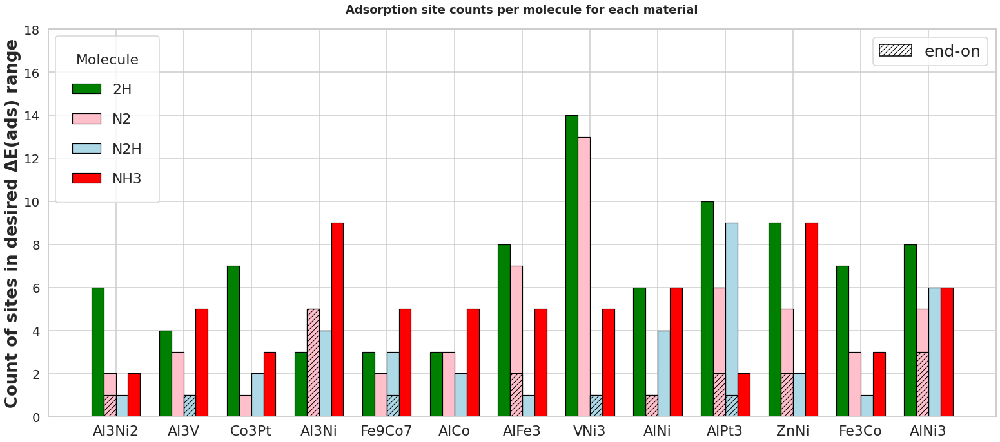

In [115]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator
import matplotlib.patches as mpatches
import numpy as np

# Copy the dataframe
df = df_ranges_orientation.copy()

# ---- Clean material names (remove numeric prefix before "_") ----
df["material"] = df["material"].str.split("_").str[1]

# ---- Melt into long format ----
df_long = df.melt(id_vars="material",
                  value_vars=[
                             "2H_count",
                              "N2_count",
                              "N2H_count",
                              "NH3_count"],
                  var_name="Molecule", value_name="Count")
df_long["Molecule"] = df_long["Molecule"].str.replace("_count","")

# ---- Add vertical subsets for N2 and N2H ----
if "N2_vertical_count" in df.columns:
    df_vert = df[["material","N2_vertical_count","N2H_vertical_count"]].copy()
    df_vert = df_vert.melt(id_vars="material",
                           value_vars=["N2_vertical_count","N2H_vertical_count"],
                           var_name="Molecule", value_name="Vertical")
    df_vert["Molecule"] = df_vert["Molecule"].str.replace("_vertical_count","")
    df_long = df_long.merge(df_vert, on=["material","Molecule"], how="left")
    df_long["Vertical"] = df_long["Vertical"].fillna(0)
else:
    df_long["Vertical"] = 0

# ---- Colors ----
custom_palette = [
    "green",   # 2H
                  "pink",    # N2
                  "#ADD8E6",  # N2H
                  "red"]     # NH3
base_colors = {"2H":"green","N2":"pink","N2H":"#ADD8E6","NH3":"red"}

plt.figure(figsize=(22,10))

# We’ll draw the grouped bars manually so we can overlay the hatched portion
materials = df_long["material"].unique()
molecules = ["2H","N2","N2H","NH3"]
bar_width = 0.18
x = np.arange(len(materials))

# main bars (solid colors)
for i, mol in enumerate(molecules):
    subset = df_long[df_long["Molecule"] == mol]
    plt.bar(x + i*bar_width,
            subset["Count"].values,
            width=bar_width,
            color=base_colors[mol],
            edgecolor="black", linewidth=1.2,
            label=mol)

# hatched overlays for N2 and N2H (same color, hatch only)
for i, mol in enumerate(molecules):
    if mol in ["N2","N2H"]:
        subset = df_long[df_long["Molecule"] == mol]
        verts = subset["Vertical"].values
        # safety: cap overlay at total height
        verts = np.minimum(verts, subset["Count"].values)
        plt.bar(x + i*bar_width,
                verts,
                width=bar_width,
                facecolor="none",          # let base color show through
                edgecolor="black",
                linewidth=1.2,
                hatch="///",               # hatch pattern
                zorder=3)                  # draw on top

# ---- Format ----
plt.xticks(x + 1.5*bar_width, materials, fontsize=22)
plt.ylabel("Count of sites in desired ΔE(ads) range", fontsize=26, fontweight="bold")
plt.title("Adsorption site counts per molecule for each material",
          fontsize=18, fontweight="bold", pad=25)

plt.gca().yaxis.set_major_locator(MaxNLocator(integer=True))
plt.ylim(0, 18)

# ---- Legends ----
# 1) Molecule legend (inside plot, upper left)
leg1 = plt.legend(title="Molecule",
                  fontsize=22, title_fontsize=22,
                  markerscale=1.5, borderpad=1.2, labelspacing=1.2,
                  loc="upper left")   # ✅ inside

# 2) Hatch legend (inside plot, lower right)
hatch_patch = mpatches.Patch(facecolor="white", edgecolor="black", hatch="///", label="end-on")
leg2 = plt.legend(handles=[hatch_patch],
                  fontsize=25,
                  loc="upper right")   # ✅ inside
plt.gca().add_artist(leg1)  # keep both legends

plt.tight_layout()
#plt.savefig(working_dir + "adsorption_site_counts_hatched_legend.pdf", dpi=600, bbox_inches="tight")
plt.show()


In [86]:
df_ranges_orientation

,material,2H_count,N2_count,N2_vertical_count,N2_tilted_vertical_count,N2H_count,N2H_vertical_count,N2H_tilted_vertical_count,NH3_count
0,10_Al3Ni2,6,2,1.0,0.0,1,0.0,0.0,2
1,11_Al3V,4,3,0.0,0.0,1,1.0,0.0,5
2,17_Co3Pt,7,1,0.0,1.0,2,0.0,0.0,3
3,1_Al3Ni,3,5,5.0,0.0,4,0.0,0.0,9
4,20_Fe9Co7,3,2,0.0,0.0,3,1.0,1.0,5
5,21_AlCo,3,3,0.0,0.0,2,0.0,0.0,5
6,22_AlFe3,8,7,2.0,0.0,1,0.0,0.0,5
7,26_VNi3,14,13,0.0,0.0,1,1.0,0.0,5
8,31_AlNi,6,1,1.0,0.0,4,0.0,0.0,6
9,32_AlPt3,10,6,2.0,0.0,9,1.0,1.0,2


In [87]:
#Now lets see how s,p,d orbital looks for those materials with desired ads_e ranges
def build_orbital_dataset(df_ranges_orientation, df_source, prefix="n0_n0_dos_total_"):
    materials = df_ranges_orientation["material"].unique().tolist()
    records = []

    for mat in materials:
        match = df_source[df_source["material"] == mat]
        if match.empty:
            continue
        row = match.iloc[0]
        rec = {
            "material": mat,
            "eps_s": row[f"{prefix}sband_center"],
            "eps_p": row[f"{prefix}pband_center"],
            "eps_d": row[f"{prefix}dband_center"],
            "fill_s": row[f"{prefix}sband_sum"],
            "fill_p": row[f"{prefix}pband_sum"],
            "fill_d": row[f"{prefix}dband_sum"],
        }
        records.append(rec)

    return pd.DataFrame(records)

df_orbital_props = build_orbital_dataset(df_ranges_orientation, df_N2_f, prefix="n0_n0_dos_total_")
df_orbital_props

,material,eps_s,eps_p,eps_d,fill_s,fill_p,fill_d
0,10_Al3Ni2,-3.917709,-1.433215,-1.824746,90.342951,107.824141,657.540764
1,11_Al3V,-4.851702,-2.373912,-0.341281,57.683252,63.344770,215.123639
2,17_Co3Pt,-0.184188,1.780615,-1.337158,64.700706,89.703953,781.908608
3,1_Al3Ni,-0.483516,2.672307,-1.415625,79.470769,125.363203,325.372996
4,20_Fe9Co7,-0.181154,1.898160,-0.919689,120.278487,181.487091,1718.225375
5,21_AlCo,-4.538068,-1.825169,-1.108259,61.446504,78.362736,616.913694
6,22_AlFe3,-0.103225,1.984375,-0.430901,55.375481,87.606072,579.453707
7,26_VNi3,-4.167189,-2.131244,-1.444432,76.779680,89.015499,1300.003261
8,31_AlNi,-3.307510,-1.551257,-1.676513,75.649415,86.132421,675.900743
9,32_AlPt3,-0.824387,1.373083,-2.102797,139.832739,162.098508,1034.263100


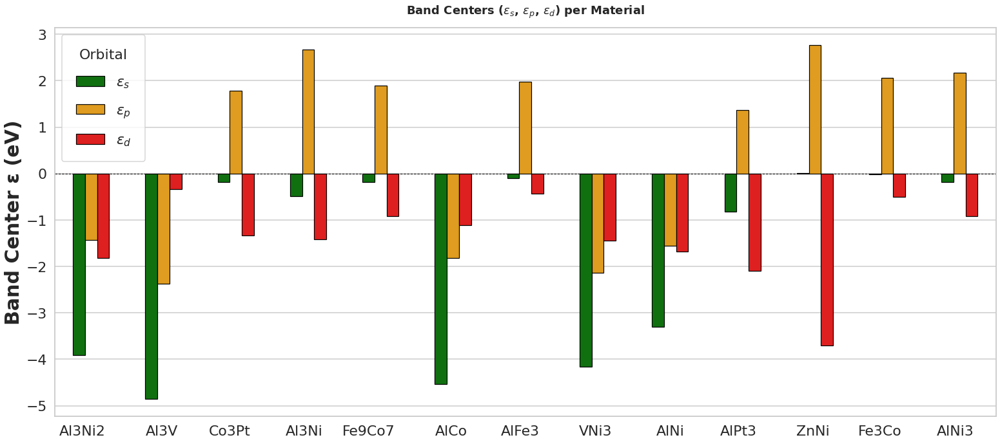

In [88]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

# -- Parameters --
bar_width = 0.5  # 🔧 Adjust this to change bar width

# -- Prepare data --
df_plot = df_orbital_props.copy()
df_plot["material_clean"] = df_plot["material"].str.split("_").str[1]

df_long = df_plot.melt(id_vars="material_clean",
                       value_vars=["eps_s", "eps_p", "eps_d"],
                       var_name="orbital", value_name="ε")

orbital_label_map = {
    "eps_s": r"$\epsilon_{s}$",
    "eps_p": r"$\epsilon_{p}$",
    "eps_d": r"$\epsilon_{d}$"
}
df_long["orbital_label"] = df_long["orbital"].map(orbital_label_map)

# -- Numeric x-axis control --
materials = df_long["material_clean"].unique()
x_positions = np.arange(len(materials))
material_map = dict(zip(materials, x_positions))
df_long["x_pos"] = df_long["material_clean"].map(material_map)

# -- Plot --
plt.figure(figsize=(22, 10))
sns.barplot(data=df_long,
            x="x_pos", y="ε",
            hue="orbital_label",
            palette=["green", "orange", "red"],
            edgecolor="black", linewidth=1.2,
            dodge=True, width=bar_width)

# -- Format --
plt.xticks(x_positions + 0.2, materials, rotation=0, ha="right", fontsize=22)
plt.xlim(-0.5, len(x_positions) - 0.5)
plt.xlabel("",)
plt.ylabel("Band Center ε (eV)", fontsize=30, fontweight='bold')
plt.title("Band Centers ($\epsilon_{s}$, $\epsilon_{p}$, $\epsilon_{d}$) per Material",
          fontsize=18, fontweight="bold", pad=20)
plt.yticks(fontsize=22)
plt.axhline(0, color="black", linestyle="--", linewidth=1)

plt.legend(title="Orbital", fontsize=22, title_fontsize=22,
           labelspacing=1.0, markerscale=1.5, borderpad=1.0)

plt.tight_layout()
#plt.savefig(working_dir + "orbital_band_centers.pdf", dpi=600, bbox_inches="tight")
plt.show()


In [89]:
def build_adsorption_stats(df_ranges_orientation,
                           df_H2_f, df_N2_f, df_N2H_f, df_NH3_f):
    # Step 1: get material list (as-is)
    materials = df_ranges_orientation["material"].unique().tolist()


    result_rows = []

    for mat in materials:
        row = {"material": mat}

        for label, df in zip(["2H", "N2", "N2H", "NH3"],
                             [df_H2_f, df_N2_f, df_N2H_f, df_NH3_f]):
            subset = df[df["material"] == mat]
            if subset.empty:
                row[f"{label}_ads_e_median"] = None
                row[f"{label}_ads_e_min"] = None
            else:
                row[f"{label}_ads_e_median"] = subset["ads_e"].median()
                row[f"{label}_ads_e_min"] = subset["ads_e"].min()
        result_rows.append(row)

    return pd.DataFrame(result_rows)

# Step 2: filter input DFs
df_H2_4stats = df_H2_f[df_H2_f["atomic_is_adsorbed"] == 1]
df_N2_4stats = df_N2_f[df_N2_f["Mol_is_adsorbed"] == 1]
df_N2H_4stats = df_N2H_f[df_N2H_f["Mol_is_adsorbed"] == 1]
df_NH3_4stats = df_NH3_f[df_NH3_f["Mol_is_adsorbed"] == 1]

df_ads_e_stats = build_adsorption_stats(df_ranges_orientation,
                                        df_H2_4stats, df_N2_4stats, df_N2H_4stats, df_NH3_4stats)
df_ads_e_stats

,material,2H_ads_e_median,2H_ads_e_min,N2_ads_e_median,N2_ads_e_min,N2H_ads_e_median,N2H_ads_e_min,NH3_ads_e_median,NH3_ads_e_min
0,10_Al3Ni2,-1.005002,-1.389150,-0.226563,-0.249384,-2.809603,-3.064864,-1.053986,-1.070025
1,11_Al3V,-0.787513,-1.264197,-0.727457,-0.854152,-3.680162,-4.183894,-1.096031,-1.649519
2,17_Co3Pt,-0.597038,-0.765706,0.245756,-0.182246,-1.856727,-2.046017,-0.313174,-0.668440
3,1_Al3Ni,-0.928952,-0.932807,-0.245930,-0.554091,-2.288420,-2.550215,-0.803978,-0.840947
4,20_Fe9Co7,-0.523789,-0.536881,-0.706315,-0.710338,-2.119000,-2.231638,-0.729576,-0.858522
5,21_AlCo,-1.600124,-1.809574,-0.330862,-1.043317,-2.764838,-3.219871,-0.965687,-1.005436
6,22_AlFe3,-0.969480,-1.445509,-0.440585,-0.636631,-2.797580,-2.799305,-0.679070,-0.721094
7,26_VNi3,-1.205633,-1.408024,-0.207841,-0.455186,-2.842269,-3.026210,-1.211307,-1.220087
8,31_AlNi,-0.454125,-0.636752,0.629910,-0.096705,-1.944862,-2.273359,-0.801173,-0.808357
9,32_AlPt3,-1.307308,-1.606690,-0.493441,-0.547529,-2.366011,-2.641729,-1.035138,-1.259622


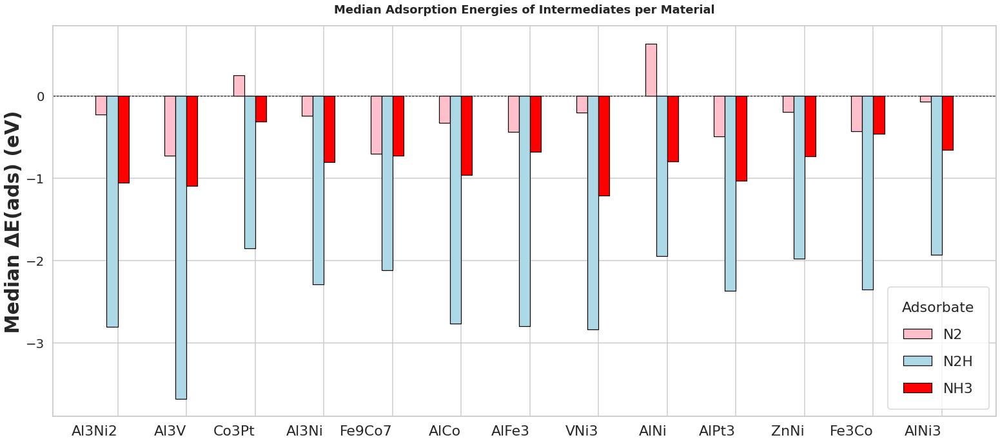

In [119]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# -- Settings --
custom_palette = [
    #"green", 
    "pink", "#ADD8E6", "red"]
base_colors = {
    #"2H":"green", 
    "N2":"pink", "N2H":"#ADD8E6", "NH3":"red"}
molecules = [#"2H", 
             "N2", "N2H", "NH3"]

ads_e_median_mean = 'median'
# -- Create long-format DataFrame for plotting --
df_plot = df_ads_e_stats.copy()
df_plot["material_clean"] = df_plot["material"].str.split("_").str[1]  # remove numeric prefix

df_long = pd.melt(df_plot,
                  id_vars="material_clean",
                  value_vars=[f"{mol}_ads_e_{ads_e_median_mean}" for mol in molecules],
                  var_name="Molecule", value_name=f"ads_e_{ads_e_median_mean}")

# Clean molecule column (e.g., "2H_ads_e_median" → "2H")
df_long["Molecule"] = df_long["Molecule"].str.replace(f"_ads_e_{ads_e_median_mean}", "")

# -- Bar plot settings --
materials = df_long["material_clean"].unique()
x = np.arange(len(materials))
bar_width = 0.16

plt.figure(figsize=(22, 10))

for i, mol in enumerate(molecules):
    subset = df_long[df_long["Molecule"] == mol]
    plt.bar(x + i * bar_width,
            subset[f"ads_e_{ads_e_median_mean}"].values,
            width=bar_width,
            color=base_colors[mol],
            edgecolor="black", linewidth=1.2,
            label=mol)

# -- Formatting --
plt.xticks(x + 1.5 * bar_width, materials, rotation=0, ha="right", fontsize=22)
plt.ylabel(f"{ads_e_median_mean.capitalize()} ΔE(ads) (eV)", fontsize=30,fontweight='bold')
plt.title(f"{ads_e_median_mean.capitalize()} Adsorption Energies of Intermediates per Material",
          fontsize=18, fontweight="bold", pad=20)
plt.legend(title="Adsorbate", fontsize=22, title_fontsize=22,labelspacing=1.0,markerscale=1.5,borderpad=1.0)
plt.axhline(0, color="black", linestyle="--", linewidth=1)

plt.tight_layout()
plt.savefig(working_dir + f"ads_e_{ads_e_median_mean}_noH2.pdf", dpi=600, bbox_inches="tight")
plt.show()


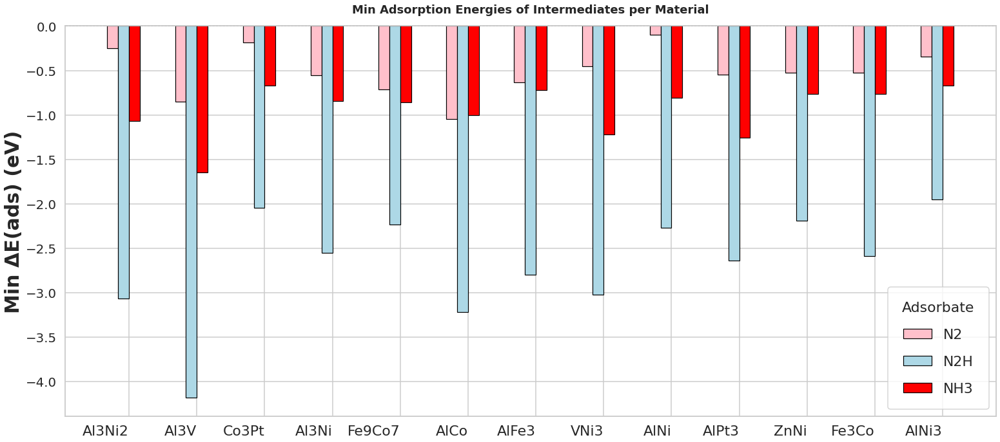

In [121]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# -- Settings --
custom_palette = [
    #"green", 
    "pink", "#ADD8E6", "red"]
base_colors = {
    #"2H":"green", 
    "N2":"pink", "N2H":"#ADD8E6", "NH3":"red"}
molecules = [#"2H", 
             "N2", "N2H", "NH3"]

ads_e_median_mean = 'min'
# -- Create long-format DataFrame for plotting --
df_plot = df_ads_e_stats.copy()
df_plot["material_clean"] = df_plot["material"].str.split("_").str[1]  # remove numeric prefix

df_long = pd.melt(df_plot,
                  id_vars="material_clean",
                  value_vars=[f"{mol}_ads_e_{ads_e_median_mean}" for mol in molecules],
                  var_name="Molecule", value_name=f"ads_e_{ads_e_median_mean}")

# Clean molecule column (e.g., "2H_ads_e_median" → "2H")
df_long["Molecule"] = df_long["Molecule"].str.replace(f"_ads_e_{ads_e_median_mean}", "")

# -- Bar plot settings --
materials = df_long["material_clean"].unique()
x = np.arange(len(materials))
bar_width = 0.16

plt.figure(figsize=(22, 10))

for i, mol in enumerate(molecules):
    subset = df_long[df_long["Molecule"] == mol]
    plt.bar(x + i * bar_width,
            subset[f"ads_e_{ads_e_median_mean}"].values,
            width=bar_width,
            color=base_colors[mol],
            edgecolor="black", linewidth=1.2,
            label=mol)

# -- Formatting --
plt.xticks(x + 1.5 * bar_width, materials, rotation=0, ha="right", fontsize=22)
plt.ylabel(f"{ads_e_median_mean.capitalize()} ΔE(ads) (eV)", fontsize=30,fontweight='bold')
plt.title(f"{ads_e_median_mean.capitalize()} Adsorption Energies of Intermediates per Material",
          fontsize=18, fontweight="bold", pad=20)
plt.legend(title="Adsorbate", fontsize=22, title_fontsize=22,labelspacing=1.0,markerscale=1.5,borderpad=1.0)
plt.axhline(0, color="black", linestyle="--", linewidth=1)

plt.tight_layout()
plt.savefig(working_dir + f"ads_e_{ads_e_median_mean}_noH2.pdf", dpi=600, bbox_inches="tight")
plt.show()


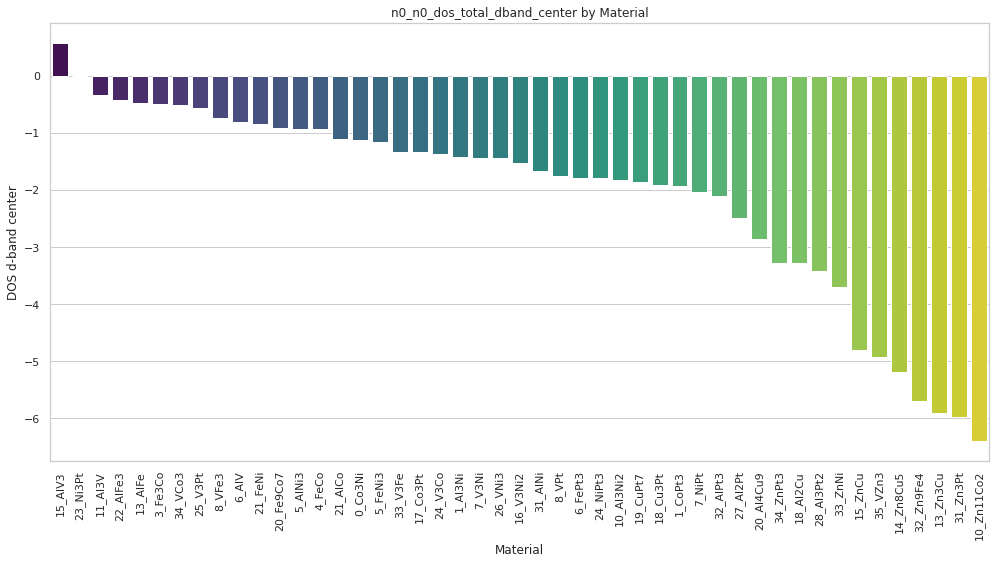

In [92]:
import seaborn as sns
import matplotlib.pyplot as plt
df = df_N2_f
# Optional: Set style
sns.set(style="whitegrid")

# Prepare the data (assuming each material has one value)
subset = df[['material', 'n0_n0_dos_total_dband_center']].drop_duplicates()
subset = subset.sort_values(by='n0_n0_dos_total_dband_center', ascending=False)

# Plot
plt.figure(figsize=(14, 8))
ax = sns.barplot(
    data=subset,
    x='material',
    y='n0_n0_dos_total_dband_center',
    palette='viridis'
)
ax.set_xticklabels(ax.get_xticklabels(), rotation=90)
plt.xlabel('Material')
plt.ylabel('DOS d-band center')
plt.title('n0_n0_dos_total_dband_center by Material')
plt.tight_layout()
plt.show()


In [93]:
def plot_scaling_customized_hue(
    df_x, df_y,
    x_name="N2", y_name="N2H",
    orbital='d',
    center_sum='center',
    selected_total='selected',
    n=0,
    energy_col="ads_e",
    material_col="material", site_col="ad_site_number",
    filter_adsorbed_x=True, ads_flag_col_x="Mol_is_adsorbed", ads_value_x=1,
    filter_adsorbed_y=True, ads_flag_col_y="Mol_is_adsorbed", ads_value_y=1,
    filter_fn_x=None, filter_fn_y=None,
    clean_names_x=True, clean_names_y=True,
    figsize=(10, 8), palette="Spectral",
    dpi=600, save_path=None
):
    # Build hue column name
    hue_col = f"n0_n{n}_dos_{selected_total}_{orbital}band_{center_sum}"

    # Build colorbar label
    prefix = "Local" if selected_total == "selected" else "Total"
    suffix = "center" if center_sum == "center" else "filling"
    colorbar_label = f"{prefix} {orbital}-band {suffix} (scaled)"

    gX, gY = df_x.copy(), df_y.copy()
    if filter_adsorbed_x and ads_flag_col_x in gX.columns:
        gX = gX[gX[ads_flag_col_x] == ads_value_x]
    if filter_adsorbed_y and ads_flag_col_y in gY.columns:
        gY = gY[gY[ads_flag_col_y] == ads_value_y]
    if callable(filter_fn_x): gX = filter_fn_x(gX)
    if callable(filter_fn_y): gY = filter_fn_y(gY)
    if clean_names_x and material_col in gX.columns:
        gX[material_col] = gX[material_col].astype(str).apply(_strip_prefix)
    if clean_names_y and material_col in gY.columns:
        gY[material_col] = gY[material_col].astype(str).apply(_strip_prefix)

    keys = [material_col, site_col]
    merged_cols = [energy_col, hue_col]
    scaling_df = pd.merge(
        gY[keys + merged_cols],
        gX[keys + [energy_col]],
        on=keys, how="inner",
        suffixes=(f"_{y_name}", f"_{x_name}")
    ).dropna()

    if scaling_df.empty:
        raise ValueError("No overlapping rows after merge with current filters.")

    # scale hue
    hue_scaled = (scaling_df[hue_col] - scaling_df[hue_col].min()) / (scaling_df[hue_col].max() - scaling_df[hue_col].min())
    x = scaling_df[f"{energy_col}_{x_name}"].values
    y = scaling_df[f"{energy_col}_{y_name}"].values

    slope, intercept = np.polyfit(x, y, 1)
    yhat = slope * x + intercept
    r2, mae = r2_score(y, yhat), mean_absolute_error(y, yhat)

    # Plot
    sns.set(style="whitegrid", context="talk", font_scale=1.2)
    plt.figure(figsize=figsize)

    sc = plt.scatter(x, y, c=hue_scaled, cmap=palette, s=180, edgecolor="black", linewidth=0.6, alpha=0.9)
    xs = np.linspace(np.nanmin(x), np.nanmax(x), 200)
    line, = plt.plot(xs, slope * xs + intercept, color="crimson", lw=3)

    plt.xlabel(f"{x_name} ΔE(ads) (eV)", fontsize=25, fontweight="bold")
    plt.ylabel(f"{y_name} ΔE(ads) (eV)", fontsize=25, fontweight="bold")
    plt.title(f"Scaling: ΔE({y_name}) vs ΔE({x_name})\nHue: {hue_col} (scaled 0–1)",
              fontsize=18, fontweight="bold", pad=25)

    cbar = plt.colorbar(sc, pad=0.03)
    cbar.set_label(colorbar_label, fontsize=18, 
                   #fontweight="bold",
                  )
    cbar.set_ticks([0, 0.5, 1])

    plt.legend([line], [f"y = {slope:.2f}x + {intercept:.2f}\nR²={r2:.3f}, MAE={mae:.3f}"], loc="best", frameon=True)
    plt.grid(ls="--", alpha=0.35)
    plt.tight_layout()

    if save_path:
        pass
        #plt.savefig(save_path, dpi=dpi, bbox_inches="tight")

    plt.show()

    return scaling_df, slope, intercept, r2, mae


/home/parastoo/anaconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:71: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.


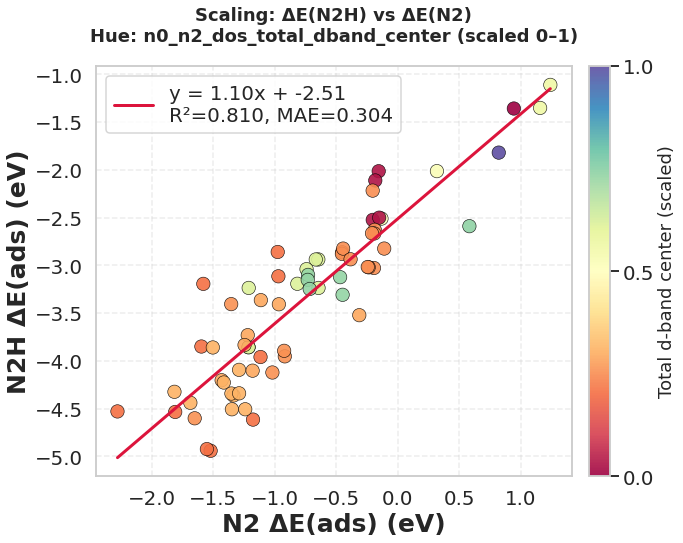

(   material ad_site_number  ads_e_N2H  n0_n2_dos_total_dband_center  ads_e_N2
 0     CoPt3      6_ad_site  -1.356408                     -1.928946  0.941930
 1     Fe3Co      3_ad_site  -2.588386                     -0.501936  0.580736
 2      FeCo      4_ad_site  -2.508945                     -0.939379 -0.133562
 3     CuPt7      7_ad_site  -2.012685                     -1.864820 -0.156127
 4     CuPt7      9_ad_site  -2.109680                     -1.864820 -0.183757
 5     CuPt7      8_ad_site  -2.522392                     -1.864820 -0.204494
 6     CuPt7      6_ad_site  -2.499294                     -1.864820 -0.152241
 7    Fe9Co7      4_ad_site  -2.011761                     -0.919689  0.316910
 8      FeNi      8_ad_site  -1.109021                     -0.844963  1.238402
 9      FeNi     10_ad_site  -1.350199                     -0.844963  1.155409
 10    Ni3Pt      5_ad_site  -1.818144                      0.000000  0.819344
 11     V3Ni      3_ad_site  -3.404434              

In [94]:
orbital_ = 'd'
center_sum_ = 'center'
selected_total_ = 'total'
n_ = 2
df_1,df1_name = df_N2_f,'N2'
df_2,df2_name = df_N2H_f,'N2H'

#df_1 = df_1[df_1['n0_n0_dos_total_dband_center']<= 0]
#df_2 = df_2[df_2['n0_n0_dos_total_dband_center']<= 0]

#df_1 = df_1[~df_1["material"].str.contains("Al", na=False)]
#df_1 = df_1[~df_1["material"].str.contains("Zn", na=False)]

#df_2 = df_2[~df_2["material"].str.contains("Al", na=False)]
#df_2 = df_2[~df_2["material"].str.contains("Zn", na=False)]

df_1 = df_1[~df_1["material"].str.contains("Al|Zn", na=False)]
df_2 = df_2[~df_2["material"].str.contains("Al|Zn", na=False)]
#~
plot_scaling_customized_hue(
    df_1, df_2,
    x_name=df1_name, y_name=df2_name,
    filter_adsorbed_x=True, ads_flag_col_x="Mol_is_adsorbed", ads_value_x=1,
    filter_adsorbed_y=True, ads_flag_col_y="Mol_is_adsorbed", ads_value_y=1,
    orbital=orbital_,
    center_sum=center_sum_,
    selected_total=selected_total_,
    n=n_,
    save_path=f"./{df1_name}_{df2_name}_n{n_}_dos_{selected_total_}_{orbital_}band_{center_sum_}"
)

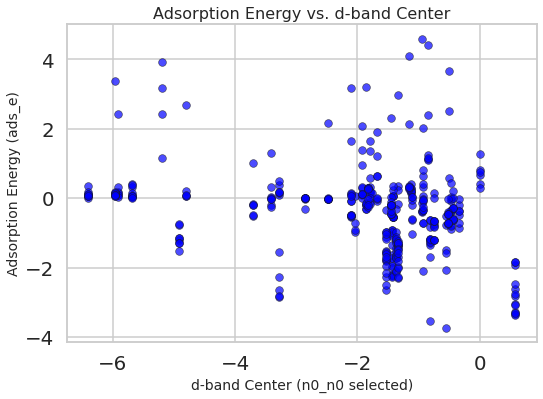

In [95]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
df = df_N2_f
# Assuming your DataFrame is called df
plt.figure(figsize=(8, 6))
sns.scatterplot(
    data=df,
    x="n0_n0_dos_total_dband_center",
    y="ads_e",
    s=60, color='blue', edgecolor='k', alpha=0.7
)

plt.xlabel("d-band Center (n0_n0 selected)", fontsize=14)
plt.ylabel("Adsorption Energy (ads_e)", fontsize=14)
plt.title("Adsorption Energy vs. d-band Center", fontsize=16)
plt.grid(True)
plt.tight_layout()
plt.show()


In [96]:
df = df_N2
df[df["n0_n0_dos_total_dband_center"] > 0]

material ad_site_number crystal_struct sym_group mol   mol_elecneg   pre_N-N  pre_H-H  pre_N-H1  pre_N-H2  pre_N-H3                                             mol_cent_coord                                                                                                               mol_input_all_coords n0_atom_type  n0_atomic_number  n0_atomic_mass  n0_elect_affinity                                                                                                                                                                                           n0_ion_e  n0_atomic_radius  n0_cov_rad  n0_atom_density                                             n0_coordinates                                                      n0_distance_vector  n0_distance  n0_charge  n0_electroneg  n0_n0_dos_selected_indices  n0_n0_dos_selected_sband_center  n0_n0_dos_selected_sband_sum  n0_n0_dos_total_sband_center  n0_n0_dos_total_sband_sum  n0_n0_dos_selected_pband_center  n0_n0_dos_selected_pband_sum  n0_n0_dos_total_pband_center  n0_n0_dos_total_pband_sum  n0_n0_dos_selected_dband_center  n0_n0_dos_selected_dband_sum  n0_n0_dos_total_dband_center  n0_n0_dos_total_dband_sum  n0_n1_dos_selected_indices  n0_n1_dos_selected_sband_center  n0_n1_dos_selected_sband_sum  n0_n1_dos_total_sband_center  n0_n1_dos_total_sband_sum  n0_n1_dos_selected_pband_center  n0_n1_dos_selected_pband_sum  n0_n1_dos_total_pband_center  n0_n1_dos_total_pband_sum  n0_n1_dos_selected_dband_center  n0_n1_dos_selected_dband_sum  n0_n1_dos_total_dband_center  n0_n1_dos_total_dband_sum  n0_n2_dos_selected_indices  n0_n2_dos_selected_sband_center  n0_n2_dos_selected_sband_sum  n0_n2_dos_total_sband_center  n0_n2_dos_total_sband_sum  n0_n2_dos_selected_pband_center  n0_n2_dos_selected_pband_sum  n0_n2_dos_total_pband_center  n0_n2_dos_total_pband_sum  n0_n2_dos_selected_dband_center  n0_n2_dos_selected_dband_sum  n0_n2_dos_total_dband_center  n0_n2_dos_total_dband_sum  n0_n3_dos_selected_indices  \
325  15_AlV3     14_ad_site          Cubic     Pm-3n  N2  [3.04, 3.04]  1.120923      NaN       NaN       NaN       NaN     [22.364026814354002, 51.353649947876, 11.532166895185]     [('N', (22.197352118566002, 50.818545534364, 11.532166895185)), ('N', (22.530701510142002, 51.888754361388, 11.532166895185))]            V                23       50.941500           0.527662  [6.746187, 14.634, 29.3111, 46.709, 65.28165, 128.125, 150.72, 173.55, 206.0, 230.5, 254.8, 308.5, 336.274, 896.0, 977.2, 1062.9, 1165.2, 1258.9, 1354.2, 1486.7, 1569.656, 6851.3109, 7246.1226]              1.35        1.53           6110.0        (22.735886854968005, 51.5130153924, 9.629747407375)          (0.3718600406140027, 0.15936544452399914, -1.9024194878100005)     1.944962    -0.1803           1.63                       145.0                        -2.435457                      0.760043                     -3.059633                 108.811827                        -0.189702                      1.289523                     -0.531296                 184.172305                         0.518640                     11.529709                      0.579472                1377.731523                       145.0                        -2.440712                      1.518166                     -3.059633                 108.811827                        -0.191269                      2.587456                     -0.531296                 184.172305                         0.518884                     23.018749                      0.579472                1377.731523                       145.0                        -2.692596                      2.129748                     -3.059633                 108.811827                        -0.088763                      3.461235                     -0.531296                 184.172305                         0.518884                     23.018749                      0.579472                1377.731523                       145.0   
326  15_AlV3      3_ad_site          C

In [97]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

def plot_adsorption_distribution_colored(df, 
                                         energy_col="adsorption_energy", 
                                         hue_col="n0_n0_dos_total_dband_center",
                                        mol='mol'):
    """
    Scatter plot:
    - X: adsorption energy
    - Y: random jitter
    - Color: value of hue_col (e.g. d-band center)
    """
    x = df[energy_col]
    y = np.random.normal(0, 0.1, size=len(df))  # vertical jitter
    hue = df[hue_col]

    plt.figure(figsize=(8, 6))
    scatter = plt.scatter(
        x, y,
        c=hue,
        cmap='coolwarm',
        edgecolor='k',
        s=40,
        alpha=0.9
    )
    plt.xlabel("Adsorption Energy", fontsize=12)
    plt.yticks([])
    plt.title(f"Adsorption Energy Distribution Colored by {hue_col}", fontsize=13)
    cbar = plt.colorbar(scatter)
    cbar.set_label(hue_col, fontsize=11)
    plt.tight_layout()
    return plt.gca()


/home/parastoo/anaconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:31: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.


<AxesSubplot:title={'center':'Adsorption Energy Distribution Colored by n0_n3_dos_selected_pband_center'}, xlabel='Adsorption Energy'>

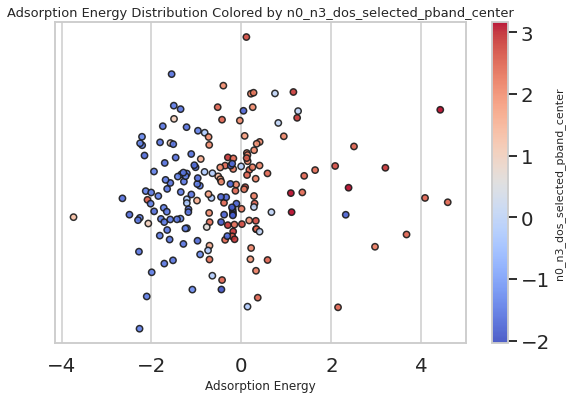

In [98]:
plot_adsorption_distribution_colored(df_1, energy_col="ads_e", hue_col="n0_n3_dos_selected_pband_center")

In [99]:
import matplotlib.pyplot as plt
import numpy as np
import matplotlib.cm as cm
import matplotlib.colors as colors
import pandas as pd

def plot_featurewise_beeswarm_ads_e(df, n, energy_col="ads_e", mol="mol", colormap='inferno',xlim_=(-5,5),
                                   filename_suffix = ''):
    """
    One big beeswarm plot:
    - Y = features
    - X = adsorption energy
    - Color = feature value (min-max scaled per feature)
    - Points = rows in the dataset
    """
    def subscript(text):
        return f"$_{{{text}}}$"

    prop_map = {
        "atomic_number": "Z",
        "elect_affinity": "EA",
        "ion_e0": "IE",
        "charge": "q",
        "electroneg": "χ",
        "atom_density": "ρ",
        "cov_rad": "rc",
        "atomic_radius": "r"
    }

    orbitals = ["s", "p", "d"]
    records = []

    for idx, row in df.iterrows():
        d0 = row["n0_distance"]
        dn = row.get(f"n{n}_distance", np.nan)
        w0 = 1 / d0 if d0 > 0 else 0
        wn = 1 / dn if dn > 0 else 0
        denom = w0 + wn if (w0 + wn) > 0 else 1

        for prop, symbol in prop_map.items():
            col0 = f"n0_{prop}"
            coln = f"n{n}_{prop}"
            if col0 in row and coln in row:
                WA = (row[col0] * w0 + row[coln] * wn) / denom
                records.append({
                    "feature": f"WA{subscript(symbol)}",
                    "value": WA,
                    "energy": row[energy_col]
                })

        for orb in orbitals:
            sum_local = f"n0_n{n}_dos_selected_{orb}band_sum"
            cen_local = f"n0_n{n}_dos_selected_{orb}band_center"
            if sum_local in row:
                records.append({
                    "feature": f"f{subscript(orb)},local",
                    "value": row[sum_local],
                    "energy": row[energy_col]
                })
            if cen_local in row:
                records.append({
                    "feature": f"ε{subscript(orb)},local",
                    "value": row[cen_local],
                    "energy": row[energy_col]
                })

            sum_total = f"n0_n0_dos_total_{orb}band_sum"
            cen_total = f"n0_n0_dos_total_{orb}band_center"
            if sum_total in row:
                records.append({
                    "feature": f"f{subscript(orb)},total",
                    "value": row[sum_total],
                    "energy": row[energy_col]
                })
            if cen_total in row:
                records.append({
                    "feature": f"ε{subscript(orb)},total",
                    "value": row[cen_total],
                    "energy": row[energy_col]
                })

    df_long = pd.DataFrame(records)

    # 🔄 Min-Max scaling per feature
    df_long["scaled_value"] = df_long.groupby("feature")["value"].transform(
        lambda x: (x - x.min()) / (x.max() - x.min() + 1e-6)
    )

    # 🧭 Map features to Y rows
    feature_order = sorted(df_long["feature"].unique())[::-1]
    feature_to_y = {f: i for i, f in enumerate(feature_order)}
    df_long["y"] = df_long["feature"].map(feature_to_y)

    # 🎯 Jitter vertically
    rng = np.random.default_rng(42)
    df_long["y_jitter"] = df_long["y"] + rng.normal(0, 0.15, size=len(df_long))

    # 🎨 Plot
    fig, ax = plt.subplots(figsize=(15, max(15, len(feature_order) * 0.4)))
    cmap = cm.get_cmap(colormap)
    norm = colors.Normalize(vmin=0, vmax=1)

    sc = ax.scatter(
        df_long["energy"],
        df_long["y_jitter"],
        c=df_long["scaled_value"],
        cmap=cmap,
        norm=norm,
        s=50,
        alpha=0.9,
        edgecolor="black",
        linewidth=0.4
    )

    ax.set_xlim(xlim_)
    ax.set_yticks(list(feature_to_y.values()))
    ax.set_yticklabels(list(feature_to_y.keys()), fontsize=30)
    ax.tick_params(axis='x', labelsize=20) 
    ax.set_xlabel(f"{mol} ΔE(ads) (eV)", fontsize=25, fontweight='bold')
    ax.set_title(f"Feature-wise Adsorption Distribution (n = {n}, {mol})", fontsize=13,pad=25)

    cbar = plt.colorbar(sc, ax=ax,)
    cbar.set_label("Feature Value (scaled)", fontsize=28,labelpad=15,fontweight='bold')
    cbar.ax.tick_params(labelsize=19) 

    plt.grid(axis='y', linestyle=':', alpha=0.3)
    plt.tight_layout()
    #plt.savefig(f"scaling_band/beeswarm_features_beforeML_{mol}{filename_suffix}.pdf", dpi=600, bbox_inches="tight")
    return ax


/home/parastoo/anaconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:122: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.


<AxesSubplot:title={'center':'Feature-wise Adsorption Distribution (n = 3, 2H)'}, xlabel='2H ΔE(ads) (eV)'>

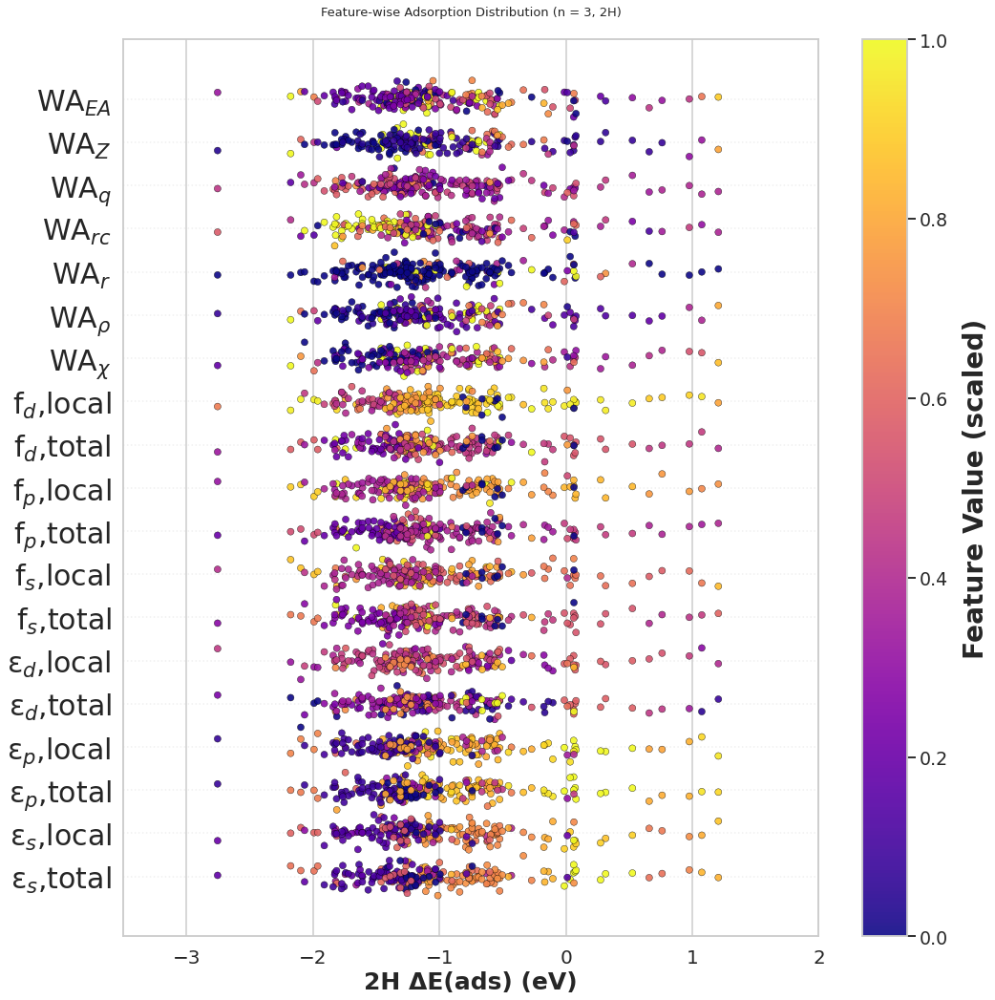

In [100]:
my_df = df_H2[df_H2['atomic_is_adsorbed']==1]
df_1,df1_name = my_df[~my_df['material'].str.contains('Al|Zn', case=False, na=False)],'2H'
n=3
x_lim = (-3.5,2)
plot_featurewise_beeswarm_ads_e(df_1, n, mol=df1_name,colormap='plasma',xlim_=x_lim)

/home/parastoo/anaconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:122: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.


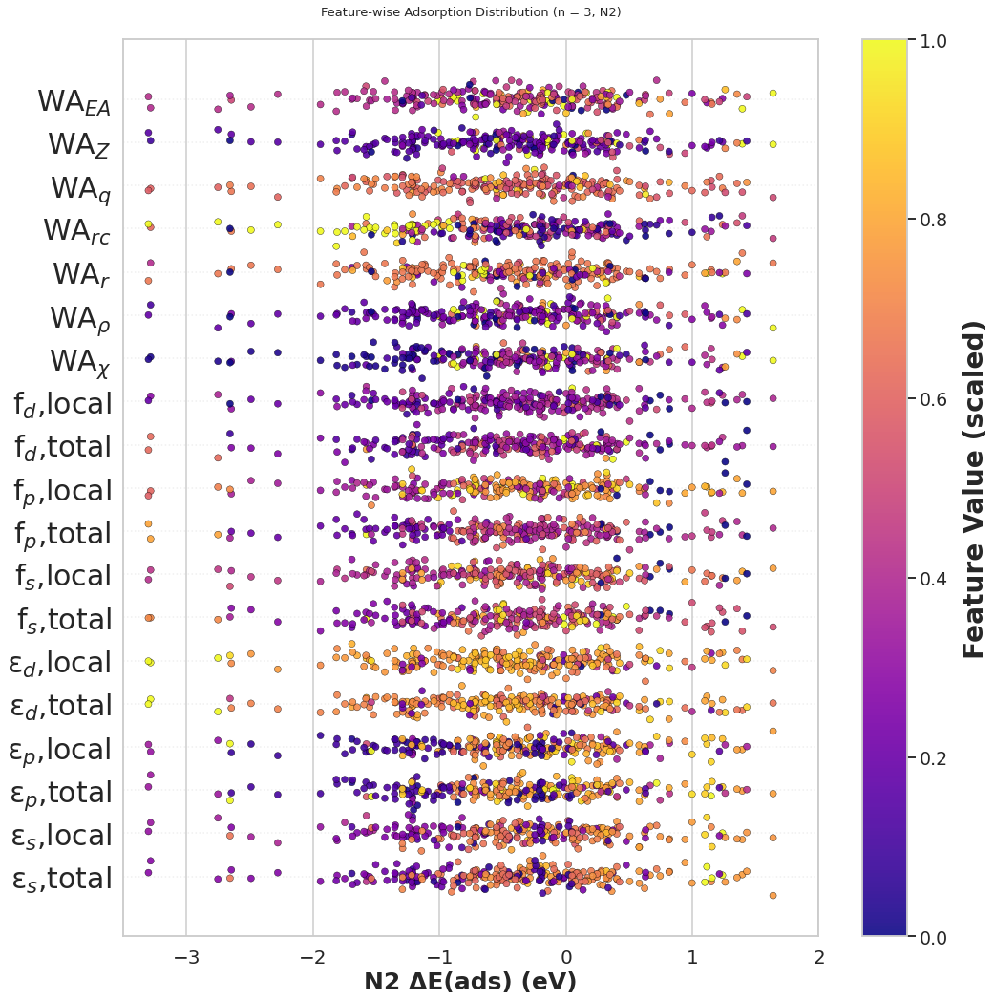

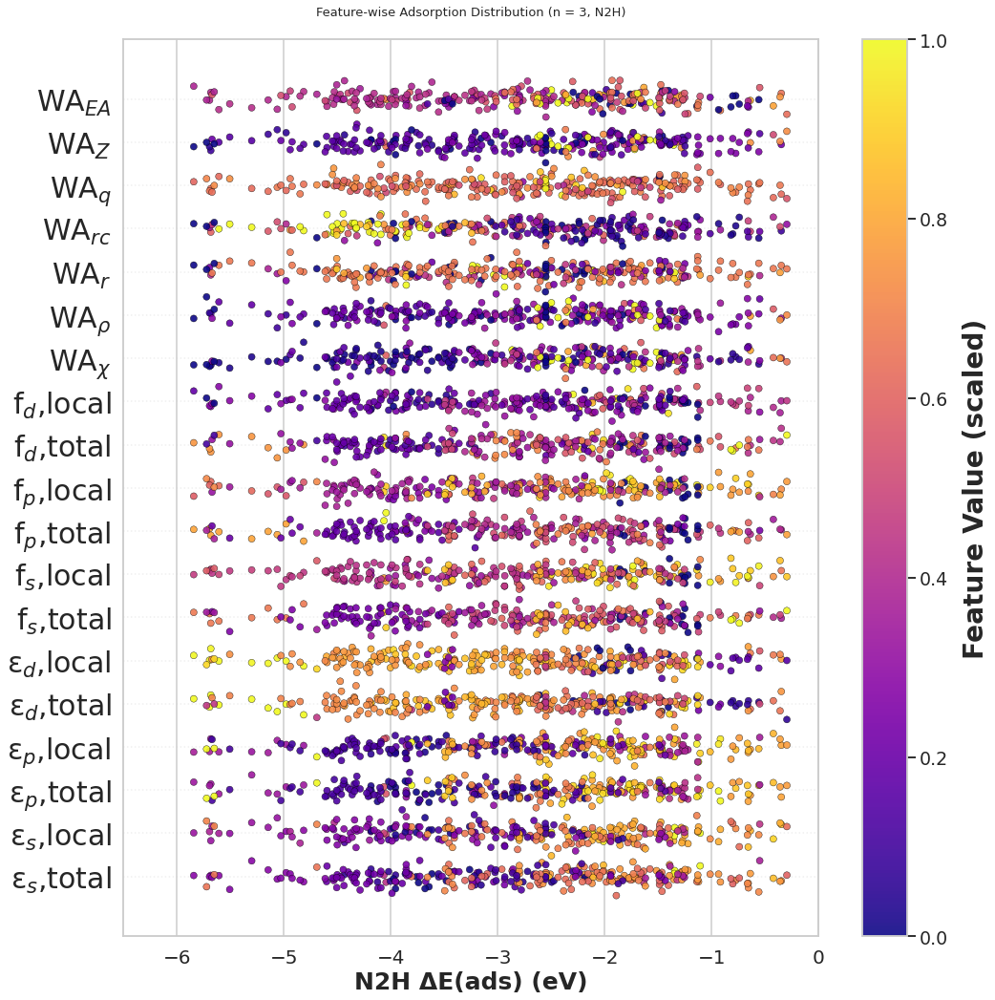

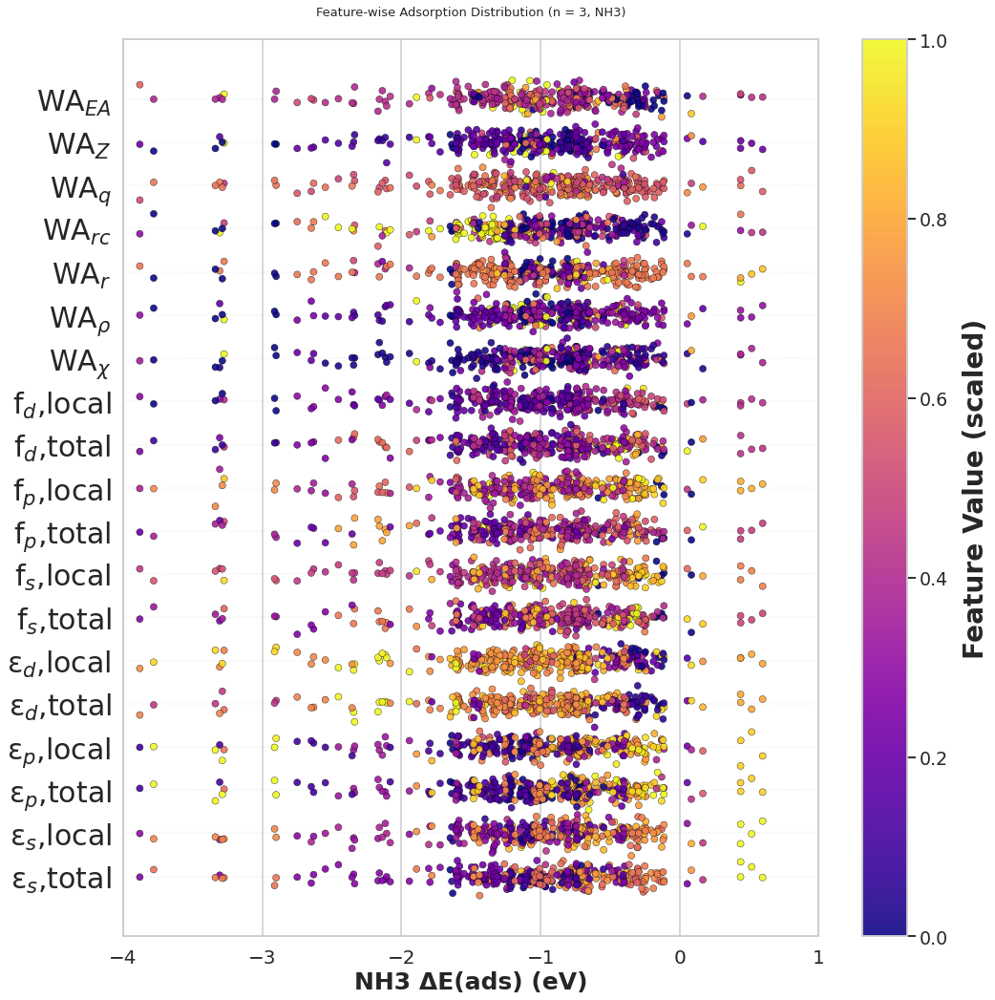

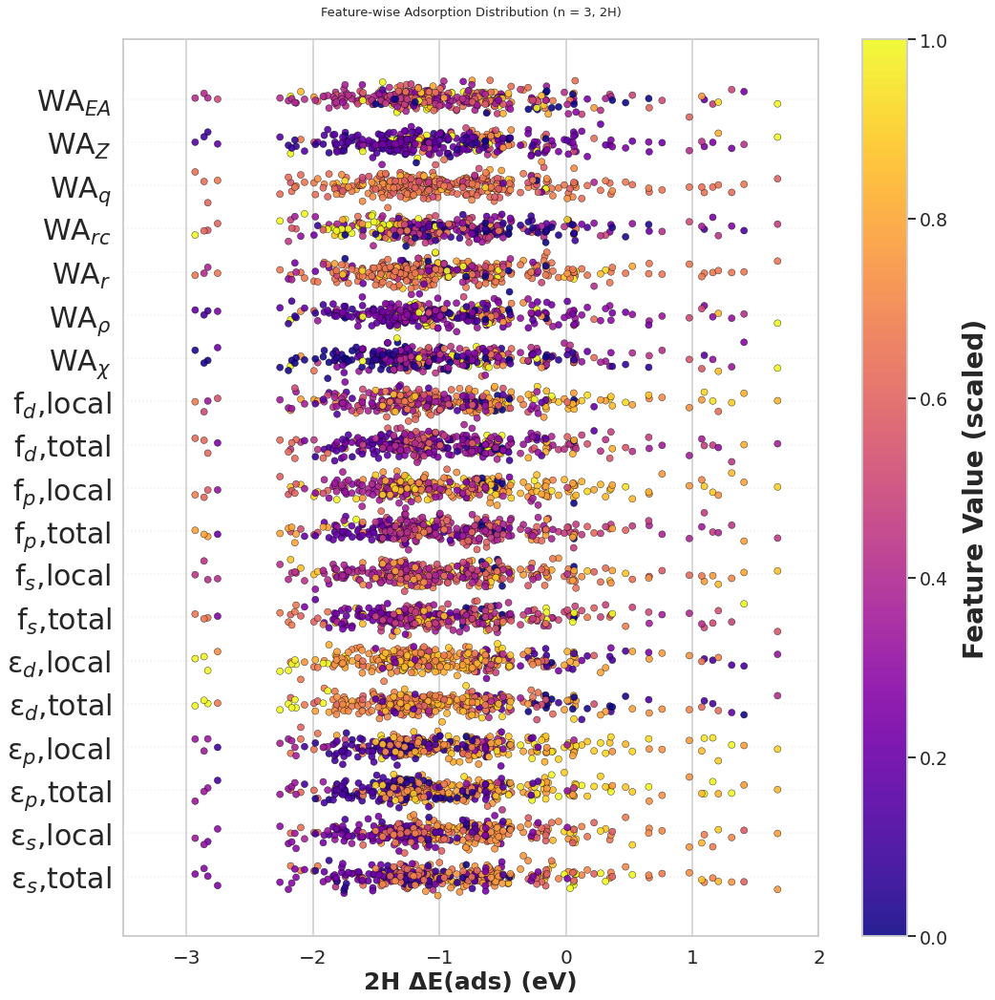

In [101]:
df_info_beeswarms = [(df_N2[df_N2['Mol_is_adsorbed']==1],'N2',3,(-3.5,2)),
                     (df_N2H[df_N2H['Mol_is_adsorbed']==1],'N2H',3,(-6.5,0)),
                     (df_NH3[df_NH3['Mol_is_adsorbed']==1],'NH3',3,(-4,1)),
                     (df_H2[df_H2['atomic_is_adsorbed']==1],'2H',3,(-3.5,2)),
                    ]
for i in df_info_beeswarms:
    df, mol_name, n, xlimit  = i
    plot_featurewise_beeswarm_ads_e(df, n, mol=mol_name,colormap='plasma',xlim_=xlimit)
                     

/home/parastoo/anaconda3/envs/py37/lib/python3.7/site-packages/ipykernel_launcher.py:122: MatplotlibDeprecationWarning: Auto-removal of grids by pcolor() and pcolormesh() is deprecated since 3.5 and will be removed two minor releases later; please call grid(False) first.


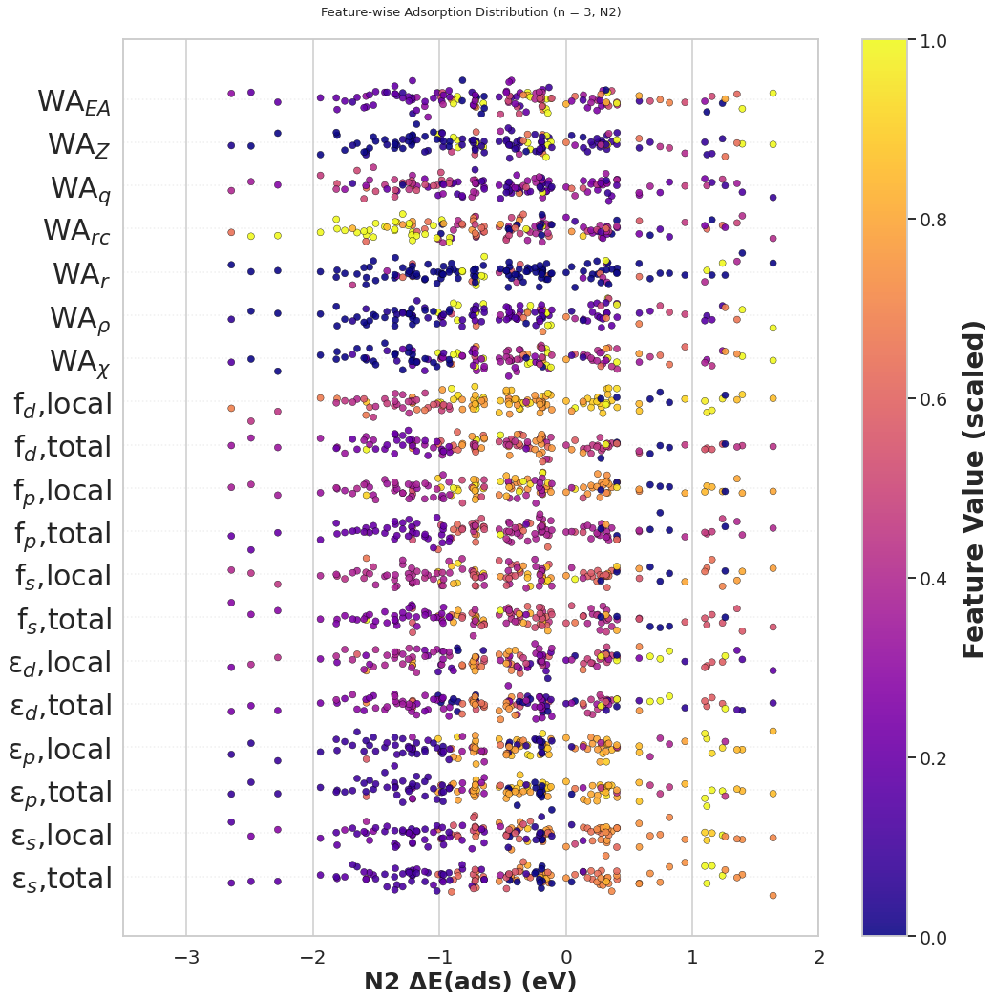

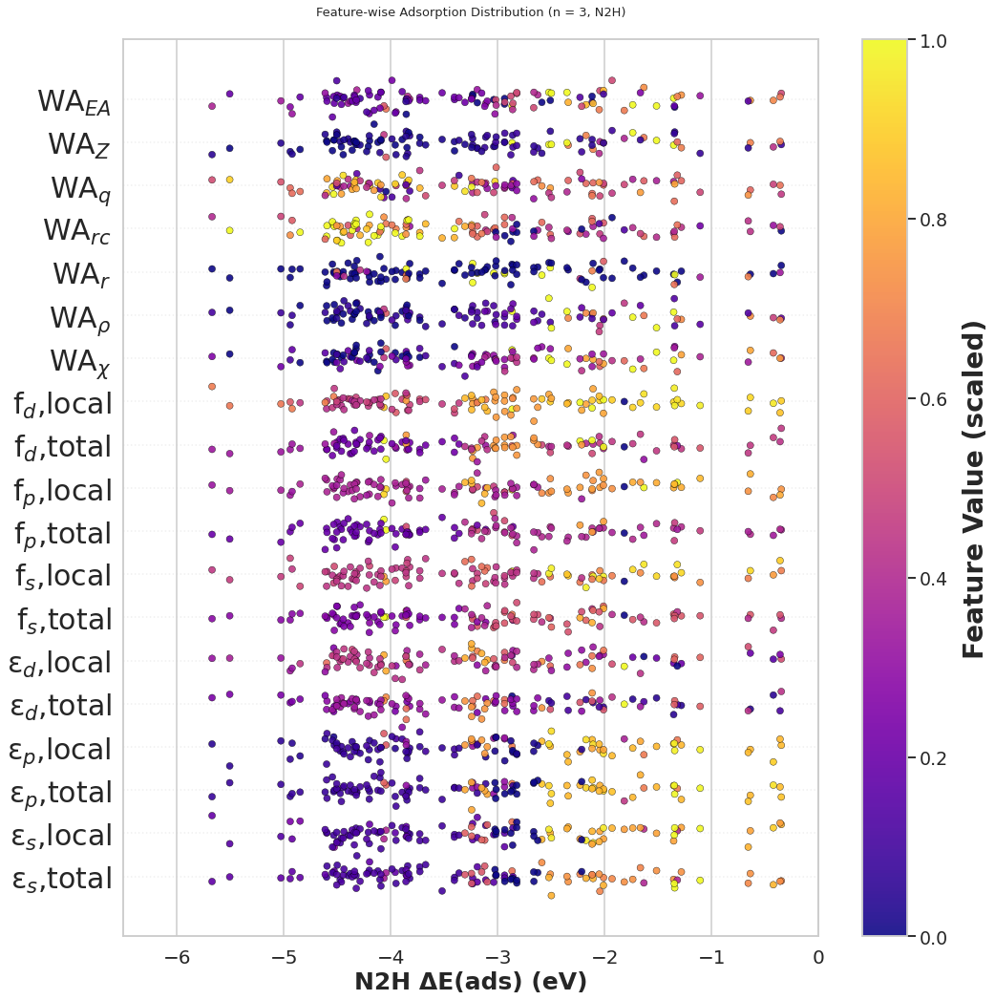

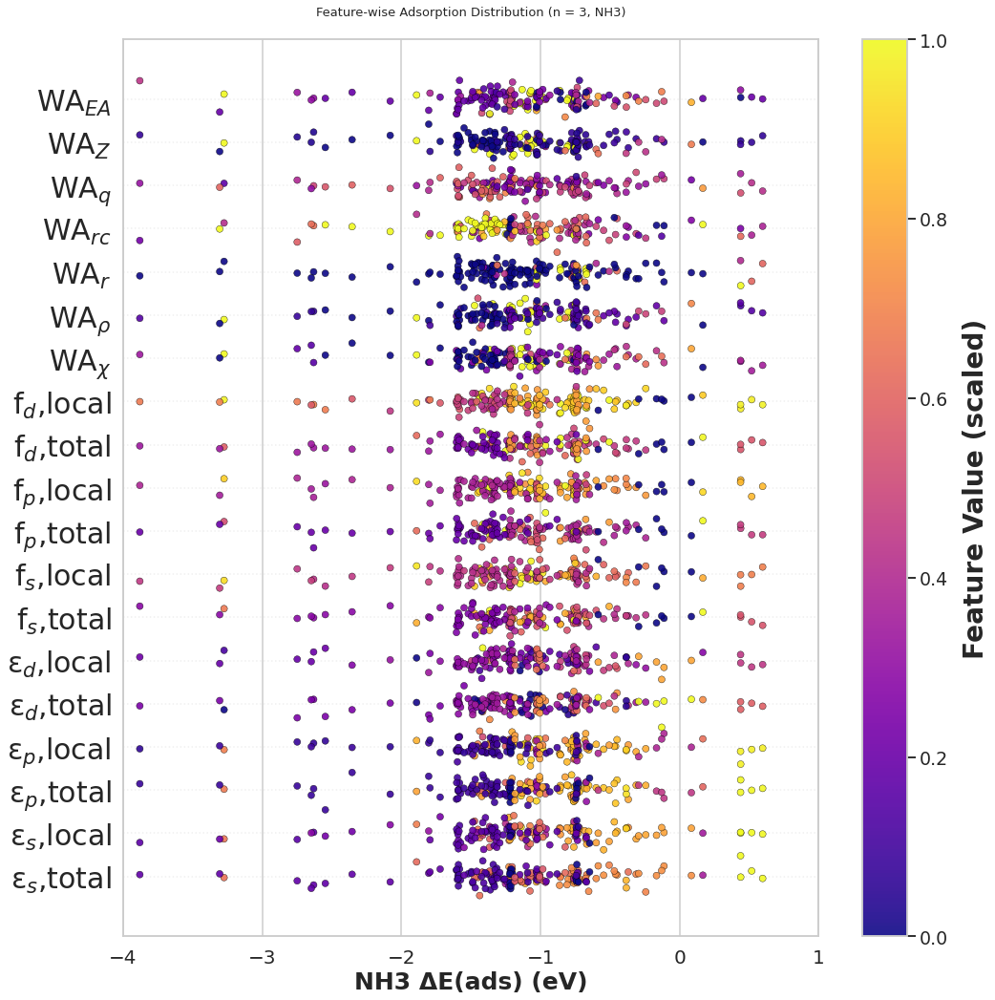

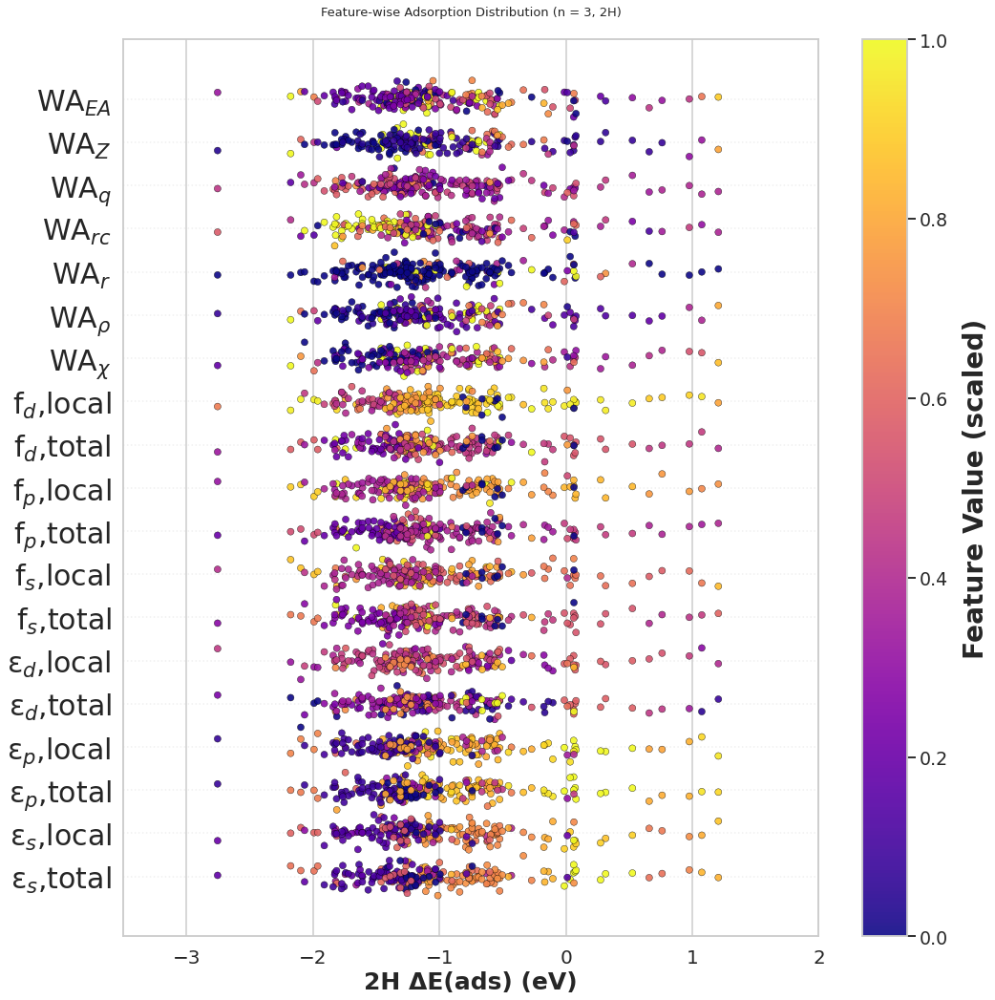

In [102]:
df_N2_noAlZn = df_N2[~df_N2['material'].str.contains('Al|Zn', case=False, na=False)]
df_N2H_noAlZn = df_N2H[~df_N2H['material'].str.contains('Al|Zn', case=False, na=False)]
df_NH3_noAlZn = df_NH3[~df_NH3['material'].str.contains('Al|Zn', case=False, na=False)]
df_H2_noAlZn = df_H2[~df_H2['material'].str.contains('Al|Zn', case=False, na=False)]


df_info_beeswarms = [(df_N2_noAlZn[df_N2_noAlZn['Mol_is_adsorbed']==1],'N2',3,(-3.5,2)),
                     (df_N2H_noAlZn[df_N2H_noAlZn['Mol_is_adsorbed']==1],'N2H',3,(-6.5,0)),
                     (df_NH3_noAlZn[df_NH3_noAlZn['Mol_is_adsorbed']==1],'NH3',3,(-4,1)),
                     (df_H2_noAlZn[df_H2_noAlZn['atomic_is_adsorbed']==1],'2H',3,(-3.5,2)),
                    ]
for i in df_info_beeswarms:
    df, mol_name, n, xlimit  = i
    plot_featurewise_beeswarm_ads_e(df, n, mol=mol_name,colormap='plasma',xlim_=xlimit,filename_suffix='_noAlZn')
                     

In [103]:
def plot_scaling_one_no_hue(
    df_x, df_y,
    x_name="N2", y_name="N2H",
    energy_col="ads_e",
    material_col="material", site_col="ad_site_number",

    # per-side filtering & name cleaning
    filter_adsorbed_x=True, ads_flag_col_x="Mol_is_adsorbed", ads_value_x=1, clean_names_x=True,
    filter_adsorbed_y=True, ads_flag_col_y="Mol_is_adsorbed", ads_value_y=1, clean_names_y=True,
    filter_fn_x=None, filter_fn_y=None,

    # plot
    figsize=(10, 8),
    dpi=600, save_path=None,
    title_prefix=None
):
    """
    Scaling: ΔE(y) vs ΔE(x), with no color hue (all points same color).
    """

    gX, gY = df_x.copy(), df_y.copy()

    if filter_adsorbed_x and ads_flag_col_x in gX.columns:
        gX = gX[gX[ads_flag_col_x] == ads_value_x]
    if filter_adsorbed_y and ads_flag_col_y in gY.columns:
        gY = gY[gY[ads_flag_col_y] == ads_value_y]

    if callable(filter_fn_x): gX = filter_fn_x(gX)
    if callable(filter_fn_y): gY = filter_fn_y(gY)

    if clean_names_x and material_col in gX.columns:
        gX[material_col] = gX[material_col].astype(str).apply(_strip_prefix)
    if clean_names_y and material_col in gY.columns:
        gY[material_col] = gY[material_col].astype(str).apply(_strip_prefix)

    # ----- merge aligned sites -----
    keys = [material_col, site_col]
    scaling_df = pd.merge(
        gY[keys + [energy_col]],
        gX[keys + [energy_col]],
        on=keys, how="inner",
        suffixes=(f"_{y_name}", f"_{x_name}")
    ).dropna(subset=[f"{energy_col}_{y_name}", f"{energy_col}_{x_name}"])

    if scaling_df.empty:
        raise ValueError("No overlapping rows after merge with current filters.")

    # ----- fit & metrics -----
    x = scaling_df[f"{energy_col}_{x_name}"].values
    y = scaling_df[f"{energy_col}_{y_name}"].values
    slope, intercept, yhat = _linear_fit_and_residuals(x, y)
    r2, mae = r2_score(y, yhat), mean_absolute_error(y, yhat)

    # ----- plot -----
    sns.set(style="whitegrid", context="talk", font_scale=1.2)
    plt.figure(figsize=figsize)

    plt.scatter(
        scaling_df[f"{energy_col}_{x_name}"],
        scaling_df[f"{energy_col}_{y_name}"],
        color="#87CEEB", edgecolor="black", linewidth=0.9, s=200, alpha=0.9
    )

    xs = np.linspace(np.nanmin(x), np.nanmax(x), 200)
    line, = plt.plot(xs, slope * xs + intercept, color="crimson", lw=3)

    plt.xlabel(f"{x_name} ΔE(ads) (eV)", fontsize=25, fontweight="bold")
    plt.ylabel(f"{y_name} ΔE(ads) (eV)", fontsize=25, fontweight="bold")

    x_flags = []
    if filter_adsorbed_x: x_flags.append(f"{ads_flag_col_x}={ads_value_x}")
    if clean_names_x:     x_flags.append("clean_names")
    y_flags = []
    if filter_adsorbed_y: y_flags.append(f"{ads_flag_col_y}={ads_value_y}")
    if clean_names_y:     y_flags.append("clean_names")

    if title_prefix is None:
        title_prefix = f"Scaling: ΔE({y_name}) vs ΔE({x_name})"

    plt.title(
        f"{title_prefix}\n"
        f"X[{', '.join(x_flags) if x_flags else 'no filters'}] | "
        f"Y[{', '.join(y_flags) if y_flags else 'no filters'}]",
        fontsize=18, fontweight="bold", pad=25
    )

    plt.legend(
        [line],
        [f"fit: y = {slope:.2f}x + {intercept:.2f}\nR²={r2:.3f}, MAE={mae:.3f}"],
        loc="best", frameon=True
    )

    plt.grid(ls="--", alpha=0.35)
    plt.tight_layout()
    if save_path:
        pass
        #plt.savefig(save_path, dpi=dpi, bbox_inches="tight")
    plt.show()

    return {"scaling_df": scaling_df, "slope": slope, "intercept": intercept, "r2": r2, "mae": mae}


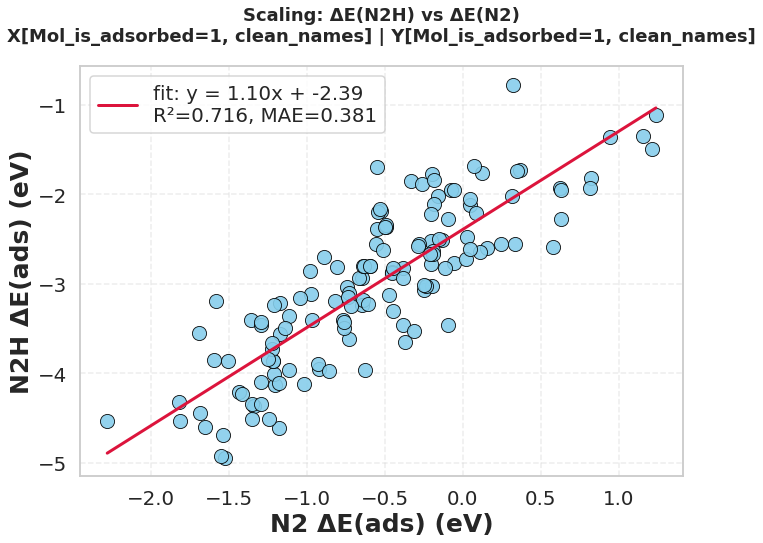

In [104]:
df_1, mol1_name = df_N2_f, 'N2'
df_2, mol2_name = df_N2H_f,'N2H'
out = plot_scaling_one_no_hue(
    df_x=df_1, df_y=df_2,
    x_name=mol1_name, y_name=mol2_name,
    filter_adsorbed_x=True, ads_flag_col_x="Mol_is_adsorbed", ads_value_x=1,
    save_path =working_dir + f'scaling_band/{mol1_name}_{mol2_name}_scaling.pdf'
)



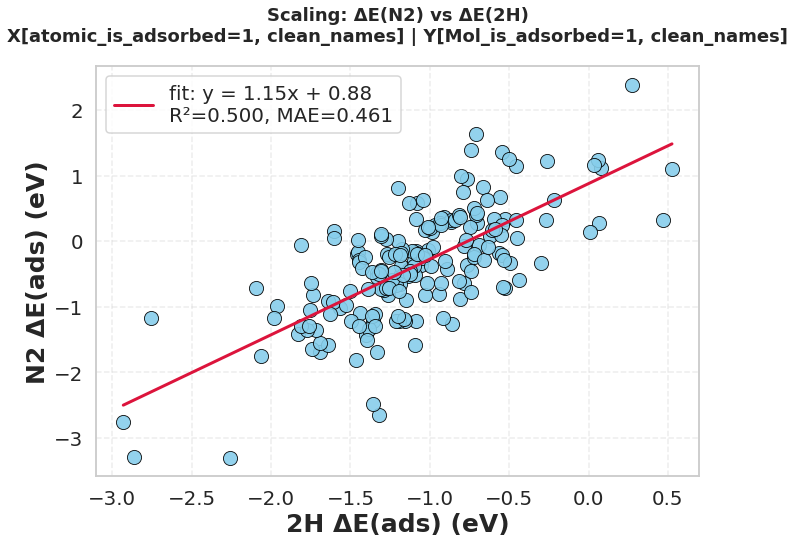

In [105]:
df_1, mol1_name = df_H2_f, '2H'
df_2, mol2_name = df_N2_f,'N2'
out = plot_scaling_one_no_hue(
    df_x=df_1, df_y=df_2,
    x_name=mol1_name, y_name=mol2_name,
    filter_adsorbed_x=True, ads_flag_col_x="atomic_is_adsorbed", ads_value_x=1,
    save_path =working_dir + f'scaling_band/{mol1_name}_{mol2_name}_scaling.pdf'
)



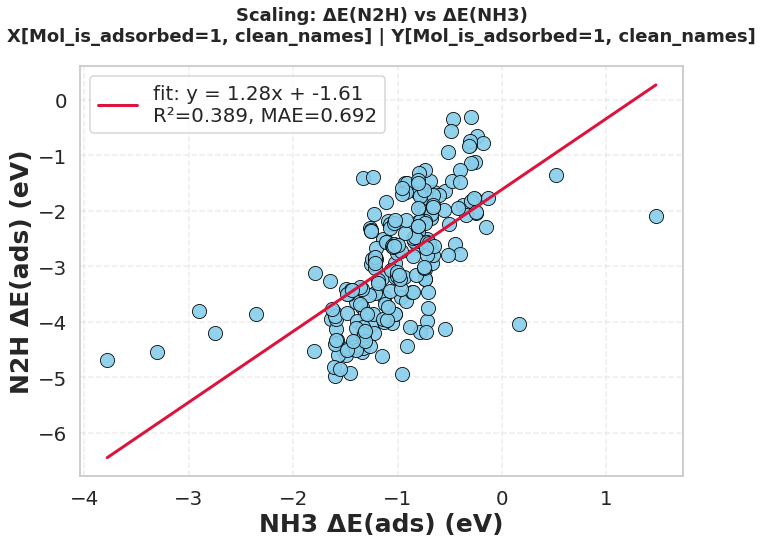

In [106]:
df_1, mol1_name = df_NH3_f, 'NH3'
df_2, mol2_name = df_N2H_f,'N2H'
out = plot_scaling_one_no_hue(
    df_x=df_1, df_y=df_2,
    x_name=mol1_name, y_name=mol2_name,
    filter_adsorbed_x=True, ads_flag_col_x="Mol_is_adsorbed", ads_value_x=1,
    save_path =working_dir + f'scaling_band/{mol1_name}_{mol2_name}_scaling.pdf'
)



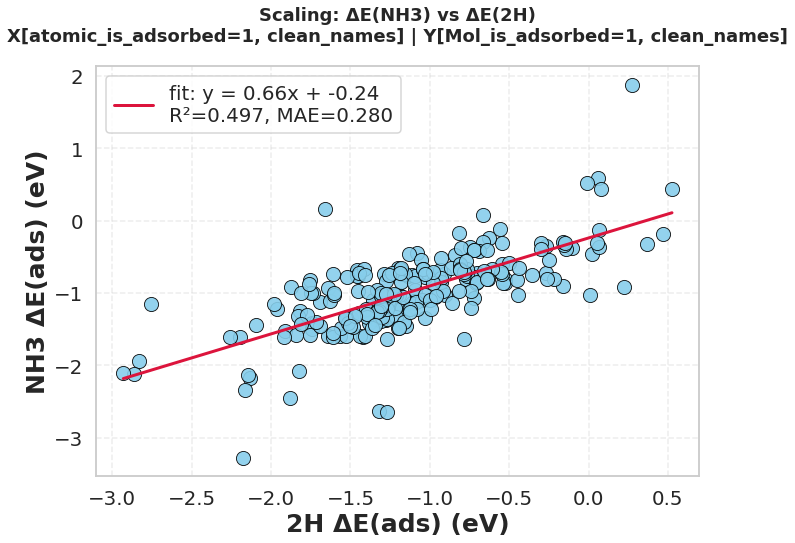

In [107]:
df_1, mol1_name = df_H2_f, '2H'
df_2, mol2_name = df_NH3_f,'NH3'
out = plot_scaling_one_no_hue(
    df_x=df_1, df_y=df_2,
    x_name=mol1_name, y_name=mol2_name,
    filter_adsorbed_x=True, ads_flag_col_x="atomic_is_adsorbed", ads_value_x=1,
    save_path =working_dir + f'scaling_band/{mol1_name}_{mol2_name}_scaling.pdf'
)



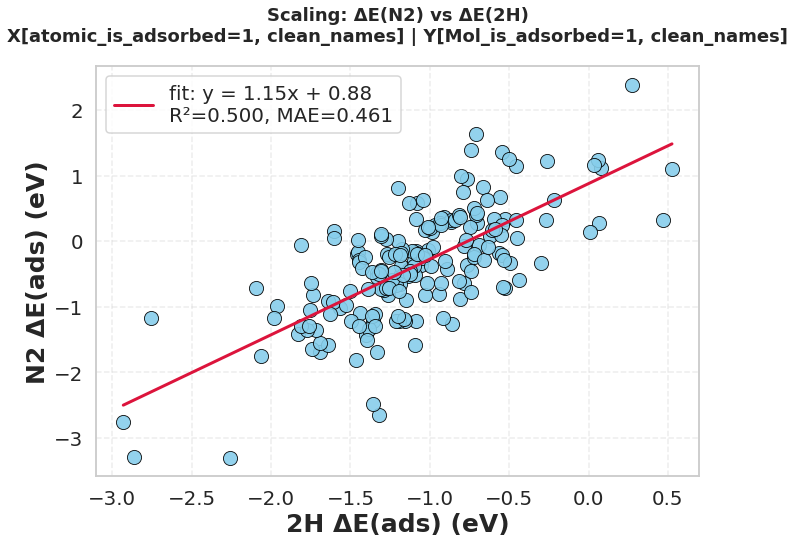

In [108]:
df_1, mol1_name = df_H2_f, '2H'
df_2, mol2_name = df_N2_f,'N2'
out = plot_scaling_one_no_hue(
    df_x=df_1, df_y=df_2,
    x_name=mol1_name, y_name=mol2_name,
    filter_adsorbed_x=True, ads_flag_col_x="atomic_is_adsorbed", ads_value_x=1,
    save_path =working_dir + f'scaling_band/{mol1_name}_{mol2_name}_scaling.pdf'
)



In [109]:
df_N2_f["material"].unique()

array(['0_Co3Ni', '1_CoPt3', '3_Fe3Co', '4_FeCo', '5_FeNi3', '6_FePt3',
       '7_NiPt', '8_VPt', '10_Zn11Co2', '13_Zn3Cu', '14_Zn8Cu5',
       '15_ZnCu', '17_Co3Pt', '18_Cu3Pt', '19_CuPt7', '20_Fe9Co7',
       '21_FeNi', '23_Ni3Pt', '24_NiPt3', '25_V3Pt', '31_Zn3Pt',
       '32_Zn9Fe4', '33_ZnNi', '34_ZnPt3', '1_Al3Ni', '5_AlNi3', '6_AlV',
       '7_V3Ni', '8_VFe3', '10_Al3Ni2', '11_Al3V', '13_AlFe', '15_AlV3',
       '16_V3Ni2', '18_Al2Cu', '20_Al4Cu9', '21_AlCo', '22_AlFe3',
       '24_V3Co', '26_VNi3', '27_Al2Pt', '28_Al3Pt2', '31_AlNi',
       '32_AlPt3', '33_V3Fe', '34_VCo3', '35_VZn3'], dtype=object)

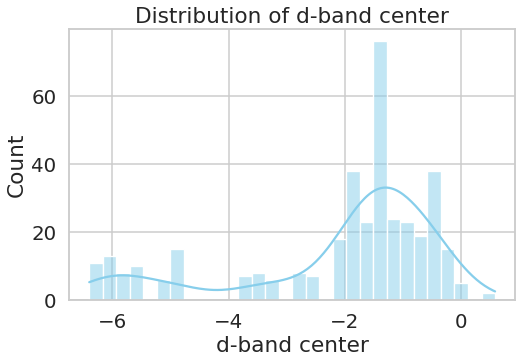

In [110]:
# Drop NaN values if any
data = df_N2H_f["n0_n1_dos_total_dband_center"].dropna()

# Plot the distribution
plt.figure(figsize=(8, 5))
sns.histplot(data, kde=True, bins=30, color="skyblue")
plt.xlabel("d-band center")
plt.title("Distribution of d-band center")
plt.grid(True)
plt.show()


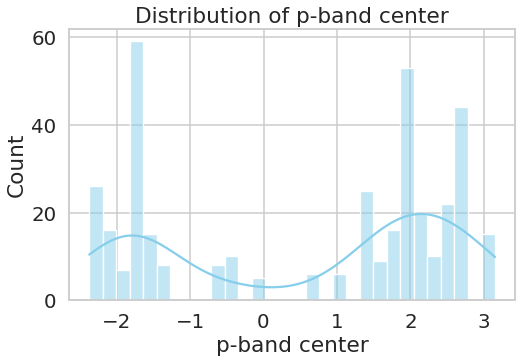

In [111]:
# Drop NaN values if any
data = df_N2H_f["n0_n1_dos_total_pband_center"].dropna()

# Plot the distribution
plt.figure(figsize=(8, 5))
sns.histplot(data, kde=True, bins=30, color="skyblue")
plt.xlabel("p-band center")
plt.title("Distribution of p-band center")
plt.grid(True)
plt.show()

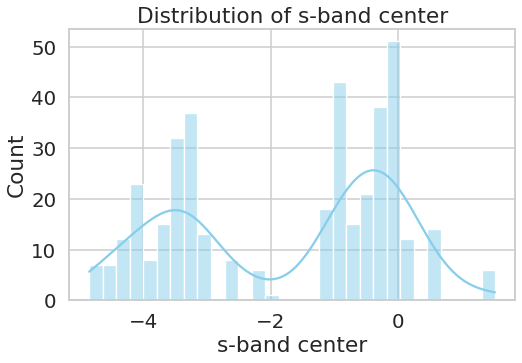

In [112]:
# Drop NaN values if any
data = df_N2_f["n0_n1_dos_total_sband_center"].dropna()

# Plot the distribution
plt.figure(figsize=(8, 5))
sns.histplot(data, kde=True, bins=30, color="skyblue")
plt.xlabel("s-band center")
plt.title("Distribution of s-band center")
plt.grid(True)
plt.show()

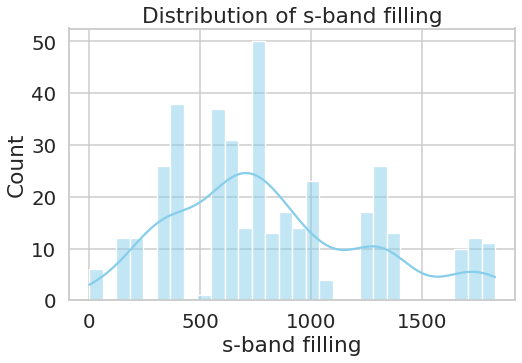

In [113]:
# Drop NaN values if any
data = df_N2_f["n0_n1_dos_total_dband_sum"].dropna()

# Plot the distribution
plt.figure(figsize=(8, 5))
sns.histplot(data, kde=True, bins=30, color="skyblue")
plt.xlabel("s-band filling")
plt.title("Distribution of s-band filling")
plt.grid(True)
plt.show()